# Addiscore - Une application au service de la santé publique
- **Projet 3 du parcours « Data Scientist » d’OpenClassrooms**
- **Mark Creasey**

## Étape 2 : Analyse exploratoire

L'agence "Santé publique France" a **lancé un appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation.** 

<a href="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" class="oc-imageLink oc-imageLink--disabled"><img src="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" alt="L'agence Santé publique France"></a>

#### Bibliothèques utilisées dans ce notebook
- numpy, pandas, 
- matplotlib, seaborn
- scikit-learn, scipy, statsmodels
- missingno

In [1]:
# Si besoin, decommentariser la ligne suivant pour installer les bibliothèques
# !pip install numpy, pandas, matplotlib, seaborn, scikit-learn, scipy, statsmodels, missingno

Table de matières<a name="toc"></a>


- [1. Idée de l’application](#1.-Idée-de-l’application)
  - [Objectif: Simplifier le choix des plats préparés](#Objectif:-Simplifier-le-choix-des-plats-préparés)
  - [Les groupes NOVA](#Les-groupes-NOVA)
  - [Le NUTRISCORE, qui ne prend pas en compte les additifs](#Le-NUTRISCORE,-qui-ne-prend-pas-en-compte-les-additifs)
  - [Les additifs sont omniprésents](#Les-additifs-sont-omniprésents)
  - [Besoin de simplifier les indicateurs pour choisir l’alimentation](#Besoin-de-simplifier-les-indicateurs-pour-choisir-l’alimentation)
  - [ADDISCORE : un indicateur SIMPLE](#ADDISCORE-:-un-indicateur-SIMPLE)
- [2. Import des données nettoyées](#2.-Import-des-données-nettoyées)
  - [2.1 Bibliothèques Python](#2.1-Bibliothèques-Python)
  - [2.2 Definition de l'environnement](#2.2-Definition-de-l'environnement)
  - [2.3 Import des données](#2.3-Import-des-données)
  - [2.3.2 Import les données nettoyés](#2.3.2-Import-les-données-nettoyés)
- [3. Analyses univariées<a name="analyses_univariees"></a>](#3.-Analyses-univariées<a-name="analyses_univariees"></a>)
  - [3.1 Bibliothèque de fonctions communes](#3.1-Bibliothèque-de-fonctions-communes)
  - [3.2 Déscription des variables](#3.2-Déscription-des-variables)
  - [3.3 Contributions sur le temps](#3.3-Contributions-sur-le-temps)
  - [3.4 Distribution des données (manquantes)](#3.4-Distribution-des-données-(manquantes))
  - [3.5 Intersections des données](#3.5-Intersections-des-données)
  - [3.6 Effet de suppression des données manquantes sur les distributions](#3.6-Effet-de-suppression-des-données-manquantes-sur-les-distributions)
  - [3.7 Conclusion](#3.7-Conclusion)
  - [3.8 Supprimer au lieu d'imputer les valeurs manquantes](#3.8-Supprimer-au-lieu-d'imputer-les-valeurs-manquantes)
- [4. Analyses multivariées](#4.-Analyses-multivariées)
  - [4.1 Analyses sur le nombre d'additifs](#4.1-Analyses-sur-le-nombre-d'additifs)
  - [4.2 Analyses sur le nutriscore grade](#4.2-Analyses-sur-le-nutriscore-grade)
  - [4.3 Analyses sur le nutriscore score](#4.3-Analyses-sur-le-nutriscore-score)
- [5. Analyse des additifs (par tag)](#5.-Analyse-des-additifs-(par-tag))
  - [5.1 Import des données des additifs](#5.1-Import-des-données-des-additifs)
  - [5.2 Filtre les classes d'additifs par ceux qui sont present dans la base de données](#5.2-Filtre-les-classes-d'additifs-par-ceux-qui-sont-present-dans-la-base-de-données)
  - [5.3 Additives present dans plus de 100 produits](#5.3-Additives-present-dans-plus-de-100-produits)
  - [5.4 Clustering des additifs](#5.4-Clustering-des-additifs)
  - [5.5 Classes d'additifs](#5.5-Classes-d'additifs)
  - [5.6 Additifs nocifs pour la santé](#5.6-Additifs-nocifs-pour-la-santé)
  - [5.7 Huile de palme: Additifs qui peuvent accélérer le metastasis de cancer](#5.7-Huile-de-palme:-Additifs-qui-peuvent-accélérer-le-metastasis-de-cancer)
- [6. ADDISCORE](#6.-ADDISCORE)
  - [6.1 Création de l'addiscore](#6.1-Création-de-l'addiscore)
  - [6.2 Nombre d'additifs par addiscore (risque groups)](#6.2-Nombre-d'additifs-par-addiscore-(risque-groups))
  - [6.3 Nutriscore par addiscore_risk](#6.3-Nutriscore-par-addiscore_risk)
  - [6.4 NOVA groupes par addiscore risk](#6.4-NOVA-groupes-par-addiscore-risk)
  - [6.5 PNNS groups par addiscore_risk](#6.5-PNNS-groups-par-addiscore_risk)
  - [6.6 Analyse temporelle d'addiscore risk](#6.6-Analyse-temporelle-d'addiscore-risk)
- [7 Clustering des additifs](#7-Clustering-des-additifs)
  - [7.1 Correlation entre les additifs de risque modéré et haut](#7.1-Correlation-entre-les-additifs-de-risque-modéré-et-haut)
  - [Visualise produits avec additifs nocifs par catégorie - Pie Charts](#Visualise-produits-avec-additifs-nocifs-par-catégorie---Pie-Charts)
  - [Crosstab heatmap (2 vars catégoriques)](#Crosstab-heatmap-(2-vars-catégoriques))
  - [Stacked bar chart (2 vars catégoriques)](#Stacked-bar-chart-(2-vars-catégoriques))
  - [Colonnes très corrélées entre eux](#Colonnes-très-corrélées-entre-eux)
- [8 Analyse en Composants Principales (ACP)](#8-Analyse-en-Composants-Principales-(ACP))
- [9. Système de Recommendation](#9.-Système-de-Recommendation)
  - [9.2 Autres systems de recommendation](#9.2-Autres-systems-de-recommendation)
- [10. Conclusion : Comment éviter les additifs (nocifs) dans les plats prêts à consommer](#10.-Conclusion-:-Comment-éviter-les-additifs-(nocifs)-dans-les-plats-prêts-à-consommer)
- [11 Wordclouds](#11-Wordclouds)
  - [11.1 Wordclouds - types de produit (main_category_en) contenant des additifs nocifs](#11.1-Wordclouds---types-de-produit-(main_category_en)-contenant-des-additifs-nocifs)

# 1. Idée de l’application 

- **Choisir** des **plats préparés** est **trop compliqué**
    - nutriscore, nova_group, ecoscore, nb. additifs, ...
    - ingredients en plusieurs langues trop petit et incomprehensible
- Besoin d’**indication des risques** relatifs pour sa santé.

## Objectif: Simplifier le choix des plats préparés

### Le public ciblé et ses besoins
- **Plats préparés** (NOVA groupes 3 et 4): _pas le temps, l’espace, les moyens ou l'envie de cuisiner_
- **Pas cher** : _pas l'argent pour manger bio / restaurant /  acheter tout frais_
- **Facile à identifier** : risques relatifs pour **la santé.**


## Les groupes NOVA
1. Aliments non transformés 
2. Ingrédients culinaires transformés
3. **Aliments transformés**
4. **Produits ultra-transformés**

- <https://fr.openfoodfacts.org/nova>
- Le groupe NOVA
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-1.svg" title="NOVA 1 - Unprocessed or minimally processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-2.svg" title="NOVA 2 - Processed culinary ingredients">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-3.svg" title="NOVA 3 - Processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-4.svg" title="NOVA 4 - Ultra processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-unknown.svg" title="NOVA not computed - Food processing level unknown">



## Le NUTRISCORE, qui ne prend pas en compte les additifs
- le **NUTRISCORE grade** A B C D ou E   
<img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-c.svg" title="Nutri-Score C - Average nutritional quality">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-unknown.svg" title="Nutri-Score not computed - Unknown nutritional quality">

- le **NUTRISCORE score** (-20 à + 40)


## Les additifs sont omniprésents
Les catégories de **(nombre d'additifs)** utilisées par OpenFoodFacts :
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/0-additives.svg" title="Without additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/3-additives.svg" title="3 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/4-additives.svg" title="4 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/additives-unknown.svg" title="Additives not computed - Missing ingredients list">




## Besoin de simplifier les indicateurs pour choisir l’alimentation
- le NUTRISCORE
- la groupe NOVA
- le nombre d’additifs
- et autres …



## ADDISCORE : un indicateur SIMPLE

### addiscore_risk
catégorie basé sur la **PRESENCE** d'additifs à risque:
- 🟩 A: aucun additif
- 🟨 B: avec additifs risque bas 
- 🟧 C: avec additifs risque modéré  de sur-exposure
- 🟥 D: avec additifs haut risque de sur-exposure
- ❔ U: Sans information des additifs

### addiscore
score numérique basé sur le **NOMBRE** d'additifs à risque dans chaque categorie de risk:

```
addiscore = 
   1 * [nb.additifs risque bas]
 + 2 * [nb.additifs risque modérés]
 + 5 * [nb.additifs risque haut]
```
Note: Formule du score à évaluer

---

# 2. Import des données nettoyées

## 2.1 Bibliothèques Python
### 2.1.1 Import des bibliothèques utilisées par ce notebook

In [2]:
def install_libraries(required=None) -> None:
    import sys
    import subprocess
    import pkg_resources
    installed = {pkg.key for pkg in pkg_resources.working_set}
    missing = set(required) - set(installed)
    if missing:
        print(f'missing libraries: {missing}')
        python = sys.executable
        subprocess.check_call([python, '-m', 'pip', 'install', *missing],
                              stdout=subprocess.DEVNULL)


install_libraries({'numpy', 'pandas', 'matplotlib', 'seaborn', 
'matplotlib-venn', 'missingno', 'scikit-learn', 'scipy', 'statsmodels'})


In [3]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm


### 2.1.2 Liste des versions des bibliothèques utilisées

L'exploration était faite en développement local, utilisant numpy 1.21.2

Google Colab utilise numpy 1.19 pour compatibilité entre les autres bibliothèques de l'environnement, qui empêche de faire certaines analyses

Si besoin, mettre à jour numpy sur colab avec la commande

```
!pip install numpy --upgrade --ignore-installed
```


In [4]:
!python --version
print('versions des bibliothèques utilisées:')
print('; '.join(f'{m.__name__}=={m.__version__}' for m in globals(
).values() if getattr(m, '__version__', None)))


Python 3.9.7
versions des bibliothèques utilisées:
numpy==1.21.2; pandas==1.3.4; seaborn==0.11.2; statsmodels.api==0.13.1


#### Copie des versions (pour reproduire l'environnement exact)

        Python 3.9.7
        versions des bibliothèques utilisées:
        numpy==1.21.2; pandas==1.3.4; seaborn==0.11.2; requests==2.26.0; json==2.0.9


### 2.1.3 Configuration défauts d'affichage


In [5]:
pd.set_option('display.max_columns', 100)  # pour afficher toutes les colonnes
pd.set_option('display.max_colwidth', 100)
%matplotlib inline
sns.set_theme(style="white", context="notebook")
sns.set_color_codes("pastel")
sns.set_palette("tab20")


## 2.2 Definition de l'environnement

- Kaggle Kernel
- Google Colab
- Développement local (avec échantillon de 200 Mo de données)

### 2.2.1 Noms des fichiers de données (identique pour nettoyage et l'analyse exploratoire)

- Le grand fichier des données de OpenFoodFacts est placé dans `DATA_FOLDER` au préalable
- Tous les autres fichiers de données sont téléchargés ou créés pendant le nettoyage, puis enregistrés dans `OUT_FOLDER`


In [6]:
# IMAGE_SUBFOLDER='nettoyage' # P3_nettoyage.ipynb
IMAGE_SUBFOLDER = 'analyse'  # P3_exploration.ipynb


In [7]:
# Données
ZIPPED_DATA_FILENAME = 'en.openfoodfacts.org.products.zip'
RAW_DATA_FILENAME = 'en.openfoodfacts.org.products.csv'
RAW_DATA_DICT = 'raw_data_dict.csv'
SAMPLE_DATA_FILENAME = 'data_sample.csv'  # 100,000 registres
CLEAN_DATA_FILENAME = 'cleaned_data_openfoodfacts.csv'
CLEAN_DATA_SAMPLE = 'cleaned_data_sample.csv'  # 100,000 registres
CLEAN_DATA_DICT = 'cleaned_data_dict.csv'
# Données supplémentaires
ADDITIVES_DETAIL = 'additives_detail.csv'
ADDITIVES_COUNT = 'additives_count.csv'

DEBUG = False  # If True, print debug information
# If True, save sample_data (n=100000) for use in local ENV
SAVE_SAMPLE = False
SAVE_PNG = True  # If True, fig.savefig('IMAGE_FOLDER/my_image.png')

ENV = 'local'

if ENV == 'kaggle':
    DATA_FOLDER = '/kaggle/input/openfoodfacts'
    OUT_FOLDER = '/kaggle/working/'
    IMAGE_FOLDER = f'/kaggle/working/images/{IMAGE_SUBFOLDER}'

elif ENV == 'colab':
    # Colaboratory - uncomment les 2 lignes suivant pour connecter à votre drive
    #from google.colab import drive
    # drive.mount('/content/drive')
    DATA_FOLDER = '/content/drive/MyDrive/data'
    OUT_FOLDER = '/content/drive/MyDrive/data'
    IMAGE_FOLDER = f'/content/drive/MyDrive/images/{IMAGE_SUBFOLDER}'

else:
    # if ENV=='local':
    # local development
    DATA_FOLDER = 'data/raw'
    OUT_FOLDER = 'data/out'
    IMAGE_FOLDER = f'images/{IMAGE_SUBFOLDER}'


### 2.2.2 Fonctions utilitaires système
- os_make_dir
- to_png (enregistre un graphique) 

In [8]:
def os_path_join(folder, file):
    """remplacement pour `os.path.join(folder, file)` sur windows"""
    return f'{folder}/{file}'


def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)


os_make_dir(DATA_FOLDER)
os_make_dir(OUT_FOLDER)
os_make_dir(IMAGE_FOLDER)

SAVE_PNG = True


def to_png(fig_name=None):
    def get_title():
        if plt.gcf()._suptitle is None:
            return plt.gca().get_title()
        else:
            return plt.gcf()._suptitle.get_text()

    if SAVE_PNG:
        """Enregistre l'image"""

        if fig_name is None:
            fig_name = get_title()
        elif len(fig_name) < 9:
            fig_name = f'{fig_name}_{get_title()}'
        else:
            pass
        fig_name = fig_name.replace(' ', '_').replace(':', '-').replace('.', '-').replace('/', '_')
        print(f'"{fig_name}.png"')
        plt.gcf().savefig(os_path_join(IMAGE_FOLDER,
                                       f'{fig_name}.png'), bbox_inches="tight")


if ENV == 'local':
    CLEAN_DATA = os_path_join(OUT_FOLDER, CLEAN_DATA_SAMPLE)
else:
    CLEAN_DATA = os_path_join(OUT_FOLDER, CLEAN_DATA_FILENAME)
print(f'data file pour analyse exploratoire: {CLEAN_DATA}')


data file pour analyse exploratoire: data/out/cleaned_data_sample.csv


### 2.2.3 Palettes pour NUTRISCORE, groupe NOVA, nb_additifs

In [9]:
nutriscore_palette = {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
nova_palette = {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
additive_palette = {'sans': '#008000', '1 à 3': '#f06000', '4+': '#ff0000', 'NaN': '#b3b3b3'}

### 2.2.4 Palette de l'ADDISCORE (nouvelle palette)

In [10]:
addiscore_palette = {'A_none': '#00d26a', 'B_low': '#fcd53f', 'C_mod': '#ff6723', 'D_high': '#f8312f'}

In [11]:
# Ordre d'affichage des catégories
# pour eviter de trièr par palette.keys() chacque fois
nutriscore_order = ['a', 'b', 'c', 'd', 'e']
nova_order = ['1', '2', '3', '4']
addiscore_order = ['A_none', 'B_low', 'C_mod', 'D_high']

def get_palette(feature_name):
    if feature_name == 'nutriscore_grade':
        return nutriscore_palette
    elif feature_name == 'nova_group':
        return nova_palette
    elif feature_name == 'addiscore_risk':
        return addiscore_palette
    else:
        return None


def get_palette_df(df: pd.DataFrame, feature='nova_group', nb=10, exclude_values: list = None) -> dict or None:
    """return dict(keys,colors) for tag column or category column"""
    palette = get_palette(feature)
    if palette is None:
        series: pd.Series = df[feature]
        if series.dtype.kind in 'biufc': return None  # numeric features dont have palette
        if series.str.contains(',').any():
            series = series.str.split(',').explode()
            # exclude values
        if not (exclude_values is None):
            print(f'{series.name}, exclude nb: {len(exclude_values)}')
            # palette for top 10 tags
            series = series[~series.isin(exclude_values)]
        groups = series.value_counts().head(nb).index
        nb_features = min(len(groups), nb)
        groups = groups[:nb_features]
        if nb_features < 11:
            colors = sns.color_palette("tab10").as_hex()[:nb_features]
        else:
            colors = sns.color_palette("tab20").as_hex()[:nb_features]
        palette = dict(zip(groups, colors))
    return palette

# test
(pd.DataFrame('A,B,C,D,E,F,G'.split(','), columns={'test'})
 .pipe(get_palette_df, 'test', nb=3, exclude_values=['B', 'C']))


test, exclude nb: 2


{'A': '#1f77b4', 'D': '#ff7f0e', 'E': '#2ca02c'}

"color_palettes.png"


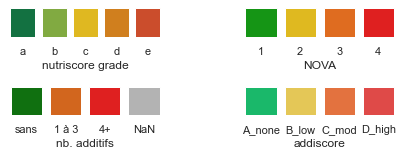

In [12]:
def plot_palettes():
    def plot_palette(palette: dict, ax=None, titre='palette', nb=0):
        pal = palette.keys()
        nb = len(pal) if nb == 0 else nb
        if ax is None:
            _, ax = plt.subplots(figsize=(nb, 1))
        g = sns.barplot(x=list(pal), y=np.ones(nb), palette=palette, ax=ax)
        g.set_xlabel(titre)
        g.axes.yaxis.set_visible(False)
        sns.despine(left=True, bottom=True)

    plt.subplots(2, 2, figsize=(7, 2))
    plot_palette(nutriscore_palette, ax=plt.subplot(3, 2, 1), titre='nutriscore grade')
    plot_palette(nova_palette, ax=plt.subplot(3, 2, 2), titre='NOVA')
    plot_palette(additive_palette, ax=plt.subplot(3, 2, 5), titre='nb. additifs')
    plot_palette(addiscore_palette, ax=plt.subplot(3, 2, 6), titre='addiscore')
    plt.subplots_adjust(wspace=0.5, hspace=0.3)


plot_palettes()
to_png('color palettes')


## 2.3 Import des données 

### 2.3.1 Import du dictionnaire de données (des types pour chaque colonne)

Le dictionnaire des données nettoyées a été enregistré en même temps que les données nettoyées
Il est utilisé pour assurer les données nettoyées sont interprétés correctement.


In [13]:
def drop_colonnes_sans_nom(df: pd.DataFrame):
    """Colonnes qui commencent par Unnamed sont en général les 'index' des dataframes
     produit par export pd.to_csv par défaut, sans interet"""
    unnamed_cols = list(df.columns[df.columns.str.startswith('Unnamed')])
    if len(unnamed_cols) > 0:
        return df.drop(unnamed_cols, axis=1)
    else:
        return df


In [14]:
DATA_DICT = os_path_join(OUT_FOLDER, CLEAN_DATA_DICT)
data_dict_df = pd.read_csv(DATA_DICT, encoding='UTF-8',
                           sep='\t')

data_dict_df.head()


,Unnamed: 0,column,count,unique,dtype,max_length
0,0,code,1555277,1555277.0,object,24.0
1,1,creator,1555274,13290.0,object,27.0
2,2,created_datetime,1555277,NaN,datetime64[ns],NaN
3,3,last_modified_datetime,1555277,NaN,datetime64[ns],NaN
4,4,product_name,1546101,1279206.0,object,111.0


#### 2.3.1.1 Supprime datetime types du dictionnaire

- (pd.read_csv n'accepte pas `datetime64[ns]` com dtype)


In [15]:
date_col_filter = data_dict_df['column'].str.endswith(('_datetime', '_t'))
date_cols = data_dict_df[date_col_filter]['column'].tolist()
data_dict_df = data_dict_df[~date_col_filter]
data_dict = dict(zip(data_dict_df['column'], data_dict_df['dtype'].values))
list(data_dict.items())[13:17]


[('ingredients_that_may_be_from_palm_oil_n', 'Int64'),
 ('ingredients_that_may_be_from_palm_oil_tags', 'object'),
 ('nutriscore_score', 'float64'),
 ('nutriscore_grade', 'category')]

## 2.3.2 Import les données nettoyés 
- avec l'aide du dictionnaire de types 

In [16]:
cleaned_data = pd.read_csv(CLEAN_DATA, sep='\t', header=0,
                           encoding='utf-8',
                           dtype=data_dict,
                           parse_dates=date_cols,
                           infer_datetime_format=True,
                           low_memory=True)  # Warning: dtypes

# Si on a oublié d'enregistrer les données nettoyées sans index,
# alors l'index est en colonne 'Unnamed: 0'
if 'Unnamed: 0' in cleaned_data.columns:
    cleaned_data = cleaned_data.drop('Unnamed: 0', axis=1)

In [17]:
cleaned_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 33 columns):
 #   Column                                                 Non-Null Count   Dtype         
---  ------                                                 --------------   -----         
 0   code                                                   100000 non-null  object        
 1   creator                                                100000 non-null  object        
 2   created_datetime                                       100000 non-null  datetime64[ns]
 3   last_modified_datetime                                 100000 non-null  datetime64[ns]
 4   product_name                                           99435 non-null   object        
 5   brands_tags                                            59358 non-null   object        
 6   categories_en                                          49756 non-null   object        
 7   labels_en                                              23

In [18]:
print(cleaned_data['nova_group'].dtype)
print(cleaned_data['nova_group'].count())
cleaned_data['nova_group'].value_counts()


category
35935


4.0    23899
3.0     7508
1.0     3901
2.0      627
Name: nova_group, dtype: int64

#### 2.3.2.2 Corriger le type de nova_group (catégorie, pas une valeur numérique)


In [19]:
def corrigir_nova_group(df:pd.DataFrame):
    if not 'nova_group' in df.columns:
        return df
    print(df['nova_group'].dtype)
    print(df['nova_group'].count())
    # data_df['nova_group'].value_counts()
    df = df.copy()
    df['nova_group'] = df['nova_group'].astype(str)
    df['nova_group'] = df['nova_group'].str[0:1]
    df['nova_group'] = df['nova_group'].replace('n', np.nan)
    df['nova_group'] = df['nova_group'].astype('category')
    return df


cleaned_data = cleaned_data.pipe(corrigir_nova_group)
cleaned_data['nova_group'].value_counts()


category
35935


4    23899
3     7508
1     3901
2      627
Name: nova_group, dtype: int64

#### 2.3.2.3 Convertir les types 'category' en 'object'
- C'est plus facil de filtre sur les colonnes de category si ils sont de type objet:
- certains operations ne sont pas possible s'ils sont catégorique:
`df=df[df['categorie_colonne'].fillna('').contains('meat')]`
- à faire plus tard: refaire les filtres pour accepter les colonnes catégoriques


In [20]:
def category_to_object(df: pd.DataFrame, subset=None):
    """
    Convertir les types 'category' en 'object'
    Plus simple pour des filtres via .fillna('') qui ne fonctionne pas
    Pandas groupby drop les NaN si le type d'un colonne est category, meme avec dropna=False
       Pour faire groupby avec group NaN (ex: calcule % du total), il faut convertir type category en objet
    """
    categ_cols = df.select_dtypes('category').columns.tolist()
    print(categ_cols)
    df = df.copy()
    if not subset is None:
        # convertir en type 'object' seulement les colonnes dans subset
        categ_cols = [col for col in categ_cols if col in subset]
    for col in categ_cols:
        df[col] = df[col].astype('object')
    return df


def object_to_category(df:pd.DataFrame):
    """Convertir les colonnes catégoriques de type 'object' en 'category'"""
    categ_cols = df.columns[df.columns.str.contains(
        'grade|group', case=False, regex=True)].tolist()
    print(categ_cols)
    df = df.copy()
    for col in categ_cols:
        df[col] = df[col].astype('category')
    return df


cleaned_data = cleaned_data.pipe(category_to_object)
# cleaned_data=cleaned_data.pipe(object_to_category)

# vérifier que les 'catégories' n'ont pas changés
cleaned_data['nova_group'].value_counts()


['nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2']


4    23899
3     7508
1     3901
2      627
Name: nova_group, dtype: int64

In [21]:
cleaned_data.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 33 entries, code to fruits-vegetables-nuts-estimate-from-ingredients_100g
dtypes: Int64(3), datetime64[ns](2), float64(10), object(18)
memory usage: 25.5+ MB


In [22]:
pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
pd.set_option('display.max_rows', 10)  # pour afficher max 10 lignes
pd.set_option('display.max_colwidth', 100)
cleaned_data.head(5)


,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
0,8017130002011,smias,2017-03-23 12:42:57,2019-02-18 09:59:04,Hafterflocken Zart,wurzener,"Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breakfasts,Cereals and th...",NaN,"Germany,Italy",_Hafer_,0,NaN,NaN,0,NaN,0,NaN,-5.0,a,1,Cereals and potatoes,Breakfast cereals,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Rolled oats,1545.0,5.50,1.10,62.0,1.00,8.3,13.00,0.004,0.0
1,7792129003538,openfoodfacts-contributors,2020-04-24 19:45:18,2020-11-16 01:48:49,sucralosa,sucaryl,"Sweeteners,Food additives,Sugar substitutes,Artificial sugar substitutes,Sucralose","No gluten,es:Sin TACC",Argentina,"Dextrosa, Maltodextrina, Sucralosa 1,54%",1,en:e955,E955 - Sucralose,0,NaN,0,NaN,NaN,NaN,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Sucralose,1490.0,0.00,0.00,88.8,0.00,0.0,0.00,0.000,0.0
2,851554006020,kiliweb,2018-03-01 14:06:42,2020-04-23 20:53:04,"Mango / coconut organic superfood smoothie, mango / coconut",NaN,Snacks,Organic,"France,United States","Mango*, banana*, apple*, water, brown rice protein*, flax seed*, coconut cream*, lemon juice con...",0,NaN,NaN,0,NaN,0,NaN,-1.0,a,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Snacks,418.0,2.92,0.00,15.0,8.33,1.7,4.17,0.008,10.0
3,8594161960102,tacite,2016-11-29 16:28:37,2017-12-21 07:07:01,Supreme Energy Gum,"l-a-fuel,l-a-fuel","Snacks,Sweet snacks,Confectioneries,Chewing gum,Sugar-free chewing gum","Low or no sugar,Not advised for specific people,No gelatin,No preservatives,No sugar,Not advised...",France,"Édulcorants : maltitol, sorbitol, xylitol, mannitol, aspartame, acésulfame K, sucralose ; gomme ...",13,"en:e171,en:e322,en:e322i,en:e414,en:e420,en:e421,en:e500,en:e500ii,en:e903,en:e905,en:e905c,en:e...","E171 - Titanium dioxide,E322 - Lecithins,E322i - Lecithin,E414 - Acacia gum,E420 - Sorbitol,E421...",0,NaN,0,NaN,NaN,NaN,4,Sugary snacks,Sweets,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Sugar-free chewing gum,536.0,0.21,0.04,51.1,0.00,2.8,0.00,0.000,0.0
4,3330720237774,kiliweb,2020-09-09 07:39:02,2020-10-14 20:08:29,Pâte à tartiner Chocolat blanc,lucien-georgelin,NaN,NaN,France,NaN,<NA>,NaN,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients to be completed,Expiration date to be comp...",NaN,2234.0,32.00,10.00,50.0,46.00,NaN,12.00,NaN,NaN


---

# 3. Analyses univariées<a name="analyses_univariees"></a>


## 3.1 Bibliothèque de fonctions communes

Cette section contient les fonctions utilisées par plusieurs analyses:
- fonctions pour 'exploser' les colonnes de tags (pays, additives_tags, categories...)
- filtres
  - par les tags plus frequents
  - par pays, année, groupe
  - par catégorie dans un liste de catégories (exemple additifs in additifs_haut_risque)
- groupe par année (effectif / fréquence / % total par année)

- tests statistiques
  - normalité 
  - homoscedascité
  - F-ANOVA / t-tests
  - H-ANOVA / U-tests  (non-parametrique)
  - Tukey analyse post hoc


### 3.1.1 Explode series/dataframe; effectif/ fréquence
- explode series / explode frame (pour les colonnes des tags)
- effectif / fréquence (filtre_par_top_freq)

In [23]:
def is_category(df: pd.DataFrame, col: str) -> bool:
    """Determiner si un variable est catégorique ou non"""
    return len(df[[col]].select_dtypes('category').columns.tolist()) > 0


cleaned_data.pipe(is_category, 'nova_group')


False

In [24]:
def explode_series(series) -> pd.Series:
    """convertir ['a,b,c','d,e','f']--> ['a','b','c','d','e','f']  """
    if series.str.contains(',').any():
        return series.str.split(',').explode()
    else:
        return series.explode()


cleaned_data['additives_en'].dropna().head(2).pipe(explode_series)


1           E955 - Sucralose
3    E171 - Titanium dioxide
3           E322 - Lecithins
3           E322i - Lecithin
3          E414 - Acacia gum
              ...           
3        E950 - Acesulfame k
3           E951 - Aspartame
3           E955 - Sucralose
3            E965 - Maltitol
3             E967 - Xylitol
Name: additives_en, Length: 18, dtype: object

In [25]:
def explode_frame(df: pd.DataFrame, col=None):
    """Convertir une colonne à une liste, puis exploser la dataframe sur cette colonne"""
    df = df.copy()
    if col is None:
        col = df.columns.to_list()[0]
    df[col] = df[col].str.split(',')
    return df.explode(col)

# test
(cleaned_data[['additives_tags', 'brands_tags']].dropna().head(5)
 .pipe(explode_frame, 'additives_tags')).head()


,additives_tags,brands_tags
1,en:e955,sucaryl
3,en:e171,"l-a-fuel,l-a-fuel"
3,en:e322,"l-a-fuel,l-a-fuel"
3,en:e322i,"l-a-fuel,l-a-fuel"
3,en:e414,"l-a-fuel,l-a-fuel"


In [26]:
def filtre_par_top_freq(df:pd.DataFrame, col, nb=10, others=True) -> pd.Series:
    """Filtre les registres par les plus frequent top n tags de la colonne col,
       plus les autres dans catégorie 'other'
       Marche pour colonnes categoriques et colonnes de tags
    """
    nb = max(1, nb)
    top = explode_series(df[col]).value_counts()[:nb]
    if others:
        return df[col].where(df[col].isna() | df[col].isin(top.index), other='other')
    else:
        return df[col].where(df[col].isna() | df[col].isin(top.index))

cleaned_data.pipe(filtre_par_top_freq, col='additives_tags', nb=6).value_counts()


other      21874
en:e330     1415
en:e415      282
en:e322      123
en:e471       91
en:e500       36
Name: additives_tags, dtype: int64

In [27]:
def top_n_freq(df:pd.DataFrame, col, nb=10, others=True, normalize=False):
    """
    Conter la fréquence des n tags plus fréquents
    return: value_counts comme un dataframe
    """
    nb = max(1, nb)
    counts_df = (explode_series(df[col]).value_counts(normalize=normalize)
            .to_frame(name='freq')
            .rename_axis(col)
    )
    nb=min(nb,len(counts_df))
    top_n=counts_df.head(nb).copy()
    if others:
        top_n.loc['other', 'freq']= counts_df.iloc[nb:,0].sum()
    return top_n.reset_index()    


print (cleaned_data['creator'].value_counts(normalize=True)[:5])
cleaned_data.pipe(top_n_freq, col='creator', nb=5,
                  others=True, normalize=True)

kiliweb                       0.56398
usda-ndb-import               0.09964
openfoodfacts-contributors    0.08335
org-database-usda             0.05920
foodvisor                     0.01647
Name: creator, dtype: float64


,creator,freq
0,kiliweb,0.56398
1,usda-ndb-import,0.09964
2,openfoodfacts-contributors,0.08335
3,org-database-usda,0.05920
4,foodvisor,0.01647
5,other,0.17736


### 3.1.2 Top n fréquence - bar charts


"1-1-2_Top_pays_répresentés_dans_les_produits.png"


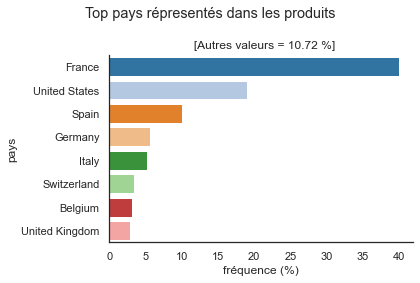

In [28]:
def plot_bar_top_n(df:pd.DataFrame, col, nb=20, others=True, normalize=False, sort_values=False, palette=None,
                   ylabel=None, titre='', soustitre=''):
    data = top_n_freq(df, col, nb, others, normalize).copy()
    # print(data.columns.to_list())
    other_count = 0
    if others:
        filter_other = data[col] == 'other'
        other_count = data[filter_other]['freq'].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data[col], x=data['freq'] * 100, palette=palette)
        ax.set_xlabel('fréquence (%)')
    else:
        ax = sns.barplot(y=data[col], x=data['freq'], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        else: other_count=f'{int(other_count)}'     
        autres = f' [Autres valeurs = {other_count}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


cleaned_data.pipe(plot_bar_top_n, col='countries_en', nb=8,
                  titre='Top pays répresentés dans les produits',
                  ylabel='pays', normalize=True)
to_png('1.1.2')


"Top_pays_répresentés_dans_les_produits_avec_info_sur_les_additifs.png"


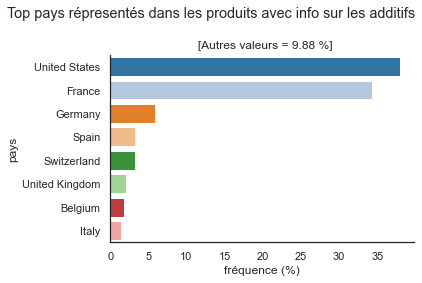

In [29]:
cleaned_data.dropna(subset=['additives_n']).pipe(plot_bar_top_n, col='countries_en', nb=8,
                                                 titre='Top pays répresentés dans les produits avec info sur les additifs',
                                                 ylabel='pays', normalize=True)
to_png()


### 3.1.3 Filtres
- colonnes dans dataframe
- filtre par tag (filtre générique)
- filtre par pays
- filtre par an
- filtre par catégorie dans une liste (multifiltre)


In [30]:
print(list(cleaned_data.columns))


['code', 'creator', 'created_datetime', 'last_modified_datetime', 'product_name', 'brands_tags', 'categories_en', 'labels_en', 'countries_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


In [31]:
def cols_in_df(df: pd.DataFrame, colonnes: list = None) -> list:
    """Procedure pour identifier les colonnes existantes dans le dataframe"""
    ret_cols = []
    for col in colonnes:
        if col in df.columns:
            ret_cols.append(col)
    return ret_cols


cols_in_df(cleaned_data, ['additives_tags',
                          'additives_en', 'brands', 'brands_tags'])


['additives_tags', 'additives_en', 'brands_tags']

#### Filtre générique


In [32]:
def filter_by_tag(df: pd.DataFrame, tag_col='countries_en', tag='France'):
    return df[df[tag_col].fillna('').str.contains(tag, case=False, regex=True)]


cleaned_data.pipe(filter_by_tag, 'additives_en', 'titanium dioxide')[
    'additives_en'].count()


616

##### Couverture de brands (exemple 'Carrefour') 
"Carrefour est dédié aux grandes courses : un assortiment de **20 000 à 80 000** références de produits"

- <https://www.carrefour.com/fr/groupe/points-de-vente>


In [33]:
nb_cree=cleaned_data.pipe(filter_by_tag,'creator', 'carrefour')['creator'].count()

nb_brands=cleaned_data.pipe(filter_by_tag, 'brands_tags','carrefour')['brands_tags'].count()

print (f'Carrefour: nb. produits crées: {nb_cree}; nb. brands = {nb_brands}')

Carrefour: nb. produits crées: 64; nb. brands = 1075


#### Filtre par NOVA groupe

In [34]:
def filter_by_nova_group(df:pd.DataFrame, nova_group=4):
    if nova_group is None:
        return df
    return df[df['nova_group'].astype(str) == str(nova_group)]


print(cleaned_data.pipe(filter_by_nova_group, 4).shape)

(23899, 33)


#### Filtre par pays


In [35]:

def filter_by_country(df:pd.DataFrame, country='France'):
    return filter_by_tag(df, 'countries_en', tag=country)


print(cleaned_data.pipe(filter_by_country, 'France').shape)
print(cleaned_data.pipe(filter_by_country, 'United States').shape)


(42441, 33)
(20152, 33)


"Top_additifs_répresentés_dans_les_produits.png"


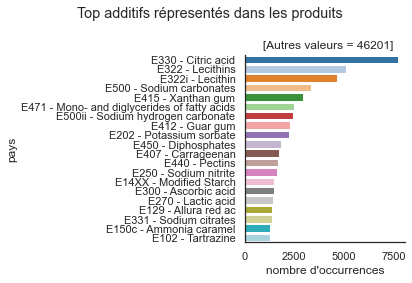

In [36]:
(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(plot_bar_top_n, col='additives_en', nb=20,
       titre='Top additifs répresentés dans les produits',
       ylabel='pays', normalize=False)
 )
to_png()


#### Filtre par an


In [37]:
from datetime import datetime


def filter_by_year(df:pd.DataFrame, start=2012, end=None, col='last_modified_datetime'):
    if end is None:
        end = start
    if end < start:
        swap = start
        start = end
        end = swap
    debut = datetime(start, 1, 1)
    fin = datetime(end + 1, 1, 1)
    return df[(df[col] >= debut) & (df[col] <= fin)]
    # plus lent :
    # return df[df[col].dt.year >=start & df[col].dt.year <=end]


def filter_by_year_last_modified(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='last_modified_datetime')


def filter_by_year_created(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='created_datetime')


cleaned_data.pipe(filter_by_year_last_modified, 2017)[
    'created_datetime'].dt.year.value_counts()


2017    1717
2016     113
2015      64
2013      22
2014      16
2012       5
Name: created_datetime, dtype: int64

#### Filtre par catégorie in list


In [38]:
def filter_by_categorie_in(df:pd.DataFrame, categ_col='pnns_groups_1', categs=None):
    return df[df[categ_col].fillna('').isin(categs)]


cleaned_data.pipe(filter_by_categorie_in, 'pnns_groups_1',
                  ['Sugary snacks', 'Salty snacks']).shape


(10558, 33)

#### Filtre par tags in list

### 3.1.4 Groupby fonctions (groupby year, ...)

In [39]:
def col_group_by_year(df: pd.DataFrame, col=None, groupby_var='nutriscore_grade', aggfunc='mean',
                      date_col='created_datetime'):
    """visualiser l'évolution dans le temps, basé sur date_col"""
    df = df.copy()
    if aggfunc in ['mean', 'max', 'min']:
        df[col] = df[col].astype(float)

    if groupby_var is None:
        groupby_year = pd.pivot_table(df,
                                      values=col,
                                      index=[df[date_col].dt.year],
                                      aggfunc={col: aggfunc},
                                      fill_value='na', margins=False, margins_name='Total', observed=False, sort=True)
    else:
        groupby_year = (pd.pivot_table(df,
                                       values=col,
                                       index=[groupby_var,
                                              df[date_col].dt.year],
                                       columns=None,
                                       aggfunc={col: aggfunc},
                                       fill_value='na', margins=False, margins_name='Total', observed=False, sort=True)
                        .unstack(level=0)
                        # Reduire le nombre de niveaux sur colonnes
                        .droplevel(0, axis='columns')
                        )

    return groupby_year


print('moyenne nb. additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc='mean')
        .style.background_gradient().format(precision=2)
)


moyenne nb. additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,0.33,1.48,1.88,1.40,2.00
2013,0.58,1.72,1.64,2.16,2.79
2014,1.02,2.16,1.98,2.31,2.99
2015,0.80,1.58,2.05,2.56,2.65
2016,0.80,1.32,1.60,2.41,2.12
2017,0.71,1.74,1.98,2.96,3.24
2018,0.68,1.50,1.62,2.03,2.12
2019,0.76,1.31,1.81,2.18,2.28
2020,0.91,1.99,2.39,3.16,3.96


In [40]:
print('nb. produits avec additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc=lambda x: (x > 0).sum())
)


nb. produits avec additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,9,14,16,21,22
2013,24,39,55,56,50
2014,38,48,78,95,71
2015,75,102,174,247,172
2016,90,86,219,283,239
2017,557,680,1300,2389,1618
2018,196,298,506,714,569
2019,104,175,320,433,278
2020,391,507,861,1433,1048


### 3.1.5 Tests de normalité


In [41]:
def format_stat_p(stat, p, name=None):
    ch = f'{name} : ' if name else ''
    ch += f'stat={stat:.3f}, p={p:.3f}'
    if p < 0.001:
        ch += '***'
    elif p < 0.01:
        ch += '**'
    elif p < 0.05:
        ch += '*'
    return ch


def print_normal_stat_p(testname:str, stat:float, p:float, alpha=0.05)->None:
    """"Créer une chaine pour répondre à un test de normalité"""
    ch = format_stat_p(stat, p, testname)
    # reject H0 if p<=0.05
    if p > alpha:
        ch = f'{ch} : accept H0: probablement Gaussian'
    else:
        ch = f'{ch} : reject H0: probablement pas Gaussian'
    print(ch)

#### 3.1.5.1 Shapiro-Wilk test (sample size < 100)

In [42]:
from scipy.stats import shapiro
from scipy.stats import f_oneway


def test_shapiro(series, alpha=0.05):
    """Shapiro-Wilk test (1965)"""
    stat, p = shapiro(series)
    print_normal_stat_p(f'Shapiro-Wilk [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Shapiro-Wilk')


test_shapiro(cleaned_data['nutriscore_score'].dropna())


Shapiro-Wilk [nutriscore_score] : stat=0.974, p=0.000*** : reject H0: probablement pas Gaussian


C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


(0.0, 'Shapiro-Wilk : stat=0.974, p=0.000***')

#### 3.1.5.1 Kolmogorov-Smirnov goodness of fit test
- tests the distribution F(x) of an observed random variable against the normal distribution
- can be used to test against other distributions

In [43]:
# Kolmogorov-Smirnov goodness of fit test
# tests the distribution F(x) of an observed random variable against the normal distribution
from scipy.stats import kstest


def test_kolmogorov_smirnov(series, alpha=0.05):
    stat, p = kstest(series, 'norm')
    print_normal_stat_p(f'Kolmogorov-Smirnov [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Kolmogorov-Smirnov')


test_kolmogorov_smirnov(cleaned_data['nutriscore_score'].dropna().sample(100))

Kolmogorov-Smirnov [nutriscore_score] : stat=0.687, p=0.000*** : reject H0: probablement pas Gaussian


(1.5463486094080083e-47, 'Kolmogorov-Smirnov : stat=0.687, p=0.000***')

In [44]:
def test_normality(series, alpha=0.05):
    s = series.astype(float).dropna()
    if len(s) < 50:
        p, ch = test_shapiro(s)
    else:
        p, ch = test_kolmogorov_smirnov(s)
    if p > alpha:
        choix = 'accept H0: probablement Gaussian'
    else:
        choix = 'reject H0: probablement pas Gaussian'
    return p, ch, choix


test_normality(cleaned_data['nutriscore_score'].sample(20))
test_normality(cleaned_data['nutriscore_score'].sample(80))
test_normality(cleaned_data['nutriscore_score'].sample(800))


Shapiro-Wilk [nutriscore_score] : stat=0.920, p=0.434 : accept H0: probablement Gaussian
Shapiro-Wilk [nutriscore_score] : stat=0.951, p=0.144 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [nutriscore_score] : stat=0.721, p=0.000*** : reject H0: probablement pas Gaussian


(1.506905995305582e-159,
 'Kolmogorov-Smirnov : stat=0.721, p=0.000***',
 'reject H0: probablement pas Gaussian')

### 3.1.6 Tests de homoscédasticité
#### 3.1.6.1 Bartlett test (samples avec distribution normale)
#### 3.1.6.2 Levene test (samples sans distribution normale)

In [45]:
from scipy.stats import bartlett, levene


def test_bartlett(groups: list, alpha=0.05):
    """A parametric test for equality of k variances for normally distributed groups"""
    stat, p = bartlett(*groups)
    ch = format_stat_p(stat, p, 'Bartlett homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Bartlett test, accept H0: groups have similar variance'
    else:
        choix = 'Bartlett test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def test_levene(groups: list, alpha=0.05):
    """A robust parametric test for equality of k variances when group samples are not normally distributed"""
    # *groups = list comprehension
    stat, p = levene(*groups)
    ch = format_stat_p(stat, p, 'Levene homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Levene test, accept H0: groups have similar variance'
    else:
        choix = 'Levene test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def group_by_groups(df: pd.DataFrame, y_var: str, groups_var: str):
    data = df[[y_var, groups_var]].dropna()
    data[y_var] = data[y_var].astype(float)  # certain tests n'accepte pas type int
    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))
    return groups


def get_grp_size(groups):
    group_sizes = [len(g) for g in groups]
    return f'(n={np.sum(group_sizes)}), {group_sizes}'


def test_homoscedascity(groups: list, normality=False, alpha=0.05):
    print(f'test_homoscedascity : {get_grp_size(groups)}')
    test_fn = test_bartlett if normality else test_levene
    return test_fn(groups, alpha)


def testing_variances(df:pd.DataFrame):
    def test_homoscedascity_groupby(df, y_var, groups_var, normality=False):
        print(f'Test Homoscedascity, {y_var} grouped by {groups_var}, normality = {normality}')
        groups = group_by_groups(df, y_var, groups_var)
        return test_homoscedascity(groups, normality)

    large_sample = df[['nutriscore_score', 'nova_group']].dropna().sample(600)
    small_sample = large_sample.sample(150)
    print(f'---- Small sample (n={len(small_sample)}) -----------')

    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    print(f'---- Large sample (n={len(large_sample)}) -----------')
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    return None


cleaned_data.pipe(testing_variances)

---- Small sample (n=150) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=150), [15, 3, 38, 94]
Bartlett homoscédasticité : stat=9.585, p=0.022*
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=150), [15, 3, 38, 94]
Levene homoscédasticité : stat=2.866, p=0.039*
Levene test, reject H0: variance of groups is not equal
---- Large sample (n=600) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=600), [67, 11, 149, 373]
Bartlett homoscédasticité : stat=14.385, p=0.002**
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=600), [67, 11, 149, 373]
Levene homoscédasticité : stat=7.178, p=0.000***
Levene test, reject H0: variance of groups is no

### 3.1.7 Tests ANOVA (1-way)

H0 : Les moyennes de variable quantitative y sont les mêmes entre les catégories x
H1 : Les moyennes de variable quantitative y ne sont pas les mêmes entre les catégories x



#### 3.1.7.1 ANOVA pré-requisites
1. les observations sont independent
2. La variable dependant (y) est distribuée normalement pour chaque catégorie (Normalité)
3. L'écart-type est la même pour chaque catégorie (Homoscédasticité)

Si les 3 conditions sont valides, alors les valeurs F et p d'ANOVA sont valables.

Sinon, essaie de faire H-ANOVA en utilisant les tests Kruskal-Wallis.

- Test de normalité : Shapiro-Wilk
- Test de homoscédasticité : Bartlett (si normalité), ou Levene(distributions pas normales)

#### 3.1.7.2 References

- <https://www.pythonfordatascience.org/anova-python/>
- <https://www.marsja.se/four-ways-to-conduct-one-way-anovas-using-python/>
- <https://www.analyticsvidhya.com/blog/2020/06/introduction-anova-statistics-data-science-covid-python/>


#### 3.1.7.3 ANOVA summary

In [46]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scipy.stats import probplot


def anova_table_r(df:pd.DataFrame, groups_var, y_var):
    """get ANOVA table as R like output"""
    # Ordinary Least Squares (OLS) model
    data = df[[groups_var, y_var]].dropna()

    # ols("outcome_variable ~ C(independent_variable)", data= data_frame).fit()
    model = smf.ols(f'{y_var} ~ C({groups_var})', data=data).fit()

    anova_table = sm.stats.anova_lm(model, typ=2)
    print('----ANOVA table (R like)-------')
    print(anova_table)
    print('----ANOVA summary  ------------')
    print(model.summary())
    print('----Shapiro summary  ------------')
    test_shapiro(model.resid.rename('resid'))

    _ = plt.figure(figsize=(4, 4))
    # ax = fig.add_subplot(111)

    normality_plot, stat = probplot(model.resid, plot=plt, rvalue=True)
    plt.gca().set_title("Probability plot of model residual's", fontsize=14)
    plt.show()

    return anova_table


#### 3.1.7.4 T-test
- quand il y a seulement 2 groupes d'observations qui sont distribués normalement
- Null Hypothesis H0: Les 2 groupes vient de la meme population

Si les 2 groupes ne sont pas distribués normalement, il faut utiliser un test non-parametric
- par exemple, Wilcoxon–Mann–Whitney U test

In [47]:
from scipy.stats import ttest_ind


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html

def exemple_t_test(df:pd.DataFrame):
    """Exemple de comment faire un t-test (test normalité avant)"""

    def format_ch(p, alpha):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    # Probablement la variance de nutriscore est égal pour les 2 groupes - il faut tester
    stat, p, ch, choix = test_homoscedascity([group1, group2], normality=True, alpha=0.05)
    equal_var = (p > 0.05)
    alpha = 0.05

    if equal_var:
        stat, p = ttest_ind(group1, group2, equal_var=True)
        print(f"Standard t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")
    else:
        stat, p = ttest_ind(group1, group2, equal_var=False)
        print(f"Welch's t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_t_test)

test_homoscedascity : (n=29165), [16343, 12822]
Bartlett homoscédasticité : stat=14.851, p=0.000***
Bartlett test, reject H0: variance of groups is not equal
Welch's t-test, stat=-1.462, p=0.144, accept H0: ils sont de la même population


### 3.1.8 Non-parametric ANOVA (Kruskal-Wallis)

Utilise si les conditions de normalité et homoscédascité ne sont pas valides

Used to test the null hypothesis which states that ‘k’ number of samples has been drawn from the same population or the identical population with the same or identical median.

- The null hypothesis (H0): la median is equal across all groups.
- The alternative hypothesis: (H1): The median is not equal across all groups.

#### 3.1.8.1 References

- <https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html>
- <https://www.statology.org/kruskal-wallis-test-python/>
- <https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/>
- <https://stats.stackexchange.com/questions/33759/do-we-need-to-report-the-median-or-the-mean-when-using-a-kruskal-wallis-test>


In [48]:
from scipy.stats import kruskal


def test_kruskal(groups: list, showsize=False):
    """Kruskal-Wallis H-test"""
    if showsize: print(f'{get_grp_size(groups)}')
    # compare samples (* = list comprehension)
    stat, p = kruskal(*groups)
    ch = format_stat_p(stat, p, 'Kruskal-Wallis H-test')
    print(ch)
    # interpret
    alpha = 0.05
    if p > alpha:
        choix = 'les médianes ne sont pas significativement différentes, (fail to reject H0)'
    else:
        choix = 'les médianes sont significativement différentes (reject H0)'
    print(choix)
    return p, ch, choix


def test_kruskal_groupby(df:pd.DataFrame, y_var, groups_var):
    print(f'Test Kruskal , {y_var} grouped by {groups_var}')
    groups = group_by_groups(df, y_var, groups_var)
    return test_kruskal(groups, True)


# cleaned_data.pipe(test_kruskal_groupby,'nutriscore_score','pnns_groups_1')
cleaned_data.sample(200).pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')
_ = cleaned_data.pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')


Test Kruskal , nutriscore_score grouped by nova_group
(n=53), [4, 19, 30]
Kruskal-Wallis H-test : stat=10.320, p=0.006**
les médianes sont significativement différentes (reject H0)
Test Kruskal , nutriscore_score grouped by nova_group
(n=26780), [2909, 306, 6444, 17121]
Kruskal-Wallis H-test : stat=4517.357, p=0.000***
les médianes sont significativement différentes (reject H0)


#### 3.1.8.2 (Wilcoxon) Mann–Whitney U test
- quand il y a seulement 2 groupes d'observations qui ne sont pas distribués normalement
- les 2 groupes peuvent avoir n'importe quel distribution
- Null Hypothesis H0: Les 2 groupes vient de la meme population (le médiane est la même)

In [49]:
from scipy.stats import mannwhitneyu


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html

def exemple_u_test(df:pd.DataFrame):
    """Exemple de comment faire un U-test (reject normalité avant)"""

    def format_ch(p, alpha=0.05):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    alpha = 0.05
    stat, p = mannwhitneyu(group1, group2)
    print(f"Mann-Whitney U-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_u_test)

Mann-Whitney U-test, stat=103770632.500, p=0.159, accept H0: ils sont de la même population


#### 3.1.8.3 Effect Size (eta-squared)
(partial) eta-carré est la proportion de la variance représentée par un facteur.

Certaines règles empiriques sont que

- η2 > 0,01 indique un petit effet
- η2 > 0,06 indique un effet moyen
- η2 > 0,14 indique un effet important

(source:<https://www.spss-tutorials.com/anova-what-is-it/>)

In [50]:
def eta_squared(x: pd.Series, y: pd.Series):
    """Calcul du Coefficient of Determination
       example:
          eta2 = eta_squared(x=df[group_var], y= df[y_var])
       x = variable catégorique, y = variable dependant
    """
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x == classe]
        # print(f'classe : {classe}, mean={yi_classe.mean()}')
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    # Total sum of squares = Somme Carré Total
    sct = sum([(yj - moyenne_y) ** 2 for yj in y])
    # Estimated sum of squares = Somme Carré Estimé
    sce = sum([c['ni'] * (c['moyenne_classe'] - moyenne_y) ** 2 for c in classes])

    # Residual sum of squares
    scr = sct - sce
    # degrees of freedom, dof (Total, Estimated, Residual)
    dof_t = y.count() - 1
    dof_e = len(classes) - 1
    dof_r = dof_t - dof_e
    f_value = (sce / dof_e) / (scr / dof_r)
    print(f'f_value: {f_value:.3f}')
    eta2 = sce / sct
    if eta2 > 0.14:
        effet = 'important'
    elif eta2 > 0.06:
        effet = 'moyen'
    elif eta2 > 0.01:
        effet = 'petit'
    else:
        effet = 'insignifiant'
    print(f'η2 = {eta2:.3f}, effet {effet}')
    return eta_squared


def test_eta_squared(df:pd.DataFrame):
    print('effet de nova_group sur nutriscore_score')
    df = df[['nutriscore_score', 'nova_group']].dropna()
    eta_squared(x=df['nova_group'], y=df['nutriscore_score'])

cleaned_data.pipe(test_eta_squared)

effet de nova_group sur nutriscore_score
f_value: 1801.366
η2 = 0.168, effet important


### 3.1.9 Tukey post-hoc test

-Tukey's range test to compare means of all pairs of groups

- <https://en.wikipedia.org/wiki/Tukey%27s_range_test>


In [51]:
import statsmodels.stats.multicomp as mc


def get_pairwise_tukey_table(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    tukey = post_hoc_res.summary()
    return pd.DataFrame(tukey.data[1:], columns=tukey.data[0])

print('nutriscore grouped by nova group')
# cleaned_data.pipe(get_pairwise_tukey_table,y_var='nutriscore_score', groups_var='addiscore_risk',)
cleaned_data.pipe(get_pairwise_tukey_table,
                  y_var='nutriscore_score', groups_var='nova_group')


nutriscore grouped by nova group
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)


,group1,group2,meandiff,p-adj,lower,upper,reject
0,1,2,12.7776,0.0010,11.5202,14.0349,True
1,1,3,8.6041,0.0010,8.1368,9.0714,True
2,1,4,11.7798,0.0010,11.3603,12.1994,True
3,2,3,-4.1734,0.0010,-5.3975,-2.9494,True
4,2,4,-0.9977,0.1453,-2.2043,0.2089,False
5,3,4,3.1757,0.0010,2.8700,3.4815,True


#### 3.1.9.1 Tukey - Visualise les differences entre les moyennes des groupes


----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  12.7776  0.001 11.5202 14.0349   True
     1      3   8.6041  0.001  8.1368  9.0714   True
     1      4  11.7798  0.001 11.3603 12.1994   True
     2      3  -4.1734  0.001 -5.3975 -2.9494   True
     2      4  -0.9977 0.1453 -2.2043  0.2089  False
     3      4   3.1757  0.001    2.87  3.4815   True
----------------------------------------------------
"anova_nutriscore_score_by_nova_group_pairwise_tukey.png"


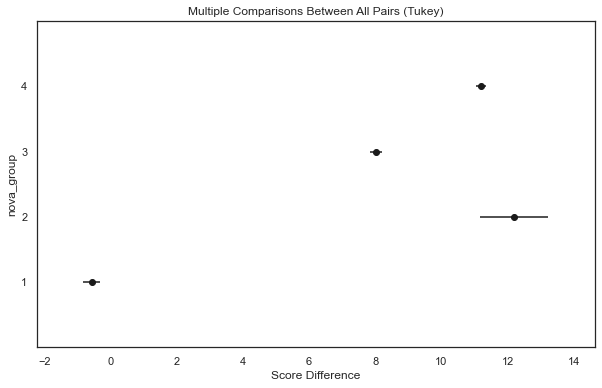

In [52]:

def plot_pairwise_tukey(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    print(post_hoc_res.summary())
    post_hoc_res.plot_simultaneous(
        ylabel=f'{groups_var}', xlabel=f'Score Difference')
    to_png(f'anova_{y_var}_by_{groups_var}_pairwise_tukey')
    plt.show()


cleaned_data.pipe(plot_pairwise_tukey,
                  y_var='nutriscore_score', groups_var='nova_group')



### 3.1.10 Fonctions graphiques

In [53]:

def add_text(ax, x, y, s, **kwargs):
    """Ajouter du texte à un plot"""
    ax.text(x, y, s,
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes, **kwargs)

### 3.1.11 Dictionnaires de traductions
Pour afficher les catégories d'alimentation en français 
- PNNS groups 1
- PNNS groups 2

In [54]:
pnns_1_en = list(cleaned_data['pnns_groups_1'].dropna().unique())
pnns_2_en = list(cleaned_data['pnns_groups_2'].dropna().unique())

In [55]:
pnns_1_fr = ['Céréales et pommes de terre', 'Snacks sucrés', 'Oeufs de viande de poisson', 'Boissons',
             'Aliments composés', 'Matières grasses et sauces', 'Boissons alcoolisées', 'Fruits et légumes',
             'Lait et produits laitiers', 'Snacks salés']
pnns_2_fr = ['Céréales pour le petit-déjeuner', 'Confiseries', 'Viandes transformées', 'Boissons sucrées',
             'Plats simples', 'Pain', 'Céréales', 'Matières grasses', 'Produits chocolatés', 'Abats',
             'Boissons non sucrées', 'Légumineuses', 'Poissons et fruits de mer', 'Boissons alcoolisées',
             'Pizzas et quiches', 'Légumes', 'Lait et yaourt', 'Biscuits et gâteaux', 'Garnitures et sauces', 'Noix',
             'Fromage', 'Viande', 'Boissons artificiellement sucrées', 'Produits salés et gras', 'Pommes de terre',
             'Apéritifs', 'Desserts lactés', 'Glaces', 'Fruits secs', 'Jus de fruits', 'Soupes', 'Oeufs', 'Fruits',
             'Eaux et eaux aromatisées', 'Pâtisseries', 'Thés tisanes et cafés', 'Substituts de lait végétal',
             'Sandwichs', 'Nectars de fruits']

In [56]:
pnns1_dict = dict(zip(pnns_1_en, pnns_1_fr))
pnns2_dict = dict(zip(pnns_2_en, pnns_2_fr))


def traduire_categories(categories: list, feature_group=None) -> list:
    if feature_group == 'pnns_groups_1':
        return [pnns1_dict[x] for x in categories]
    elif feature_group == 'pnns_groups_2':
        return [pnns2_dict[x] for x in categories]
    else:
        all_dict = dict(pnns1_dict, **pnns2_dict)
        return [all_dict[x] for x in categories]


print(traduire_categories(pnns_1_en))
print(traduire_categories(pnns_2_en))


['Céréales et pommes de terre', 'Snacks sucrés', 'Oeufs de viande de poisson', 'Boissons', 'Aliments composés', 'Matières grasses et sauces', 'Boissons alcoolisées', 'Fruits et légumes', 'Lait et produits laitiers', 'Snacks salés']
['Céréales pour le petit-déjeuner', 'Confiseries', 'Viandes transformées', 'Boissons sucrées', 'Plats simples', 'Pain', 'Céréales', 'Matières grasses', 'Produits chocolatés', 'Abats', 'Boissons non sucrées', 'Légumineuses', 'Poissons et fruits de mer', 'Boissons alcoolisées', 'Pizzas et quiches', 'Légumes', 'Lait et yaourt', 'Biscuits et gâteaux', 'Garnitures et sauces', 'Noix', 'Fromage', 'Viande', 'Boissons artificiellement sucrées', 'Produits salés et gras', 'Pommes de terre', 'Apéritifs', 'Desserts lactés', 'Glaces', 'Fruits secs', 'Jus de fruits', 'Soupes', 'Oeufs', 'Fruits', 'Eaux et eaux aromatisées', 'Pâtisseries', 'Thés tisanes et cafés', 'Substituts de lait végétal', 'Sandwichs', 'Nectars de fruits']


## 3.2 Déscription des variables
- describe (mean, std, percentiles)
- box plots
- distribution

In [57]:
def cols_nutritionnelles(df:pd.DataFrame):
    return df.columns[(df.columns.str.endswith('_100g')) & ~(df.columns.str.contains('energy'))]


colonnes_100g = cleaned_data.pipe(cols_nutritionnelles)

### 3.2.1 Statisques descriptives (groupby, describe)

In [58]:
cleaned_data.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
count,41330.000000,41330.000000,41330.000000,38750.000000,82147.000000,81774.000000,79176.000000,81781.000000,80554.000000,28476.000000,81828.000000,76906.000000,41240.000000
mean,2.023083,0.021244,0.073385,9.064129,1126.186734,13.280128,4.960985,29.135729,13.545101,3.070758,8.259559,0.555167,8.198861
std,2.910540,0.145700,0.311507,8.849036,789.632659,17.056091,7.656041,27.946336,19.474837,4.876379,9.515703,2.196876,21.426803
min,0.000000,0.000000,0.000000,-14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,418.000000,0.700000,0.100000,4.200000,0.800000,0.000000,1.300000,0.029000,0.000000
50%,1.000000,0.000000,0.000000,10.000000,1079.000000,6.800000,1.785714,17.190000,3.900000,1.700000,5.800000,0.214000,0.000000
75%,3.000000,0.000000,0.000000,16.000000,1674.000000,21.000000,6.900000,54.000000,19.200000,3.600000,11.770000,0.526617,1.000000
max,36.000000,2.000000,5.000000,38.000000,3800.000000,100.000000,100.000000,100.000000,100.000000,88.300000,100.000000,100.000000,100.000000


In [59]:

(cleaned_data[['additives_n','pnns_groups_1']]
.groupby('pnns_groups_1')
.describe())

additives_n                                          \
                              count      mean       std  min  25%  50%  75%   
pnns_groups_1                                                                 
Alcoholic beverages           482.0  0.363071  1.041212  0.0  0.0  0.0  0.0   
Beverages                    3139.0  1.920675  2.326671  0.0  0.0  1.0  3.0   
Cereals and potatoes         3508.0  1.362315  2.416351  0.0  0.0  0.0  2.0   
Composite foods              2406.0  2.819618  3.334424  0.0  0.0  2.0  4.0   
Fat and sauces               2681.0  1.503170  2.101015  0.0  0.0  1.0  2.0   
Fish Meat Eggs               2930.0  1.642662  2.104221  0.0  0.0  1.0  3.0   
Fruits and vegetables        2030.0  0.537438  1.103481  0.0  0.0  0.0  1.0   
Milk and dairy products      3395.0  1.706333  2.374127  0.0  0.0  1.0  3.0   
Salty snacks                 1173.0  1.431373  2.100245  0.0  0.0  0.0  2.0   
Sugary snacks                6195.0  3.635513  4.105506  0.0  1.0  2.0  5.0   

                               
                          max  
pnns_groups_1                  
Alcoholic beverages       7.0  
Beverages                11.0  
Cereals and potatoes     17.0  
Composite foods          36.0  
Fat and sauces           16.0  
Fish Meat Eggs           25.0  
Fruits and vegetables    16.0  
Milk and dairy products  16.0  
Salty snacks             15.0  
Sugary snacks            32.0

#### PNNS group 1 (par nutriscore)

In [60]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe()

pnns_groups_1                                   
                         count unique                   top  freq
nutriscore_grade                                                 
a                         5376      9  Cereals and potatoes  1764
b                         4304      9  Cereals and potatoes   777
c                         6821      9        Fat and sauces  1056
d                         9609     10         Sugary snacks  2793
e                         6100      9         Sugary snacks  3287

➡️ Les snacks sucrés sont les plus grandes catégories dans les groupes nutriscore D et E:
- 'D' (environ 30% snacks sucrés) 
- 'E' (environ 60% snacks sucrés)

#### PNNS group 2 (par nutriscore - dans NOVA group 4)

In [61]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_nova_group, 4)[['pnns_groups_2', 'nutriscore_grade']]
 .groupby('nutriscore_grade')
 .describe()
 )

pnns_groups_2                                
                         count unique                 top freq
nutriscore_grade                                              
a                          436     26      One-dish meals  113
b                          792     34      One-dish meals  246
c                         1346     35      One-dish meals  183
d                         1754     36  Biscuits and cakes  313
e                         1393     25  Biscuits and cakes  436

#### Nombre d'additifs (par NOVA group)

In [62]:

cleaned_data[['nova_group', 'additives_n']].groupby('nova_group').describe()


additives_n                                              
                 count      mean       std  min  25%  50%  75%   max
nova_group                                                          
1               3787.0  0.081331  0.322165  0.0  0.0  0.0  0.0   3.0
2                627.0  0.074960  0.292278  0.0  0.0  0.0  0.0   2.0
3               7508.0  0.380794  0.744977  0.0  0.0  0.0  1.0   8.0
4              23899.0  3.329135  3.215806  0.0  1.0  2.0  5.0  36.0

In [63]:
cleaned_data['nova_group'].value_counts(normalize=True)

4    0.665062
3    0.208933
1    0.108557
2    0.017448
Name: nova_group, dtype: float64

➡️ La groupe NOVA 4 est 60% des produits
➡️ La groupe NOVA 4 contient 10 fois plus d'additifs que groupes 1 et 2
➡️ Au moins 25% des produits contient 5 additifs ou plus, allant jusqu'à 36 additifs


### 3.2.1 Statistiques univariées 
- Mesures de moyenne, médiane, skew, kurtosis
- percentiles, quantiles, interquartile range
- Tests de normalité

#### 3.2.1.1 fat_100g

In [64]:
cleaned_data['fat_100g'].describe()

count    81774.000000
mean        13.280128
std         17.056091
min          0.000000
25%          0.700000
50%          6.800000
75%         21.000000
max        100.000000
Name: fat_100g, dtype: float64

In [65]:
print(cleaned_data['fat_100g'].skew())
print(cleaned_data['fat_100g'].kurtosis())

2.1588223945674
6.188347063457018


### 3.2.2 Boxplot univarié 
- avec tests de normalité
- fonctions pour trouver des valeurs atypiques

Kolmogorov-Smirnov [additives_n] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
"Boxplot_pour_variable_additives_n.png"


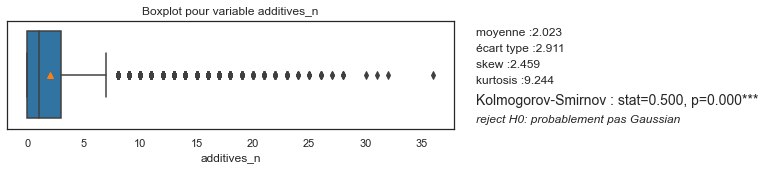

In [66]:
def plot_box(df:pd.DataFrame, col, showstats=False):
    plt.figure(figsize=(8, 2))
    ax = sns.boxplot(data=df, x=col, showmeans=True, showfliers=True)
    plt.title(f'Boxplot pour variable {col}')
    if showstats:
        add_text(ax, x=1.05, y=0.85, s=f'moyenne :{df[col].mean():.3f}')
        add_text(ax, x=1.05, y=0.7, s=f'écart type :{df[col].std():.3f}')
        add_text(ax, x=1.05, y=0.55, s=f'skew :{df[col].skew():.3f}')
        add_text(ax, x=1.05, y=0.4, s=f'kurtosis :{df[col].kurtosis():.3f}')
        p, ch, choix = test_normality(df[col])
        add_text(ax, x=1.05, y=0.20, s=ch, fontsize=14)
        add_text(ax, x=1.05, y=0.05, s=choix, style='italic')


plot_box(cleaned_data, 'additives_n', showstats=True)
to_png()

### 3.2.3 Analyse d'outliers (valeurs atypiques)

In [67]:
def get_valeurs_atypiques(df:pd.DataFrame, col, nb=10, random_state=None):
    desc = df[col].describe()
    q1 = desc['25%']  # df[col].quantile(0.25)
    median = desc['50%']  # df[col].quantile(.50)
    q3 = desc['75%']  # df[col].quantile(.75)
    iqr = (q3 - q1)
    max_val = min(desc['max'], q3 + 1.5 * iqr)
    # print(desc)
    # print(f'Q1 (25%) : {q1}')
    # print(f'médiane : {median}')
    # print(f'Q3 (75%) : {q3}')
    print(f'outliers [{col}] vals > {max_val:.2f}')
    outliers = df[df[col] > max_val]
    nb = min(len(outliers), nb)
    if nb > 0:
        print(outliers.sample(nb, random_state=random_state)['product_name'].to_list())


cleaned_data.pipe(get_valeurs_atypiques, 'additives_n', nb=10, random_state=1)

outliers [additives_n] vals > 7.50
['Beef, beans, & cheese sauce with red chiles burrito', 'Lightly glazed pie', 'Pumpkin cake roll', 'Pillsbury Original Crescent Rounds 8 Count', 'Butter cream, truffle, strawberry cream, vanilla cream assorted creams in milk & dark chocolate, assorted creams', 'Creme Egg Ice Cream', 'Rl Albert & Sons, Christmas Gumballs', 'Tulips Strawberry Iced Cookies', 'Assorted wrapped candies parade mix', 'Bitterman Family Confections, Gummi Flower Mix']


#### Outliers - Nutriscore A avec beaucoup d'additifs
- un sandwich de poulet peut avoir > 10 additifs

In [68]:
(cleaned_data[cleaned_data['additives_n'] > 10]
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_tag, 'nutriscore_grade', 'a')
 )

,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
6479,3308650721700,agamitsudo,2016-03-08 18:35:14,2021-02-22 23:52:17,Queue de Crevette Torpedo Panée,brake,"Frozen foods,Meals,Breaded products,Frozen ready-made meals,fr:crevettes-panees",Products for professional use,France,"Panure 55% [ chapelure japonaise 37% (farine de blé, huile de palme, sucre, levure, sel, agent d...",14,"en:e1100,en:e170,en:e300,en:e412,en:e415,en:e451,en:e452,en:e471,en:e500,en:e516,en:e551,en:e621...","E1100 - Alpha-Amylase,E170 - Calcium carbonates,E300 - Ascorbic acid,E412 - Guar gum,E415 - Xant...",1,huile-de-palme,1,e471-mono-et-diglycerides-d-acides-gras-alimentaires,-1.0,a,4,Composite foods,One-dish meals,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date completed,Packag...",fr:crevettes-panees,862.0,10.4,1.8,9.7,0.0,0.3,18.2,0.1168,0.0
39625,3560070773978,tacite,2015-06-27 15:14:57,2021-10-23 19:26:11,Poulet Curry Pain Polaire,"bon-app,carrefour","Sandwiches,Poultry sandwiches,Chicken sandwiches,fr:Sandwichs polaires,Raw-vegetable-sandwiches",Made in France,France,"Pain spécial polaire 46,7% (farine de _blé_, eau, sucre, farine de _seigle_, levure, sel, huile ...",11,"en:e14xx,en:e202,en:e224,en:e300,en:e330,en:e407,en:e412,en:e415,en:e451,en:e471,en:e503,en:e503ii","E14XX - Modified Starch,E202 - Potassium sorbate,E224 - Potassium metabisulphite,E300 - Ascorbic...",0,NaN,1,e471-mono-et-diglycerides-d-acides-gras-alimentaires,-1.0,a,4,Composite foods,Sandwiches,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date completed,Packag...",Raw-vegetable-sandwiches,854.0,5.3,0.7,28.0,3.9,2.3,10.0,0.3920,13.9


#### Outliers - valeurs nutritionnelles
- Quelle sont les produits avec valeurs atypiques dans chaque colonne nutritionnelle ?

In [69]:

print(list(colonnes_100g))
for col in colonnes_100g:
    print(f'------------------------------------')
    cleaned_data.pipe(get_valeurs_atypiques, col, nb=5, random_state=1)

['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']
------------------------------------
outliers [fat_100g] vals > 51.45
['Aceite de oliva virgen extra', 'KETO trail mix', 'Edelbitter-Schokolade', 'Beurre de Bretagne Doux', 'Olej rzepakowy']
------------------------------------
outliers [saturated-fat_100g] vals > 17.10
['Le gruyère Switzerland, Fruité', 'Creme entière', 'Genuine Pecorino Romano Superior Quality Cheese', 'Finely shredded mild cheddar cheese, mild cheddar', 'Chocolate Negro']
------------------------------------
outliers [carbohydrates_100g] vals > 100.00
------------------------------------
outliers [sugars_100g] vals > 46.80
['Choco Treasure, Chocolate + Toy Surprise', 'Bonbons Bouquet Violette Bio 120G', 'Krokant Nougat in Edel-Vollmilch', 'Hasselpähkinä-kaakaolevite', 'Toxic waste']
------------------------------------
outliers [fiber_100g] val

### 3.2.4 Distributions univariées avec tests de normalité

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.725, p=0.000*** : reject H0: probablement pas Gaussian
"distribution_nutriscore_stats.png"


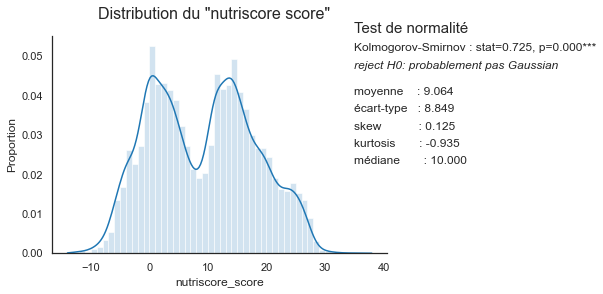

In [70]:
def plot_histogram(df:pd.DataFrame, col, color=None, ax=None, showstats=False, binwidth=None):
    print(f'Plot Histogram for column {col}')
    series: pd.Series = df[col].astype(float).dropna()
    if ax is None:
        plt.figure()
        ax = plt.gca()
    ax = sns.histplot(series, ax=ax, color=color, kde=True, binwidth=binwidth,
                      alpha=0.2, stat='proportion', legend=True)
    ax.set_xlabel(series.name)
    if showstats:
        p, ch, choix = test_normality(series)
        add_text(ax, 0.9, 1, 'Test de normalité', fontsize=15)
        add_text(ax, 0.9, 0.92, ch)
        add_text(ax, 0.9, 0.84, choix, style='italic')
        add_text(ax, 0.9, 0.72, f'moyenne    : {series.mean():.3f}')
        add_text(ax, 0.9, 0.64, f'écart-type   : {series.std():.3f}')
        add_text(ax, 0.9, 0.56, f'skew           : {series.skew():.3f}')
        add_text(ax, 0.9, 0.48, f'kurtosis       : {series.kurtosis():.3f}')
        add_text(ax, 0.9, 0.40, f'médiane       : {series.median():.3f}')
    sns.despine()


cleaned_data.pipe(plot_histogram, 'nutriscore_score', showstats=True, binwidth=1)
plt.suptitle('Distribution du "nutriscore score"', size=16)
to_png('distribution_nutriscore_stats')

#### 3.2.4.1 Histograms pour toutes les colonnes numériques
- change à `plot_all=True` pour générer les diagrammes pour toutes les colonnes numériques

In [71]:
colonnes_numeriques = list(cleaned_data.select_dtypes('number').columns)
print(colonnes_numeriques)

plot_all = False
if plot_all:
    for col in colonnes_numeriques:
        plot_histogram(cleaned_data, col)
        to_png(f'distribution_{col}_stats')
        plt.show()

['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'nutriscore_score', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


### 3.2.5 Effectif et fréquence
- effectif : df[col].value_counts(normalize=False)
- fréquence : df[col].value_counts(normalize=True)


In [72]:
def count_freq(df:pd.DataFrame, col):
    """Calculer l'effectif ET la fréquence en même temps"""
    s = df[col]
    effectif = s.value_counts()
    total = effectif.sum()
    # frequence = s.value_counts(normalize=True)
    frequence = effectif.div(total)
    percent100 = frequence.mul(100).round(1).astype(str) + '%'
    return (pd.DataFrame({'effectif': effectif, 'freq': frequence, 'per100': percent100})
            .rename_axis(col)
            .reset_index())


(cleaned_data
 .pipe(filtre_par_top_freq, col='creator', nb=10)
 .to_frame(name='creator')
 .pipe(count_freq, col='creator')
 )


,creator,effectif,freq,per100
0,kiliweb,56398,0.56398,56.4%
1,other,12697,0.12697,12.7%
2,usda-ndb-import,9964,0.09964,10.0%
3,openfoodfacts-contributors,8335,0.08335,8.3%
4,org-database-usda,5920,0.05920,5.9%
...,...,...,...,...
6,date-limite-app,1586,0.01586,1.6%
7,elcoco,1348,0.01348,1.3%
8,inf,868,0.00868,0.9%
9,openfood-ch-import,695,0.00695,0.7%


In [73]:


cleaned_data.pipe(top_n_freq, col='creator', nb=10)


,creator,freq
0,kiliweb,56398.0
1,usda-ndb-import,9964.0
2,openfoodfacts-contributors,8335.0
3,org-database-usda,5920.0
4,foodvisor,1647.0
...,...,...
6,elcoco,1348.0
7,inf,868.0
8,openfood-ch-import,695.0
9,tacite,542.0


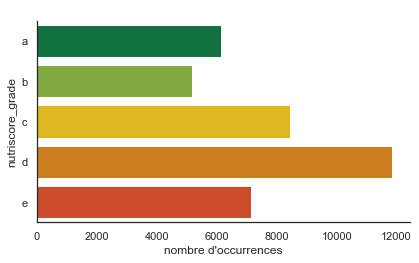

In [74]:
plot_bar_top_n(cleaned_data, 'nutriscore_grade', others=False,
               sort_values=True, palette=nutriscore_palette)


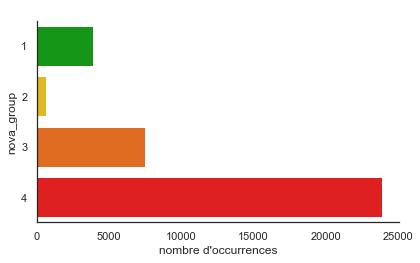

In [75]:
plot_bar_top_n(cleaned_data, 'nova_group', others=False,
               sort_values=True, palette=nova_palette)


## 3.3 Contributions sur le temps

- Nombre de registres créés / modifiés dans le temps
- Par contributeur dans le temps


### 3.3.1 Nombre de registres créés / modifiés dans le temps


In [76]:
date_cols=cleaned_data[['created_datetime', 'last_modified_datetime', 'creator', 'countries_en']].copy()
date_cols.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   created_datetime        100000 non-null  datetime64[ns]
 1   last_modified_datetime  100000 non-null  datetime64[ns]
 2   creator                 100000 non-null  object        
 3   countries_en            99780 non-null   object        
dtypes: datetime64[ns](2), object(2)
memory usage: 3.1+ MB


Crée une colonne pour indiquer le nombre de jours entre création et la dernière modification

In [77]:

def create_column_days_diff(df:pd.DataFrame):
    df = df.copy()
    # convert time delta (discrete, in ns) to continuous (float)
    df['days_diff'] = (
            (df['last_modified_datetime'] - df['created_datetime'])
            / np.timedelta64(1, 'D')
    )
    return df

date_cols = date_cols.pipe(create_column_days_diff)

# get maximum date difference
date_cols.sort_values(by='days_diff', ascending=False).head()


,created_datetime,last_modified_datetime,creator,countries_en,days_diff
57961,2012-03-21 21:45:24,2021-11-12 05:38:38,stephane,"Belgium,France,Martinique",3522.328634
15623,2012-05-13 20:04:22,2021-11-21 19:33:53,stephane,"Belgium,France,Luxembourg,Morocco,Netherlands,Switzerland",3478.978831
85803,2012-05-16 18:03:59,2021-11-21 06:10:03,rivdepar,"France,Italy,Spain",3475.504213
6814,2012-05-16 13:55:59,2021-11-19 05:30:56,adrien,France,3473.649271
45992,2012-05-22 20:45:59,2021-11-21 06:02:03,malikele,France,3469.386157


In [78]:
date_cols.describe(datetime_is_numeric=True).style.format(precision=2)

,created_datetime,last_modified_datetime,days_diff
count,100000,100000,100000.00
mean,2019-05-04 18:13:05.636789760,2020-08-06 19:25:47.229669888,460.05
min,2012-03-18 20:34:42,2012-10-27 08:28:05,0.00
25%,2018-02-10 19:49:14.249999872,2020-03-09 16:21:45.249999872,0.00
50%,2019-08-28 09:53:41,2020-09-27 20:43:28,192.01
75%,2020-10-18 12:41:31,2021-05-20 17:41:00.750000128,840.01
max,2021-11-23 01:21:42,2021-11-23 01:21:44,3522.33
std,nan,nan,574.87


➡️ 75% des données ont été crée depuis 2018


➡️ Au moins 25% des données n'ont jamais était modifiés

"date_diff_displot.png"


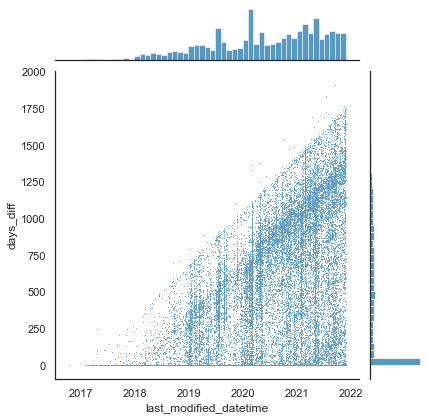

In [79]:
def plot_dist_date_diff(df:pd.DataFrame):
    # sns.displot(df,x='days_diff')
    sns.jointplot(data=df[['last_modified_datetime', 'days_diff']].dropna(
    ), x='last_modified_datetime', y='days_diff', s=1)


(date_cols
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'creator', 'kiliweb')
 .pipe(plot_dist_date_diff)
 )
to_png('date_diff_displot')

IntervalIndex([(-0.1, 5e-05], (5e-05, 192.0], (192.0, 840.0], (840.0, 3522.3]], dtype='interval[float64, right]')
"date_created_hue_day_diff_displot.png"


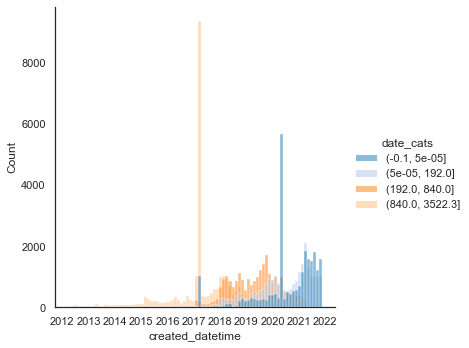

In [80]:
date_cols['date_cats'] = pd.qcut(
    date_cols['days_diff'], 4, precision=0, duplicates='drop')
print(date_cols['date_cats'].cat.categories)

sns.displot(data=date_cols, x='created_datetime', hue='date_cats')
to_png('date_created_hue_day_diff_displot')


### 3.3.2 Principaux contributeurs par année

"contributeurs_over_time_displot_creator.png"


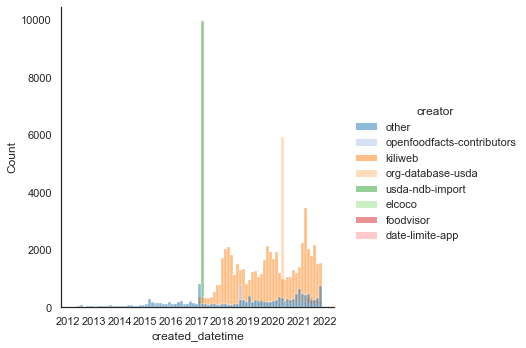

In [81]:
def contrib_over_time(df:pd.DataFrame, nb=7):
    top_contrib = pd.concat([
        df.pipe(filtre_par_top_freq, 'creator', nb=nb),
        df['created_datetime']
    ], axis=1)
    sns.displot(data=top_contrib, x='created_datetime', hue='creator')
    return top_contrib


contributeurs_over_time = date_cols.pipe(contrib_over_time, 7)
to_png('contributeurs_over_time_displot_creator')


On regarde chaque contributeur séparément :

"contributeurs_over_time_facetgrid_creator.png"


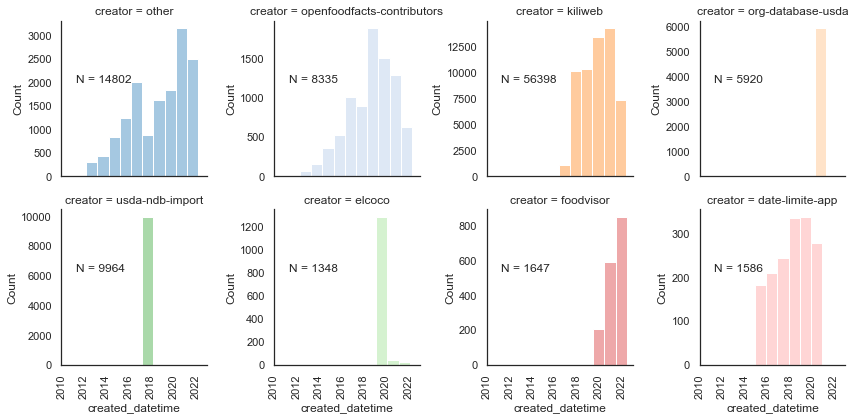

In [82]:
def plot_over_time(df:pd.DataFrame, col):
    def annotate(data, **kws):
        n = len(data)
        ax = plt.gca()
        ax.text(.1, .6, f"N = {n}", transform=ax.transAxes)

    g = sns.FacetGrid(df, hue=col, col=col, col_wrap=4,
                      sharex=True, sharey=False)
    # binwidth = 1 an 
    g.map(sns.histplot, "created_datetime", binwidth=365, alpha=.4)
    g.set_xticklabels(rotation=90)
    g.map_dataframe(annotate)


contributeurs_over_time.pipe(plot_over_time, 'creator')
to_png('contributeurs_over_time_facetgrid_creator')


"contributeurs_over_time_facet_grid.png"


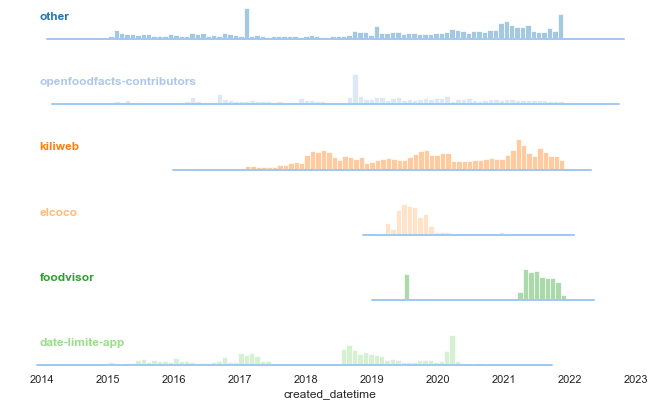

In [84]:
from dateutil import parser


def plot_contributeurs_facet(df:pd.DataFrame):
    datefrom = parser.parse('01/01/2015', ignoretz=True)
    filtre1 = df['created_datetime'] > datefrom
    filtre = df['creator'].str.contains('usda|import', regex=True)
    g = sns.FacetGrid(df[filtre1 & ~filtre], row="creator", hue='creator',
                      aspect=10, height=1, sharey=False)
    # Draw the densities in a few steps
    g.map(sns.histplot, "created_datetime", alpha=.4, binwidth=30, clip_on=False)
    g.map(sns.kdeplot, "created_datetime", clip_on=False, color="b", lw=2)

    # Define and use a simple function to label the plot in axes coordinates
    def annotate(x, color, label):
        ax = plt.gca()
        ax.text(0.05, .7, label, fontweight="bold", color=color,
                ha="left", va="center", transform=ax.transAxes)

    g.map(annotate, 'created_datetime')

    # Supprime détail
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)
    plt.gcf().title = 'Distribution des contributions sur le temps'


contributeurs_over_time.pipe(plot_contributeurs_facet)
to_png('contributeurs_over_time_facet_grid')

Supprime datasets temporaraires

In [85]:
del contributeurs_over_time
del date_cols


### 3.3.3 Fréquence par année (groupé par nutrigrade, groupe NOVA, nombre d'additifs)


In [86]:
def count_freq_by_year(df:pd.DataFrame, groupby_var, date_col='last_modified_datetime'):
    count_by_year = (
        df[[groupby_var, date_col]]
            .groupby(by=[groupby_var, df[date_col].dt.year]).count()
    )
    freq_by_year = (count_by_year
                    .groupby(level=1)
                    .apply(lambda x: 100 * x / float(x.sum()))
                    # .rename(columns={date_col:groupby_var})
                    )

    return freq_by_year.unstack(level=0).droplevel(0, axis=1)


cleaned_data.pipe(count_freq_by_year, groupby_var='nutriscore_grade').style.format(precision=2)

nutriscore_grade,a,b,c,d,e
last_modified_datetime,,,,,
2012,nan,nan,nan,nan,100.00
2013,33.33,nan,33.33,33.33,nan
2014,21.05,15.79,26.32,21.05,15.79
2015,18.88,14.69,13.99,27.27,25.17
2016,17.09,13.92,17.09,32.28,19.62
2017,13.57,15.63,17.70,32.45,20.65
2018,11.44,12.94,20.77,30.81,24.03
2019,14.27,14.24,22.37,30.77,18.35
2020,16.31,12.32,20.85,31.27,19.26


In [87]:
def pivot_freq(df:pd.DataFrame, col='nova_group', groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    if col == groupby_var:
        piv_index = [df[date_col].dt.year]
    else:
        piv_index = [groupby_var, df[date_col].dt.year]
    addx: pd.DataFrame = (pd.pivot_table(df,
                                         columns=[col],
                                         index=piv_index,
                                         aggfunc={
                                             col: ['count', 'mean']
                                         },
                                         )
                          #  fill_value=None, margins=False, dropna=False, margins_name='All', observed=False, sort=True)
                          )

    # addx[(col,'freq')]=addx[(col,'count')].astype(float)/addx[(col,'len')].astype(float)
    return addx


cleaned_data.pipe(pivot_freq)

nova_group                       \
                                             count                        
nova_group                                       1     2      3       4   
nutriscore_grade last_modified_datetime                                   
a                2013                          1.0   NaN    NaN     NaN   
                 2014                          1.0   NaN    NaN     3.0   
                 2015                         10.0   NaN    5.0     9.0   
                 2016                         12.0   NaN    6.0     8.0   
                 2017                         10.0   NaN   15.0    15.0   
...                                            ...   ...    ...     ...   
e                2017                          1.0   3.0    8.0    47.0   
                 2018                          5.0   3.0   40.0   139.0   
                 2019                         11.0   4.0   73.0   248.0   
                 2020                         53.0  24.0  410.0  2506.0   
                 2021                         27.0  34.0  239.0  1130.0   

                                                                     \
                                                 mean                 
nova_group                                          1             2   
nutriscore_grade last_modified_datetime                               
a                2013                    1.000000e+00           NaN   
                 2014                    1.000000e+00           NaN   
                 2015                    1.111111e+08           NaN   
                 2016                    9.259259e+09           NaN   
                 2017                    1.111111e+08           NaN   
...                                               ...           ...   
e                2017                    1.000000e+00  7.400000e+01   
                 2018                    2.222200e+03  7.400000e+01   
                 2019                    1.010101e+09  5.555000e+02   
                 2020                    2.096436e+50  9.259259e+21   
                 2021                    4.115226e+24  6.535948e+31   

                                                                       
                                                                       
nova_group                                           3              4  
nutriscore_grade last_modified_datetime                                
a                2013                              NaN            NaN  
                 2014                              NaN   1.480000e+02  
                 2015                     6.666600e+03   4.938272e+07  
                 2016                     5.555550e+04   5.555556e+06  
                 2017                     2.222222e+13   2.962963e+13  
...                                                ...            ...  
e                2017                     4.166667e+06   9.456265e+44  
                 2018                     8.333333e+37  3.197442e+136  
                 2019                     4.566210e+70  1.792115e+245  
                 2020                              inf            inf  
                 2021                    1.394700e+236            inf  

[44 rows x 8 columns]

### 3.3.4 Top pays (nombre de produits)


"Produits_par_pays.png"


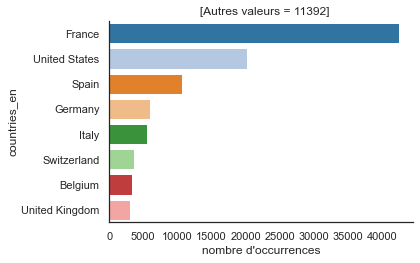

In [88]:
def plot_produits_par_pays(df:pd.DataFrame):
    plot_bar_top_n(df, 'countries_en', nb=8)


cleaned_data.pipe(plot_produits_par_pays)
to_png('Produits_par_pays')


## 3.4 Distribution des données (manquantes)

Cette section analyse:
 - les colonnes avec des données manquantes
 - les principaux contributeurs des données pour chaque colonne 


**Note :** Les données nettoyées ont toujours des données manquantes après :
  - suppression de produits sans nom
  - suppression de produits non alimentaires
  - suppression de doublons
  - imputation des valeurs nutritionnelles / nutriscore
  - suppression des lignes sans ingredients

Voir P3_nettoyage.ipynb section 4.5 pour plus de détails

### 3.4.1 Matrix de missingno 

"Valeurs_manquantes_(données_nettoyés).png"


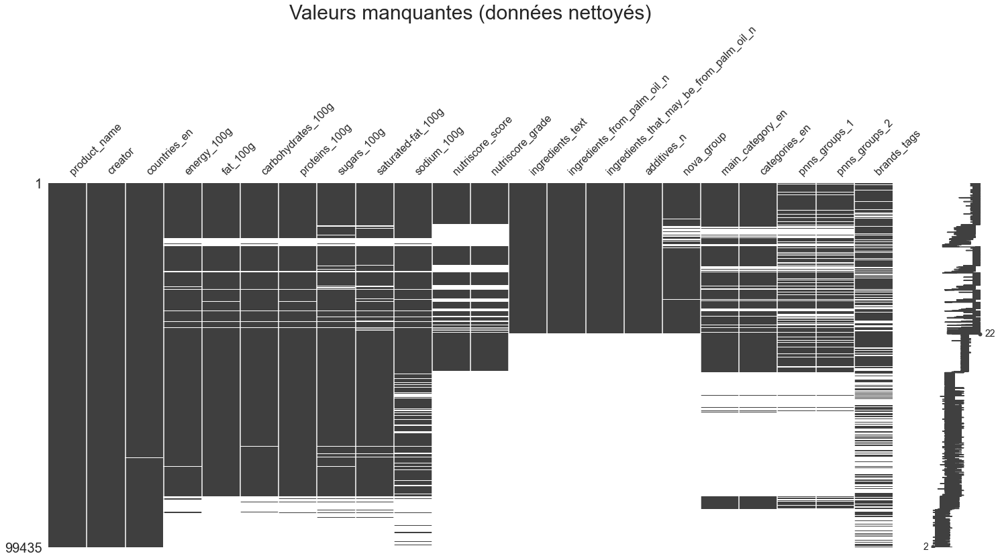

In [89]:
import missingno as msno


def sort_by_priority(df: pd.DataFrame):
    return (df.dropna(subset=['product_name'])
            .sort_values(by=['additives_n', 'nutriscore_score', 'fat_100g', 'main_category_en'])
            )


analyse_cols = ['product_name',
                'creator', 'countries_en',
                # colonnes nutritionnelles
                'energy_100g', 'fat_100g', 'carbohydrates_100g', 'proteins_100g', 'sugars_100g', 'saturated-fat_100g',
                'sodium_100g',
                'nutriscore_score', 'nutriscore_grade',
                'ingredients_text', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                'additives_n',
                'nova_group',
                'main_category_en', 'categories_en',
                'pnns_groups_1', 'pnns_groups_2',
                'brands_tags'
                ]

msno.matrix(cleaned_data[analyse_cols].pipe(sort_by_priority))
plt.title('Valeurs manquantes (données nettoyés)', size=30)
to_png()

"Valeurs_manquantes_-_(creator_=_usda-ndb-import).png"


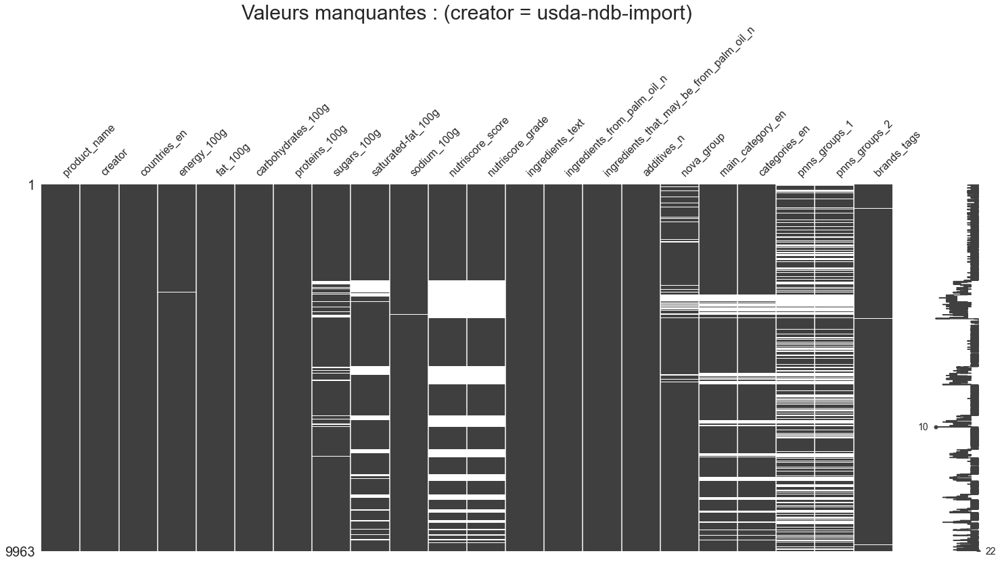

In [90]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'creator', 'usda-ndb-import')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes : (creator = usda-ndb-import)', size=30)
to_png()

"Valeurs_manquantes_-_France.png"


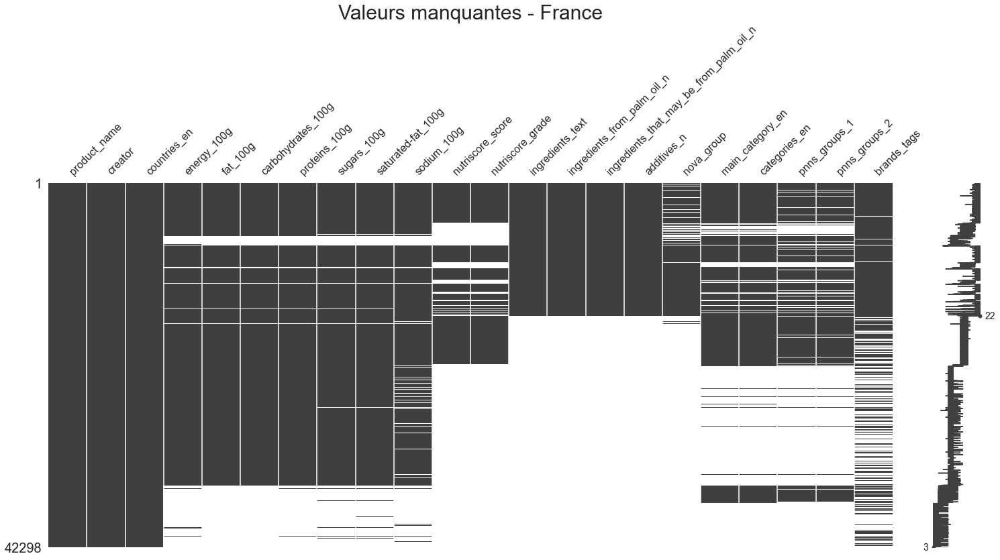

In [91]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'france')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - France', size=30)
to_png()

"Valeurs_manquantes_-_Etats_Unis.png"


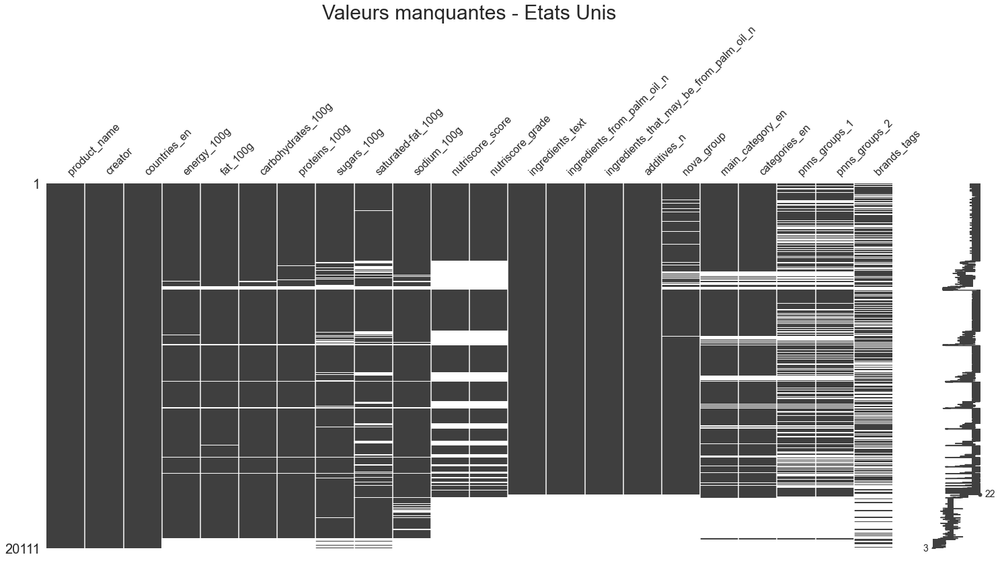

In [92]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'united states')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - Etats Unis', size=30)
to_png()

### 3.4.2 Top contributeurs - pie charts

In [93]:
def plot_top_contributeurs(df:pd.DataFrame, nb=7, for_column='creator', palette=None):
    
    column_exists = (for_column in df.columns)
    print(f'plot_top_contributeurs for {for_column} (column_exists={column_exists})')
    top_contributeurs = df.dropna(subset=[for_column]).pipe(
        top_n_freq, col='creator', nb=nb, others=True)
    nb = min(nb + 1, len(top_contributeurs))  # nb + 'others'
    top_contributeurs = top_contributeurs.head(nb)
    contributeurs = top_contributeurs['creator'].tolist()
    colors = sns.color_palette("tab20").as_hex()

    # reutilise la palette du dernier pie pour pouvoir comparer les pies,
    # sans changer la couleur de chaque contributeur
    if palette is None:
        palette = dict(zip(contributeurs, colors[:nb]))
    for creator in contributeurs:
        keys = list(palette.keys())
        if not (creator in keys):
            n = len(keys) % 20
            palette[creator] = colors[n]

    colors = [palette[col] for col in contributeurs]
    labels = (top_contributeurs['creator']
        # pass normalize=True to top_n_freq to display freq as frequency
        # +  ' (' + (round(top_contributeurs['freq']*1000)/10).astype(str)+'%)'
        )
    wedges, texts, autotexts = plt.pie(
        data=top_contributeurs, x='freq', colors=colors, autopct="%.1f%%", explode=[0.05] * nb, pctdistance=1.2)
    plt.suptitle(
        f'Principaux contributeurs (colonne "{for_column}")', fontsize=16)
    plt.legend(wedges, labels, title=f'contributeur',
               bbox_to_anchor=(1.0, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.1, right=0.4)

    return palette


# reinitialise la palette à utiliser
contributeur_palette = None


#### 3.4.2.1 Contributeurs - nombre de produits créés
- Tous pays
- France
- Etats Unis

plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_all_created.png"


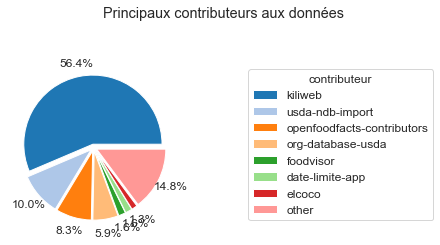

In [94]:
contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, nb=7, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données")
to_png('principaux_contributeurs_pie_all_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_france_created.png"


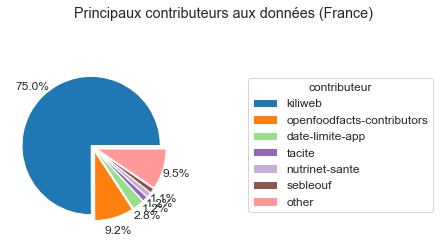

In [95]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (France)")
to_png('principaux_contributeurs_pie_france_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_usa_created.png"


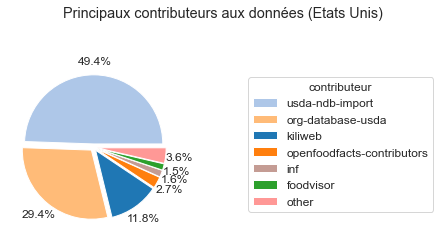

In [96]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (Etats Unis)")
to_png('principaux_contributeurs_pie_usa_created')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_all_additives.png"


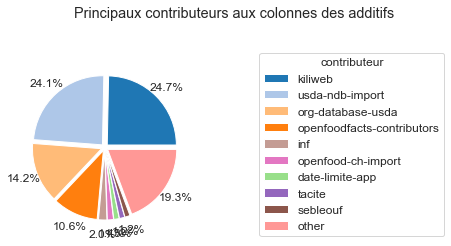

In [97]:

contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=9, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs')
to_png('principaux_contributeurs_pie_all_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_france_additives.png"


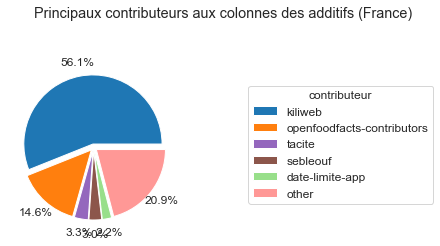

In [98]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (France)')
to_png('principaux_contributeurs_pie_france_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_usa_additives.png"


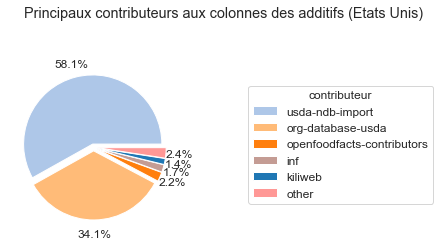

In [99]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Etats Unis)')
to_png('principaux_contributeurs_pie_usa_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_spain_additives.png"


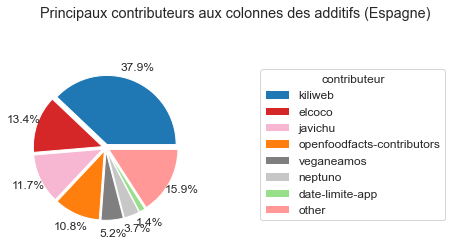

In [100]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Spain')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Espagne)')
to_png('principaux_contributeurs_pie_spain_additives')

plot_top_contributeurs for brands_tags (column_exists=True)
"principaux_contributeurs_pie_brands.png"


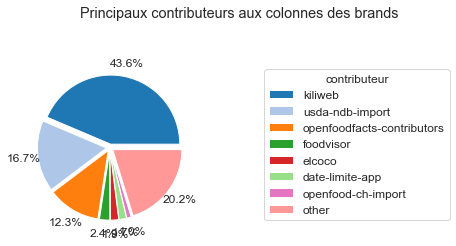

In [101]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='brands_tags', nb=7, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux colonnes des brands')
to_png('principaux_contributeurs_pie_brands')


plot_top_contributeurs for energy_100g (column_exists=True)
"principaux_contributeurs_pie_nutrition_values.png"


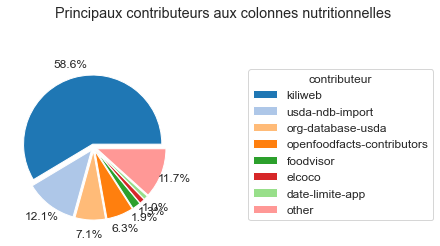

In [102]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='energy_100g', nb=7, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux colonnes nutritionnelles')
to_png('principaux_contributeurs_pie_nutrition_values')


plot_top_contributeurs for labels_en (column_exists=True)
"principaux_contributeurs_pie_labels_en.png"


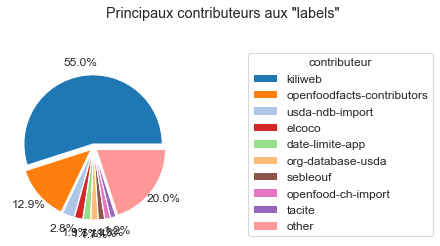

In [103]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='labels_en', nb=9, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux "labels"')
to_png('principaux_contributeurs_pie_labels_en')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_germany_additives.png"


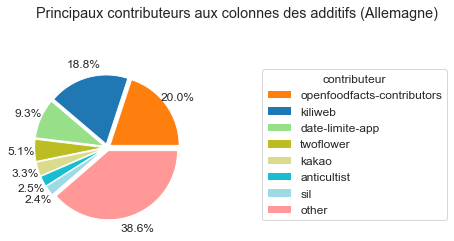

In [104]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Germany')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Allemagne)')
to_png('principaux_contributeurs_pie_germany_additives')

### 3.4.3 Conclusion
   - Les données manquantes varient par pays
   - La plupart des données en Europe vient des apps de chaque pays
   - Yuka App (Kiliweb) fourni 75% des données de France, mais seulement 24% des données des additifs
   - Si on analyse que les données de France, on perd presque 70% des informations sur les additifs


## 3.5 Intersections des données

### 3.5.1 Visualise intersection de tags (venn diagram)

Objectif: voir s'il y a des correlations entre les tags :
- produits commun à plusieurs pays
- additifs qui se trouvent ensembles
- corrélations entre labels (exemple 'bio' et 'organic') 
- les top catégories trouvés ensembles

Il est très compliqué de faire des corrélations entre des tags :

- il faut 'exploser' la colonne
- filtre sur les top 100 tags
- faire un crosstab sur les top tags
- faire des correlations sur ce crosstab

La plupart des colonnes de tags contient plus de 40000 tags
Avec 2 millions de registres, ça prend beaucoup de memoire et beaucoup de temps

Donc, on regarde simplement les top 3 tags

"E3_venn_plot_[countries_en]_france_united_states.png"


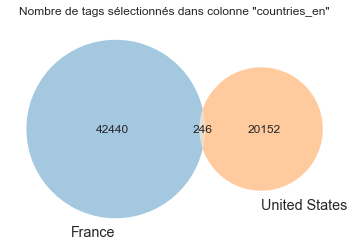

In [105]:
from matplotlib_venn import venn2


def plot_venn_tag_count(df:pd.DataFrame, tag_col, tag1=None, tag2=None, tag3=None):
    data = df[[tag_col]].dropna()
    if tag1 is None:
        [tag1, tag2, tag3] = (explode_series(data[tag_col])
                              .value_counts()
                              .index[:3].to_list())
        titre = f'Nombre de top 3 tags dans colonne "{tag_col}"'
    else:
        titre = f'Nombre de tags sélectionnés dans colonne "{tag_col}"'
    has_tag1 = data[tag_col].str.contains(tag1)
    has_tag2 = data[tag_col].str.contains(tag2)
    c100 = sum(has_tag1)
    c010 = sum(has_tag2)
    c110 = sum(has_tag1 & has_tag2)
    if tag3 is None:

        venn2(subsets={'10': c100, '01': c010, '11': c110},
              set_labels=(tag1, tag2),
              set_colors=sns.color_palette("tab10").as_hex()[:2])
    else:
        has_tag3 = data[tag_col].str.contains(tag3)
        c001 = sum(has_tag3)
        c101 = sum(has_tag1 & has_tag3)
        c011 = sum(has_tag2 & has_tag3)
        c111 = sum(has_tag1 & has_tag2 & has_tag3)
        from matplotlib_venn import venn3
        venn3(subsets={'100': c100, '010': c010, '001': c001,
                       '110': c110, '011': c011, '101': c101, '111': c111},
              set_labels=(tag1, tag2, tag3),
              set_colors=sns.color_palette("tab10").as_hex()[:3])
    plt.title(label=titre)
    tag1_safe = tag1.lower().replace(':', '-')
    tag2_safe = tag2.lower().replace(':', '-')

    if tag3 is None:
        to_png(f'E3_venn_plot_[{tag_col}]_{tag1_safe}_{tag2_safe}')
    else:
        tag3_safe = tag3.lower().replace(':', '-')
        to_png(f'E3_venn_plot_[{tag_col}]_{tag1_safe}_{tag2_safe}_{tag3_safe}')


cleaned_data.pipe(plot_venn_tag_count, 'countries_en',
                  'France', 'United States')
plt.show()

"E3_venn_plot_[countries_en]_france_united_states_spain.png"


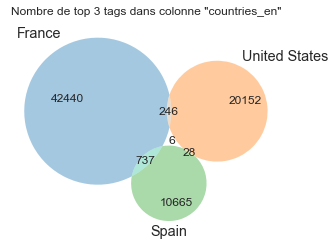

In [106]:
cleaned_data.pipe(plot_venn_tag_count, 'countries_en')
plt.show()


"E3_venn_plot_[main_category_en]_snacks_biscuits_sauces.png"


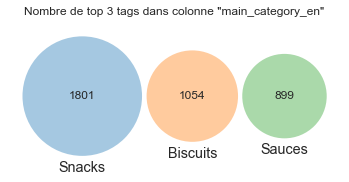

In [107]:
cleaned_data.pipe(plot_venn_tag_count, 'main_category_en')

"E3_venn_plot_[additives_en]_e330_-_citric_acid_e322_-_lecithins_e322i_-_lecithin.png"


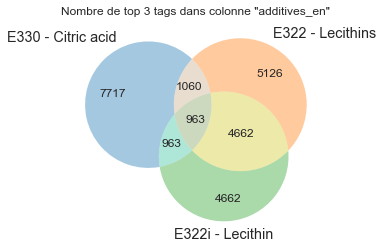

In [108]:
cleaned_data.pipe(plot_venn_tag_count, 'additives_en')

"E3_venn_plot_[labels_en]_organic_eu_organic_vegetarian.png"


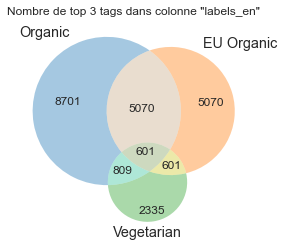

In [109]:
cleaned_data.pipe(plot_venn_tag_count, 'labels_en')

### 3.5.2 Conclusion

- ➡️ Les données de chaque pays ont très peu d'intersection avec d'autres pays
- ➡️ 
- ➡️ Pour utiliser les données de plusieurs pays, il faut être sûr que les données vient de la même population (moyennes et variance)

## 3.6 Effet de suppression des données manquantes sur les distributions

- On ne peut pas imputer les données manquantes, car ça modifie les distributions de nutriscore et valeurs nutritionnelles



### 3.6.1 Si on supprime les données manquants, quel est l'effet sur les distributions?

On peut si les produits sans information sur les additifs, le groupe NOVA ou le Nutriscore

Notre objectif est de 
- remplacer le NOVA score `[nova_group]` et le nombre d'additifs `[additives_n]` par l'ADDISCORE

Il faut comparer les colonnes `nutriscore_score`, `nova_group` et `additives_n`

Avant de supprimer les produits avec données manquantes dans ces colonnes, il faut verifier que les produits qui restent sont répresentatif de la population.


### 3.6.2 Hypothese : Est-ce que les données avec additifs sont répresentatives de la population ?

- H0 - les données avec additifs ont la même nutriscore distribution que les données sans information
- H1 - les données avec additifs ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.717, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_additif_info).png"


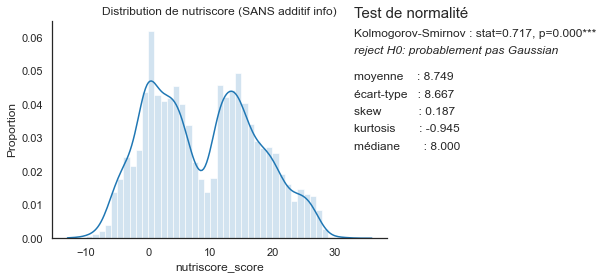

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.728, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_additif_info).png"


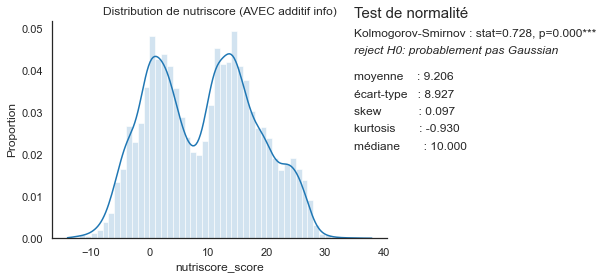

(n=38750), [12065, 26685]
Kruskal-Wallis H-test : stat=19.134, p=0.000***
les médianes sont significativement différentes (reject H0)


In [110]:
def test_nutriscore_avec_sans_additif_info(df: pd.DataFrame):
    filtre = df['additives_n'].isnull() | df['nova_group'].isnull() | df['nutriscore_score'].isnull()
    sans_additif_info = df[filtre][['nutriscore_score']].dropna()
    avec_additif_info = df[~filtre][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS additif info)')
    to_png()
    plt.show()
    plot_histogram(avec_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC additif info)')
    to_png()
    plt.show()

    groups = [
        sans_additif_info['nutriscore_score'].rename('SANS additif info'),
        avec_additif_info['nutriscore_score'].rename('AVEC additif info'),
    ]
    test_kruskal(groups, showsize=True)
    # stat,p=mannwhitneyu(x=groups[1],y=groups[2])


cleaned_data.pipe(test_nutriscore_avec_sans_additif_info)



#### 3.6.2.1 ➡️ Données sans additifs très similaires aux données avec additifs
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans info additifs est légèrement plus haut (9.4 versus 8.9)
- données sans info d'additifs sont un peu moins gras, sucré ou salé
- peut-être sont les fromages, viandes, gateaux artisanaux ?

On conclut qu'on peut supprimer les données sans additifs, et que la relation entre additifs et nutriscore applique à tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la proportion de NOVA 4 est la même
- tester si la distribution entre PNNS groupes est la même

#### 3.6.2.2 Supprime les données sans information sur les additifs de la base de données
- L'analyse des données manquantes et analyse d'intersections des données est terminé
- on peut supprimer les données sans informations sur les additifs

In [111]:
print(f'Données nettoyés : {cleaned_data.shape}')
cleaned_data = cleaned_data.dropna(
    subset=['additives_n']
)
print(f'Données nettoyés pour analyse des additifs : {cleaned_data.shape}')

Données nettoyés : (100000, 33)
Données nettoyés pour analyse des additifs : (41330, 33)


### 3.6.3 Les données sans/avec NOVA groupe sont-ils representatives de la population ?

- H0 - les données avec NOVA groupe ont la même nutriscore distribution que les données sans information
- H1 - les données avec NOVA groupe ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.528, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_NOVA_group).png"


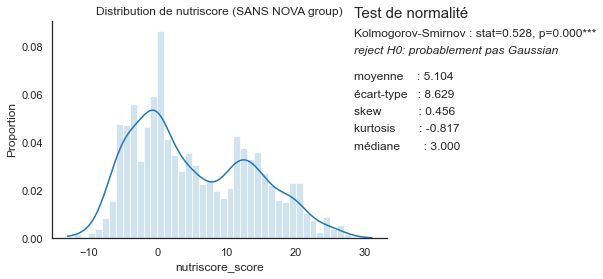

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.728, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_NOVA_group).png"


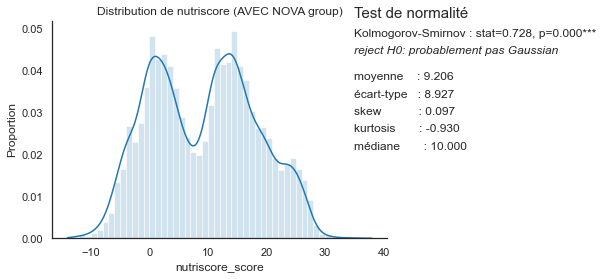

(n=28492), [1807, 26685]
Kruskal-Wallis H-test : stat=358.814, p=0.000***
les médianes sont significativement différentes (reject H0)


In [112]:
def test_nutriscore_avec_sans_nova_group(df: pd.DataFrame):
    sans_nova_group = df[df['nova_group'].isnull()][['nutriscore_score']].dropna()
    avec_nova_group = df[df['nova_group'].notnull()][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS NOVA group)')
    to_png()
    plt.show()
    plot_histogram(avec_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC NOVA group)')
    to_png()
    plt.show()

    groups = [
        sans_nova_group['nutriscore_score'].rename('SANS nova_group'),
        avec_nova_group['nutriscore_score'].rename('AVEC nova_group'),
    ]
    test_kruskal(groups, showsize=True)


cleaned_data.pipe(test_nutriscore_avec_sans_nova_group)



#### 3.7.2.1 ➡️ Données sans nova groupe très similaires aux données avec nova_group
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans nova_group est légèrement plus bas (8.8 versus 9.2)
- données sans nova_group sont un peu moins gras, sucré ou salé
- à faire : identifier pourquoi

On conclut qu'on peut supprimer les données sans nova_group, car ils changent très peu la nutriscore de tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la distribution entre PNNS groupes est la même

## 3.7 Conclusion
Basée sur la distibution des nutriscores:
- ➡️ Les données de tous les pays peuvent être intégrés
- ➡️ Les registres avec données manquantes (nombre d'additifs, nutriscore, ou groupe nova) dont supprimés au lieu d'être imputés pour preserver la distribution des nutriscores 

## 3.8 Supprimer au lieu d'imputer les valeurs manquantes 
- (additifs_n, nutriscore, groupe NOVA)

In [113]:
cleaned_data= cleaned_data.dropna(subset=['additives_n', 'nutriscore_score', 'nova_group'], how='any')

---

# 4. Analyses multivariées

## 4.1 Analyses sur le nombre d'additifs

#### 4.1.1 Nombre d'additifs par nutriscore (scatterplot)

"regression_additives_n_vs_nutriscore_score_hue_None_lmplot.png"


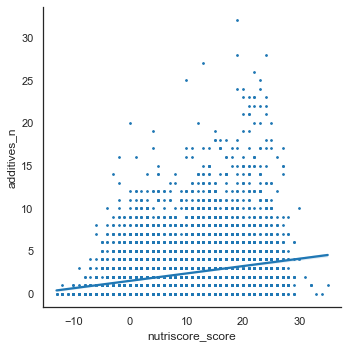

In [114]:
def plot_reg(df:pd.DataFrame, x_var='nutriscore_score', y_var='additives_n', hue='nova_group',
             nb=7, size=3, alpha=1):
    """
    Régression de 2 variables, x et y.
    Si hue est fourni, l'analyse bivariée est répetée pour chaque catégorie de hue
    """
    if hue is None:
        df2 = df[[x_var, y_var]].dropna(subset=[x_var, y_var])
    else:
        df2 = df[[x_var, y_var, hue]].dropna(subset=[x_var, y_var])
    df2[x_var] = df2[x_var].astype(np.float64)
    df2[y_var] = df2[y_var].astype(np.float64)
    if hue is None:
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       scatter_kws={'s': size, 'alpha': alpha})
        hue = 'None'
    else:
        hue_palette = get_palette_df(df, feature=hue, nb=nb)
        hue_order = list(hue_palette.keys())
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       hue=hue, hue_order=hue_order, palette=hue_palette,
                       #    x_jitter=0.2,y_jitter=0.2,
                       scatter_kws={'s': size, 'alpha': alpha})
        leg = g._legend
        # # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.1, 0.8])
        leg._loc = 6  # center left
        for lh in g._legend.legendHandles:
            lh.set_alpha(1)
            lh._sizes = [50]
            # plt.tight_layout()
    to_png(f'regression_{y_var}_vs_{x_var}_hue_{hue}_lmplot')

# sns.regplot(data=cleaned_data[['nutriscore_score', 'additives_n']].astype(np.float64),
#              x='nutriscore_score', y='additives_n',
#                        scatter_kws={'s': 3, 'alpha': 0.5})

cleaned_data.sample(10000).pipe(plot_reg, hue=None)


### 4.1.2 Box-plot groupé par catégorie (avec tests statistiques)
- version univariée est `plot_box(df,col)`

In [115]:
def plot_box_groupby(df:pd.DataFrame, y_var, groups_var, showfliers=True,
                     showstats=True, showtukey=False, showmeans=True):
    """P"""

    data = df[[groups_var, y_var]].dropna()
    data[y_var] = data[y_var].astype(float)
    palette = get_palette(groups_var)
    if palette is None:
        order = data[groups_var].value_counts().index.to_list()
    else:
        order = list(palette.keys())
        order.sort()
    ax = sns.boxplot(data=data, x=groups_var, y=y_var,
                     showmeans=True,
                     showfliers=showfliers,
                     palette=palette, order=order)
    ax.set_title(f'box plot de {y_var} by {groups_var}')
    sns.despine()
    if showstats:
        # Groupes
        groups = []
        categories = data[groups_var].dropna().unique()
        categories.sort()
        for categ in categories:
            groups.append(data[data[groups_var] == categ][y_var].rename(categ))

        # Normalité
        x = 1.1
        y = 1
        add_text(ax, x - 0.05, y, 'Tests de normalité des distributions', fontsize=15)
        normality = True
        y -= 0.08
        for grp in groups:
            p, ch, choix = test_normality(grp)
            if showmeans:
                add_text(ax, x, y, f'{grp.name} (mean:{grp.mean():.2f}, std:{grp.std():.2f}): {ch}')
            else:
                add_text(ax, x, y, f'{grp.name} : {ch}')
            y -= 0.08
            if p < 0.05:
                normality = False
        add_text(ax, x, y, style='italic',
                 s=f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} distribuée normalement")
        y -= 0.08
        add_text(ax, x, y, style='italic',
                 s=f" pour chaque groupe dans {groups_var}.")

        # Homoscédasticité
        y -= 0.12
        add_text(ax, x - 0.05, y, 'Test de homoscédasticité', fontsize=15)
        y -= 0.08
        stat, p, ch, choix = test_homoscedascity(groups, normality)
        add_text(ax, x, y, ch)
        y -= 0.08
        add_text(ax, x, y, style='italic', s=choix)

        alpha = 0.05
        homoscedascity = p > alpha
        if homoscedascity:

            # F-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test F-ANOVA (1-way)', fontsize=15)
            y -= 0.08
            stat, p = f_oneway(*groups)
            ch = format_stat_p(stat, p, 'F test')
            add_text(ax, x, y, ch)

        else:
            # H-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test H-ANOVA (Kruskal-Wallis)', fontsize=15)
            y -= 0.08
            p, ch, choix = test_kruskal(groups)
            add_text(ax, x, y, ch)
            y -= 0.08
            add_text(ax, x, y, choix, style='italic')

        if showtukey:
            y -= 0.12
            add_text(
                ax, x - 0.05, y, 'Pairwise Tukey HSD test (honestly significant difference)', fontsize=15)
            y -= 0.08
            results = get_pairwise_tukey_table(data, groups_var, y_var)
            results = results[results['reject'] == True]
            ch = ''
            for i in range(len(results)):
                row = results.iloc[i, :]
                ch += f"[{row['group1']}, {row['group2']}] p={row['p-adj']:.3f}; "
                if len(ch) > 10:
                    add_text(ax, x, y, ch)
                    y -= 0.08
                    ch = ''
            return results

### 4.1.2 Moyenne nombre d'additifs par nutrigrade par an (line plot)

In [116]:
def plot_column_agg_by_nutriscore_grade(df:pd.DataFrame, col='additives_n', aggfunc='mean', ylabel='moyenne', titre='',
                                        soustitre=''):
    data = (col_group_by_year(
        df, date_col='last_modified_datetime', col=col, aggfunc=aggfunc)
    )

    g = sns.relplot(data=data, kind="line",
                    palette=nutriscore_palette, linewidth=3)
    leg = g._legend
    leg.set_title('nutriscore grade')
    # # coordinates of lower left of bounding box
    leg.set_bbox_to_anchor([1.1, 0.8])
    leg._loc = 1  # upper right
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, size=20)
    plt.title(soustitre, size=14)
    plt.tight_layout()


### 4.1.3 Nombre d'additifs (moyenne) par nutriscore grade par an (lineplot)

"Moyenne_nombre_d'additifs_par_produit_(France).png"


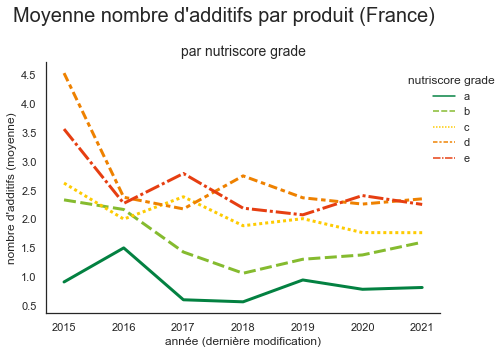

In [117]:

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_agg_by_nutriscore_grade,
       col='additives_n',
       aggfunc='mean',
       ylabel="nombre d'additifs (moyenne)",
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par nutriscore grade'
       )
 )
to_png()


### Pourcent des produits avec additifs (by tag col)

filtre:

- avec/sans additifs
- avec/sans additifs de risque modéré
- avec/sans additifs de risque élevé
- avec/sans huile de palme


"pourcent_produits_avec_additifs_(France).png"


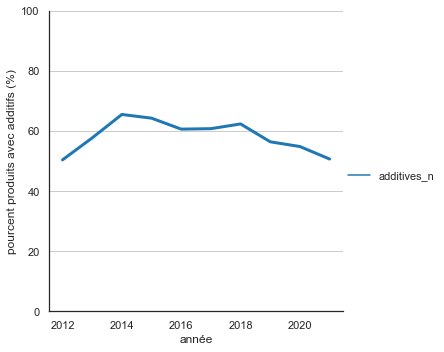

In [118]:
def percent_with_additives(series: pd.Series):
    # series=series.dropna()
    return (series > 0).count() / len(series)


def plot_freq_additives_by_year(df: pd.DataFrame, col='additives_n', groupby_var='nutriscore_grade', aggfunc='mean', date_col='created_datetime'):
    """Visualiser l'évolution dans le temps, basé sur date_col"""
    with_additives = df.pipe(col_group_by_year, groupby_var=groupby_var,
                             col=col, aggfunc=lambda x: (x > 0).sum(), date_col=date_col)
    # print(no_additives.head())
    totals = df.pipe(col_group_by_year, groupby_var=groupby_var,
                     col=col, aggfunc=len, date_col=date_col)
    # print(totals.head())
    frequency = with_additives / totals * 100
    g = sns.relplot(data=frequency, kind="line",
                    palette=get_palette(groupby_var), linewidth=3)
    ax = plt.gca()
    ax.set_ylim(0, 100)
    ax.set_xlabel('année')
    ax.set_ylabel('pourcent produits avec additifs (%)')
    ax.yaxis.grid(True)  # Hide the horizontal gridlines
    # ax.xaxis.grid(True) # Show the vertical gridlines
    return frequency


(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(plot_freq_additives_by_year, groupby_var=None)
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additifs (France)")


"Pourcentage_de_produits_avec_additifs_(France).png"


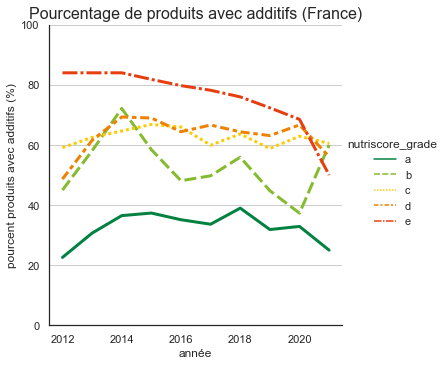

In [119]:
(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(plot_freq_additives_by_year, groupby_var='nutriscore_grade', date_col='created_datetime')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)

plt.title('Pourcentage de produits avec additifs (France)', size=16)
sns.despine()
# plt.tight_layout()
to_png()


"pourcent_produits_avec_additives_-_NOVA_group_(France).png"


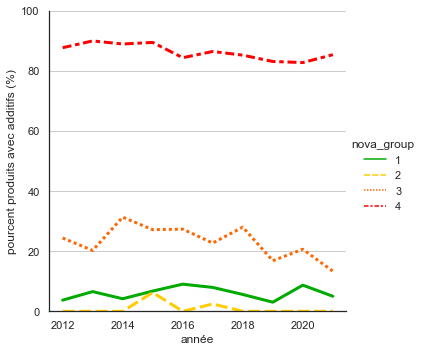

In [120]:
(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        .pipe(plot_freq_additives_by_year, groupby_var='nova_group')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additives - NOVA group (France)")


### 4.1.2 Fréquence (distribution) de nombre d'additifs par nutriscore grade


In [121]:
def plot_column_mean_by_tag(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = (col_group_by_year(df, date_col='last_modified_datetime', col=col, aggfunc='mean')
            .droplevel(0, axis='columns'))
    ax = data.plot(kind='line', color=nutriscore_palette.values())
    # ax = sns.relplot(data=data, kind="line", color=nutriscore_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'nutriscore grade',
               bbox_to_anchor=(1.1, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    sns.despine()
    plt.suptitle(titre, size=20)
    plt.title(soustitre, size=14)
    plt.tight_layout()


#### Nombre d'additifs (huile de palme)

"additifs_huile_de_palme_par_produit_-_Nutriscore_(France).png"


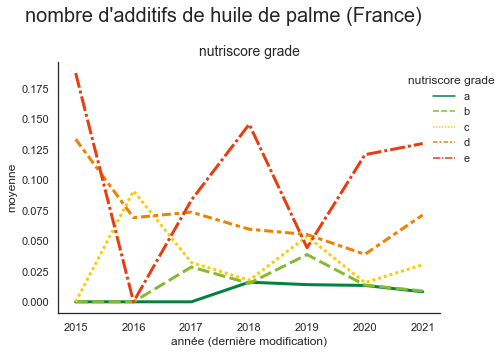

In [122]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_agg_by_nutriscore_grade,
       col='ingredients_from_palm_oil_n',
       aggfunc='mean',
       titre="nombre d'additifs de huile de palme (France)",
       soustitre='nutriscore grade'
       )
 )
to_png("additifs huile de palme par produit - Nutriscore (France)")


"additifs_par_produit_-_NOVA_group_(France).png"


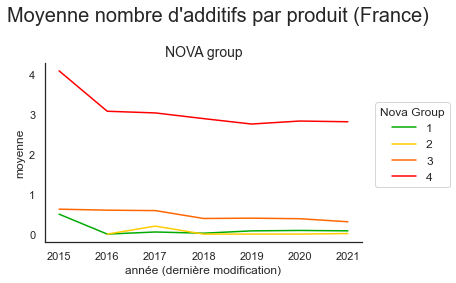

In [123]:
def plot_column_mean_by_nova_group(df:pd.DataFrame, col='unsafe', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='nova_group',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    ax = data.plot(kind='line', color=nova_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'Nova Group',
               bbox_to_anchor=(1.05, 0.5), loc="right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    # plt.legend(title=f'Nova Group',loc="upper right", fontsize=12)
    sns.despine()
    plt.suptitle(titre, size=20)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_nova_group,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='NOVA group'
       )
 )
to_png("additifs par produit - NOVA group (France)")


In [124]:
def count_group_by_year(df: pd.DataFrame, groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    """Compter l'évolution dans le temps, basé sur date_col"""
    count_by_year: pd.DataFrame = (df[[groupby_var, date_col]]
                                   .groupby(by=[groupby_var, df[date_col].dt.year], dropna=True).agg('count')
                                   .rename(columns={date_col: 'effectif'}))
    total_by_yr: pd.DataFrame = (count_by_year
                                 .groupby(level=1, dropna=True).sum()
                                 .rename(columns={'effectif': 'total'}))
    evol_by_year = (count_by_year.join(total_by_yr, how="left", on=date_col))
    evol_by_year['freq'] = (evol_by_year['effectif'] /
                            evol_by_year['total']) * 100
    return evol_by_year


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2014, 2021)
 .pipe(count_group_by_year, date_col='last_modified_datetime')['freq']
 .unstack().style.background_gradient(axis=1)).format(precision=1)


last_modified_datetime,2014,2015,2016,2017,2018,2019,2020,2021
nutriscore_grade,,,,,,,,
a,25.0,19.0,18.4,13.3,10.8,13.6,12.7,15.9
b,12.5,16.5,13.8,16.5,11.7,14.4,12.5,14.7
c,37.5,13.9,17.2,15.1,19.9,24.2,21.7,23.7
d,12.5,26.6,35.6,32.1,29.6,28.8,31.5,28.6
e,12.5,24.1,14.9,22.9,28.0,19.1,21.6,17.1


## 4.2 Analyses sur le nutriscore grade
### 4.2.1 Nutriscore Grade par année (stacked bar chart)

In [125]:

def plot_groupvar_by_year(df:pd.DataFrame, groupby_var='nutriscore_grade', palette=nutriscore_palette,
                          legend=None, titre='', soustitre=''):
    """Affiche fréquence des catégories stacked par an """
    effectif_group_by_year = df.pipe(
        count_group_by_year, groupby_var=groupby_var, date_col='last_modified_datetime')
    ax = (effectif_group_by_year['freq'].unstack(level=0)
          .plot(kind='bar', stacked=True, color=palette.values()))
    if legend is None:
        legend = groupby_var
    plt.legend(title=f'{legend}',
               bbox_to_anchor=(1.1, 0.5), loc="center left", fontsize=12)
    ax.set_xlabel('année (dernière modification)', size=14)
    ax.set_ylabel('produits (%)', size=14)
    sns.despine()
    plt.suptitle(titre, size=20)
    plt.title(soustitre, size=14)
    plt.tight_layout()


"Distribution_nutriscore_par_année_(France).png"


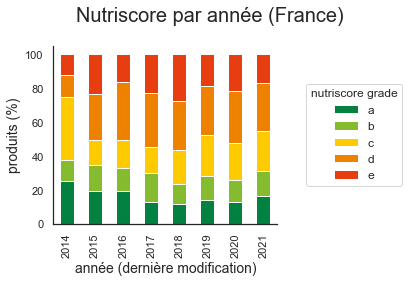

In [126]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nutriscore_grade',
       legend='nutriscore grade',
       palette=nutriscore_palette,
       titre="Nutriscore par année (France)"
       #    soustitre='pour les produits ayant un nutriscore')
       ))
to_png('Distribution_nutriscore_par_année_(France)')


### Nombre d'additifs par an

In [127]:

# evol_by_year.reset_index()['freq'].plot(hue=evol_by_year[groupby_var])
additives_by_year = cleaned_data.pipe(
    count_group_by_year, groupby_var='additives_n')
additives_by_year


effectif  total        freq
additives_n last_modified_datetime                             
0           2012                           1      1  100.000000
            2013                           1      2   50.000000
            2014                           4     17   23.529412
            2015                          38    130   29.230769
            2016                          50    138   36.231884
...                                      ...    ...         ...
28          2020                           3  15042    0.019944
30          2020                           1  15042    0.006648
31          2020                           1  15042    0.006648
32          2020                           1  15042    0.006648
36          2019                           1   1860    0.053763

[135 rows x 3 columns]

"Distribution_novagroup_par_année_(France).png"


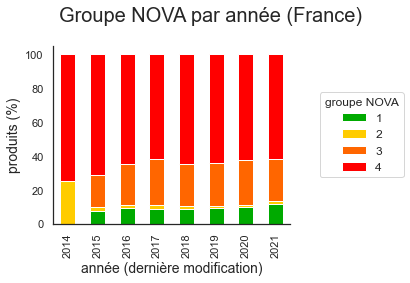

In [129]:
(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='groupe NOVA',
       palette=nova_palette,
       titre="Groupe NOVA par année (France)"
       )
 )
to_png('Distribution_novagroup_par_année_(France)')


"Distribution_novagroup_par_année_(Espagne).png"


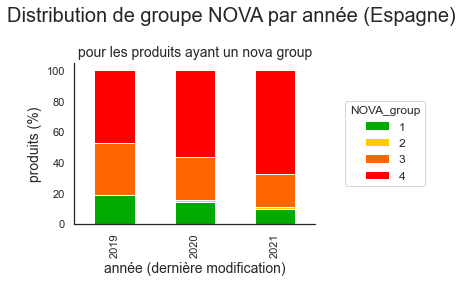

In [130]:
(cleaned_data
 .pipe(filter_by_country, 'Spain')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Espagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Espagne)')


"Distribution_novagroup_par_année_(Allemagne).png"


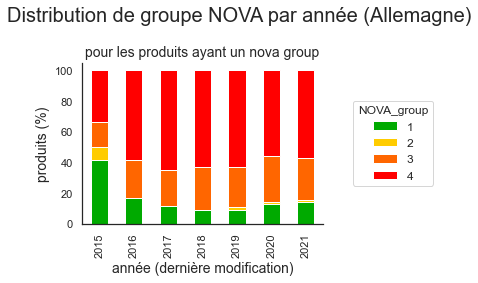

In [131]:
(cleaned_data
 .pipe(filter_by_country, 'Germany')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Allemagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Allemagne)')

"Distribution_de_nutriscore_grade_par_pays.png"


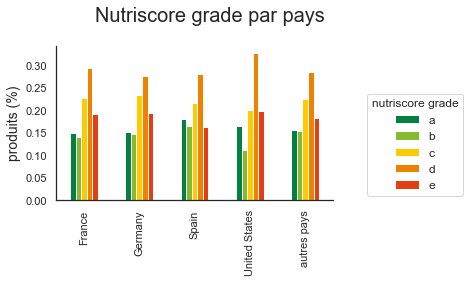

In [132]:
def freq_group_by_tag(df: pd.DataFrame, col='countries_en',
                      groupby_var='nutriscore_grade',
                      nb=10,
                      others=True,
                      others_name='others'
                      ):
    """Comparer les groupes, basé sur country
    Exemple :
        distribution de nutriscore by country
        distribution de nutriscore by brand
        distribution de nutriscore by pnns_group
        distribution de novagroup by country
        distribution de 

    Si les deux variables sont catégoriques, on peut faire un crosstab
    """
    df = explode_frame(df[[groupby_var, col]], col)
    nb = max(1, nb)
    top = df[col].value_counts()[:nb]
    if others:
        df[col] = df[col].where(
            df[col].isna() | df[col].isin(top.index), other=others_name)
    else:
        df = df.where(df[col].isna() | df[col].isin(top.index))
    return pd.crosstab(df[groupby_var], df[col], normalize='columns')


(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nutriscore_grade',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 # .plot(kind='bar', stacked=True, color=nutriscore_palette.values())
 .plot(kind='bar', stacked=False, color=nutriscore_palette.values())
 # .plot(kind='line', color=nutriscore_palette.values())
 )

plt.legend(title='nutriscore grade',
           bbox_to_anchor=(1.1, 0.5), loc="right", fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Nutriscore grade par pays', size=20)
# plt.title('pour produits ayant un nutriscore', size=14)
plt.tight_layout()
to_png('Distribution de nutriscore grade par pays')


"Distribution_de_groupe_NOVA_par_pays.png"


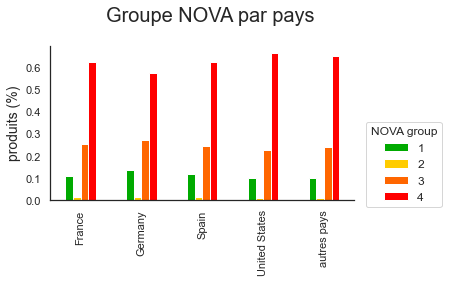

In [133]:
(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nova_group',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 # .plot(kind='bar', stacked=True, color=nutriscore_palette.values())
 .plot(kind='bar', stacked=False, color=nova_palette.values())
 # .plot(kind='line', color=nutriscore_palette.values())
 )

plt.legend(title='NOVA group',
           bbox_to_anchor=(1.05, 0.6), loc=1, fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Groupe NOVA par pays', size=20)
# plt.title('pour produits ayant un groupe NOVA', size=14)
plt.tight_layout()
to_png('Distribution de groupe NOVA par pays')


"Proportion_de_produits_ayant_un_nombre_d'additifs_par_année.png"


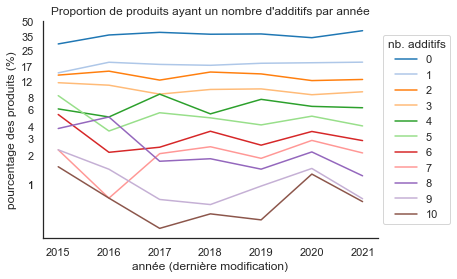

In [134]:
from matplotlib.ticker import FormatStrFormatter

additives_by_year.unstack(level=0)['freq'].iloc[3:, :11].plot()
plt.xlabel('année (dernière modification)')
plt.ylabel('pourcentage des produits (%)')
plt.yscale('log')
plt.gca().set_yticks(np.geomspace(1, 50, 12).round())
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d'))
plt.legend(title='nb. additifs', loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Proportion de produits ayant un nombre d'additifs par année")
sns.despine()
to_png("Proportion de produits ayant un nombre d'additifs par année")


In [135]:
additives_by_year.unstack(level=0)['freq'].T


last_modified_datetime,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
additives_n,,,,,,,,,,
0,100.0,50.0,23.529412,29.230769,36.231884,38.596491,36.894410,37.150538,33.958250,40.154670
1,NaN,50.0,29.411765,14.615385,18.840580,17.894737,17.515528,18.387097,18.621194,18.881618
2,NaN,NaN,17.647059,13.846154,15.217391,12.280702,14.906832,14.247312,12.139343,12.468769
3,NaN,NaN,11.764706,11.538462,10.869565,8.771930,9.813665,9.946237,8.649116,9.280190
4,NaN,NaN,NaN,6.153846,5.072464,8.771930,5.465839,7.741935,6.541683,6.329566
...,...,...,...,...,...,...,...,...,...,...
28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.019944,NaN
30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006648,NaN
31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006648,NaN


### Est-ce que les valeurs moyennes des additifs, valeurs nutritionnelles ont changé pendant le temps ?


In [136]:
# pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option("precision", 2)
(cleaned_data
 .groupby(cleaned_data['last_modified_datetime'].dt.year).mean()
 .style.bar(color='#33d65f50')
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
last_modified_datetime,,,,,,,,,,,,,
2012,0.00,0.00,0.00,20.00,2395.00,40.00,15.50,42.50,39.00,7.50,7.70,0.01,27.00
2013,0.50,0.00,0.50,7.50,712.50,9.60,1.60,1.75,0.45,1.50,18.70,0.80,0.00
2014,2.41,0.00,0.12,7.94,1250.00,23.31,10.76,16.40,9.39,1.75,5.64,0.32,17.93
2015,2.71,0.05,0.17,9.68,1139.83,15.01,5.76,25.40,11.86,1.94,8.43,0.41,10.04
2016,1.99,0.03,0.17,9.80,1139.40,15.24,6.41,23.56,12.19,2.36,9.29,0.41,8.45
2017,2.00,0.05,0.10,9.32,1057.20,13.83,5.57,24.03,12.97,2.60,8.13,0.43,12.43
2018,2.05,0.05,0.15,10.18,1121.49,14.23,5.89,27.02,15.22,2.32,7.34,0.50,11.32
2019,1.97,0.04,0.13,8.92,1081.12,13.30,5.45,26.12,12.98,2.75,8.10,0.47,11.95
2020,2.57,0.01,0.06,9.57,1188.51,13.53,4.96,33.18,15.20,2.77,8.02,0.49,7.30


In [137]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .groupby(cleaned_data['created_datetime'].dt.year).mean()
 .style.bar()
 # .style.bar(foo='#33d65f50')
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
created_datetime,,,,,,,,,,,,,
2012,1.32,0.04,0.13,8.18,1142.90,13.52,5.98,28.78,13.21,3.02,8.99,0.42,12.24
2013,1.70,0.05,0.17,7.06,1150.14,13.44,5.28,29.92,11.56,2.90,8.04,0.41,12.83
2014,2.25,0.06,0.21,8.25,1096.53,13.97,5.11,25.99,10.93,2.31,7.47,0.45,16.12
2015,2.20,0.06,0.19,8.69,1142.92,14.64,5.68,26.85,12.24,2.52,7.55,0.38,14.05
2016,1.90,0.06,0.14,8.77,1123.71,13.25,5.43,28.67,14.51,2.87,7.87,0.35,14.21
2017,1.89,0.05,0.14,9.31,1136.87,14.07,5.51,27.68,14.14,2.62,7.83,0.39,13.35
2018,1.87,0.05,0.13,9.77,1149.40,14.17,5.78,27.92,14.31,2.98,8.12,0.38,12.12
2019,1.77,0.04,0.12,9.00,1180.62,14.81,5.93,28.91,14.66,3.34,7.77,0.34,13.34
2020,1.48,0.01,0.11,7.62,1072.08,13.46,5.40,24.11,10.23,3.66,9.18,0.46,12.22


In [138]:
# sns.scatterplot(data=cleaned_data, x='last_modified_datetime',
#                 y='created_datetime',
#                 hue='nutriscore_score',
#                 s=1)
# to_png('date_created_vs_date_modified_hue_date_diff_scatterplot')


### Conclusion

### 4.1.4 Additives by nutriscore grade (descriptive)


In [139]:
cleaned_data[['additives_n', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                     4203.0  0.87  1.75  0.0  0.0  0.0  1.0  18.0
b                     3516.0  1.80  2.48  0.0  0.0  1.0  3.0  25.0
c                     5729.0  2.06  2.66  0.0  0.0  1.0  3.0  25.0
d                     8164.0  2.85  3.31  0.0  0.0  2.0  4.0  36.0
e                     5073.0  3.15  3.79  0.0  1.0  2.0  4.0  32.0

In [140]:
(cleaned_data
 .pipe(filter_by_country, 'france')[['additives_n', 'nutriscore_grade']]
 .groupby('nutriscore_grade').describe(percentiles=None)
 )


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                     1460.0  0.80  1.55  0.0  0.0  0.0  1.0  14.0
b                     1389.0  1.54  2.07  0.0  0.0  1.0  2.0  12.0
c                     2220.0  1.83  2.27  0.0  0.0  1.0  3.0  14.0
d                     2881.0  2.35  2.84  0.0  0.0  1.0  4.0  22.0
e                     1886.0  2.33  2.44  0.0  1.0  2.0  3.0  24.0

On note qu'il y jusqu'à 21 additifs pour le meilleur nutriscore grade !!


"additives_n_vs_nutriscore_grade_boxplot.png"


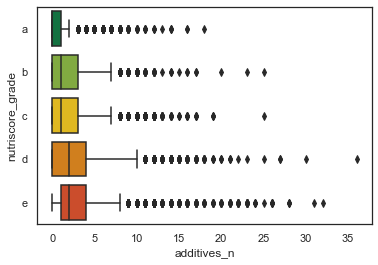

In [141]:
sns.boxplot(data=cleaned_data, y='nutriscore_grade', x='additives_n',
            palette=nutriscore_palette, order=nutriscore_order)
to_png('additives_n_vs_nutriscore_grade_boxplot')


"fat_100g_vs_nutriscore_grade_boxplot.png"


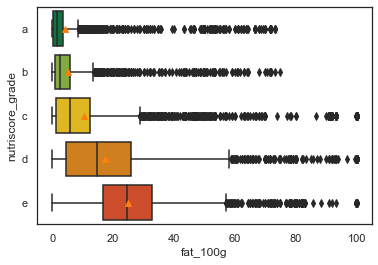

"saturated-fat_100g_vs_nutriscore_grade_boxplot.png"


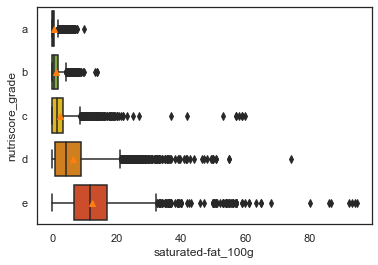

"carbohydrates_100g_vs_nutriscore_grade_boxplot.png"


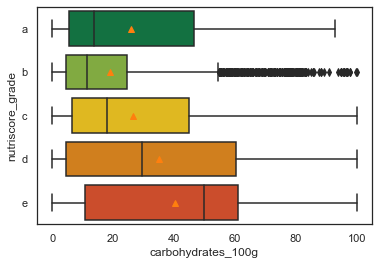

"sugars_100g_vs_nutriscore_grade_boxplot.png"


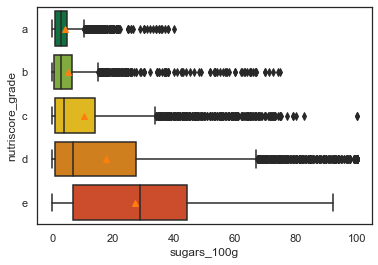

"fiber_100g_vs_nutriscore_grade_boxplot.png"


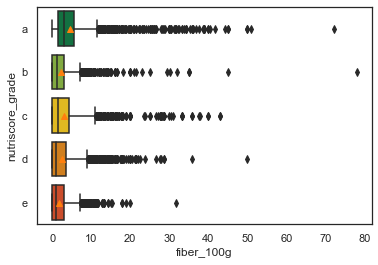

"proteins_100g_vs_nutriscore_grade_boxplot.png"


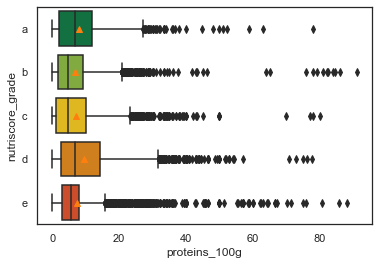

"sodium_100g_vs_nutriscore_grade_boxplot.png"


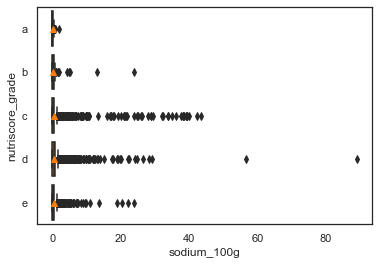

"fruits-vegetables-nuts-estimate-from-ingredients_100g_vs_nutriscore_grade_boxplot.png"


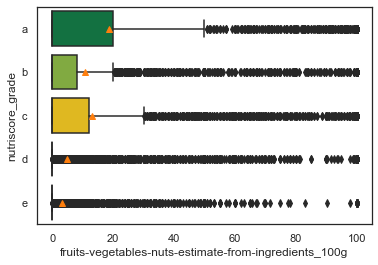

In [142]:
for col in colonnes_100g:
    sns.boxplot(data=cleaned_data, y='nutriscore_grade', x=col, showmeans=True,
                palette=nutriscore_palette, order=nutriscore_order)
    to_png(f'{col}_vs_nutriscore_grade_boxplot')
    plt.show()


"colonnes_nutritionnelles_boxplot.png"


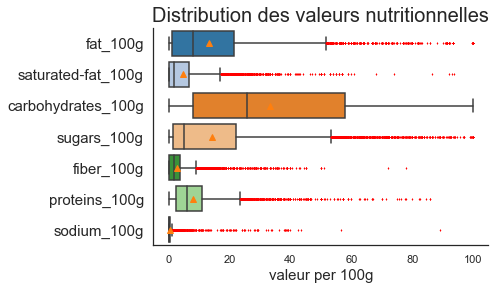

"colonnes_nutritionnelles_(France)_boxplot.png"


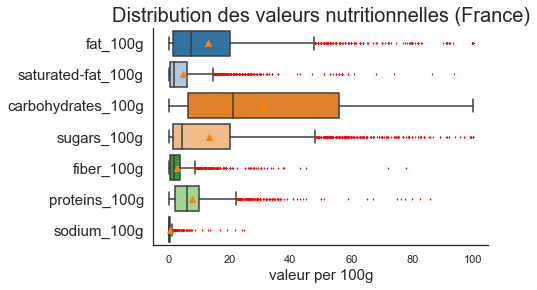

"colonnes_nutritionnelles_(United_states)_boxplot.png"


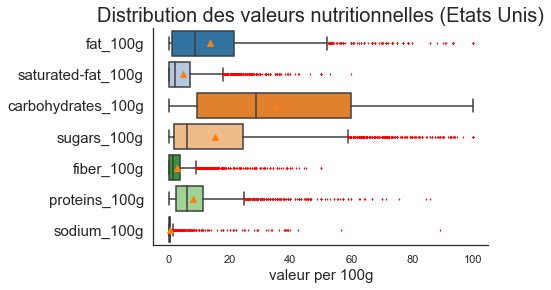

In [143]:
def cols_nutritionnelles_not_fln(df:pd.DataFrame):
    return df.columns[
        (df.columns.str.endswith('_100g'))
        & ~(df.columns.str.contains('energy'))
        & ~(df.columns.str.contains('estimate'))
        ]


colonnes_100g_not_fln = cleaned_data.pipe(cols_nutritionnelles_not_fln)


def plot_box_colonnes_100g(df:pd.DataFrame, colonnes=colonnes_100g_not_fln):
    colonnes = cols_in_df(df, colonnes)
    data = df[colonnes].dropna()
    flierprops = dict(markerfacecolor='red', markersize=2,
                      markeredgecolor='None')
    g = sns.boxplot(data=pd.melt(data), y='variable', x='value',
                    showmeans=True, showfliers=True, flierprops=flierprops)
    labels = g.get_yticklabels()
    g.set_yticklabels(labels, fontsize=15)
    g.set_title(f'box plot des colonnes nutritionnelles')
    g.set_xlabel('valeur per 100g', fontsize=15)
    g.set_ylabel('')
    sns.despine()


(cleaned_data
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles', size=20)
to_png('colonnes nutritionnelles boxplot')
plt.show()

# Est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (France)', size=20)
to_png('colonnes nutritionnelles (France) boxplot')
plt.show()

# est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (Etats Unis)', size=20)
to_png('colonnes nutritionnelles (United states) boxplot')


## 4.3 Analyses sur le nutriscore score

### 4.3.1 Nutriscore score par pays
#### 4.3.1.1 Est-ce que les nutriscores ont la même distribution pour tous les pays? 

Kolmogorov-Smirnov [France] : stat=0.732, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Germany] : stat=0.716, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Spain] : stat=0.683, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [United States] : stat=0.736, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=25094), [9835, 1947, 1042, 12270]
Levene homoscédasticité : stat=0.494, p=0.687
Levene test, accept H0: groups have similar variance
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
"nutriscore_score_par_pays_box_plot.png"


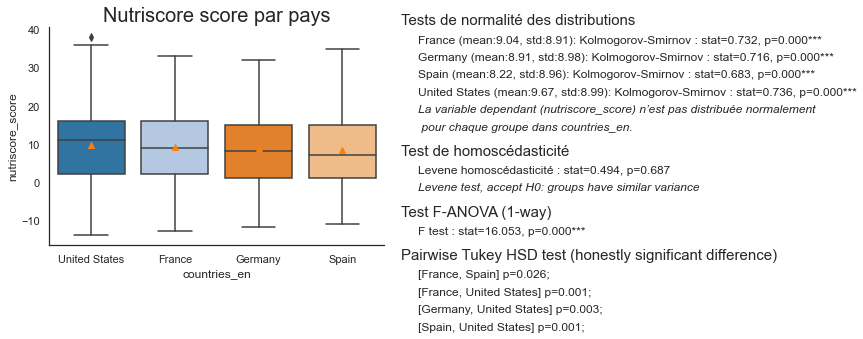

In [144]:
def plot_colonne_mean_by_top_categories(df:pd.DataFrame, y_var='nutriscore_score', groups_var='countries_en', nb=4):
    data = df[[y_var, groups_var]].dropna()
    data = explode_frame(data, groups_var)
    categories = data[groups_var].value_counts()
    nb = min(len(categories), nb)
    top_categories = categories.head(nb).index.to_list()
    top_categories.sort()

    # exclure les autres categories qui ne sont pas dans le plus frequent
    data = data[data[groups_var].isin(top_categories)]

    # Groupes
    # groups=group_by_groups(data,y_var, groups_var)
    plot_box_groupby(data, y_var, groups_var, showtukey=True)


cleaned_data.pipe(plot_colonne_mean_by_top_categories, y_var='nutriscore_score', groups_var='countries_en')
plt.title('Nutriscore score par pays', fontsize=20)
to_png('nutriscore_score_par_pays_box_plot')

### 4.1.4 Nombre d'additifs (distributions) par nutriscore grade (kdeplot)


"additives_n_vs_nutriscore_grade_kdeplot.png"


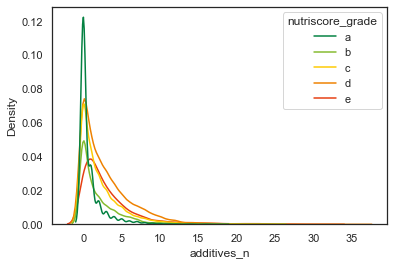

In [145]:
sns.kdeplot(data=cleaned_data.sort_values(by='nutriscore_grade'),
            hue='nutriscore_grade', x='additives_n', palette=nutriscore_palette)
to_png('additives_n_vs_nutriscore_grade_kdeplot')


#### 4.1.4.1 Nombre d'additifs distribution par nutriscore_score (joint plots)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot.png"


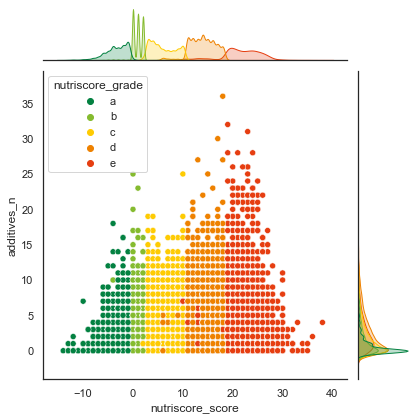

In [146]:
g=sns.jointplot(data=cleaned_data, x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
g.ax_joint.
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot')


#### 4.1.4.2 C'est répresentatif de la France ? (jointplot)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france.png"


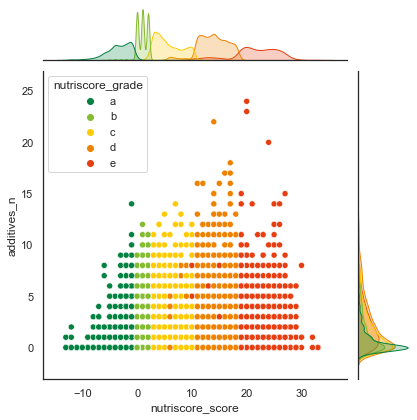

In [147]:
sns.jointplot(data=cleaned_data.pipe(filter_by_country, 'france'),
              x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france')


#### 4.1.4.3 Essaie (sans succès) de mettre la densité dans le scatter plot (hexbin jointplot)

- trop d'information
- il y a d'autres plus interessant


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin.png"


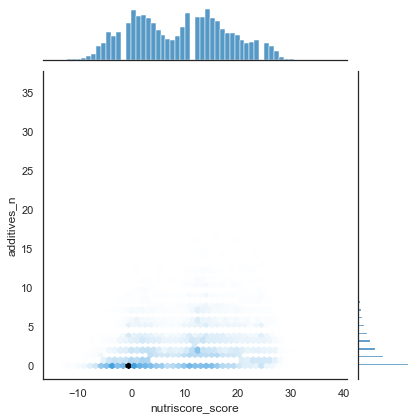

In [148]:
sns.jointplot(data=cleaned_data, kind='hex', x='nutriscore_score',
              y='additives_n', palette=nutriscore_palette)
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin')


---

# 5. Analyse des additifs (par tag)

_"Les additifs alimentaires sont des substances ajoutées intentionnellement aux aliments pour exercer certaines fonctions technologiques spécifiques, par exemple pour colorer, sucrer ou contribuer à la conservation des aliments."_

_"Dans l’Union européenne, tous les additifs alimentaires sont identifiés par un numéro commençant par « E ». Les additifs alimentaires sont toujours inclus dans la liste des ingrédients des aliments auxquels ils sont ajoutés. L’étiquetage du produit doit mentionner tant la fonction de l’additif dans le produit fini (par ex. colorant, conservateur) que la substance spécifique utilisée, soit en se référant au numéro E correspondant ou à son nom (ex. E 415 ou gomme xanthane)."_

_"Les additifs les plus communs mentionnés sur les étiquettes sont les antioxydants (qui empêchent la détérioration due à l'oxydation), les colorants, les émulsifiants, les stabilisateurs, les agents gélifiants et épaississants, les conservateurs et les édulcorants."_

- <https://www.efsa.europa.eu/fr/topics/topic/food-additives>


## 5.1 Import des données des additifs


In [149]:
additives_detail = (pd.read_csv(os_path_join(OUT_FOLDER, ADDITIVES_DETAIL),
                                encoding='UTF-8', sep='\t')
                    .pipe(drop_colonnes_sans_nom))
additives_detail.info(verbose=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 655 entries, 0 to 654
Columns: 28 entries, id to efsa_evaluation_exposure_mean_greater_than_noael
dtypes: float64(1), object(27)
memory usage: 143.4+ KB


In [150]:
print(list(additives_detail.columns))


['id', 'efsa_evaluation', 'name', 'efsa_evaluation_date', 'vegetarian', 'efsa_evaluation_url', 'e_number', 'vegan', 'wikidata', 'efsa', 'additives_classes', 'efsa_evaluation_overexposure_risk', 'efsa_evaluation_adi', 'from_palm_oil', 'efsa_evaluation_exposure_95th_greater_than_adi', 'efsa_evaluation_exposure_mean_greater_than_adi', 'colour_index', 'description', 'efsa_evaluation_adi_established', 'efsa_evaluation_safety_assessed', 'organic_eu', 'mandatory_additive_class', 'comment', 'default_additive_class', 'ciqual_food_name', 'ciqual_food_code', 'efsa_evaluation_exposure_95th_greater_than_noael', 'efsa_evaluation_exposure_mean_greater_than_noael']


## 5.2 Filtre les classes d'additifs par ceux qui sont present dans la base de données


In [151]:
def filtre_additive_classes(detail=additives_detail, data_df=cleaned_data):
    # TODO
    additives_in_data = (pd.DataFrame(
        explode_series(data_df['additives_tags'].dropna()).unique(), columns={'id'})
                         .set_index('id')
                         )
    additives_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                          .set_index('id')
                          )
    additives_maybe_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_that_may_be_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                                .set_index('id')
                                )
    # print(additives_palm_oil.index.tolist())
    # print(additives_maybe_palm_oil.index.tolist())
    detail = detail.copy().set_index('id')

    # check tous les additifs dans data sont present dans détail
    palm_not_in_detail = list(set(additives_palm_oil.index) - set(detail.index))
    maybe_palm_not_in_detail = list(
        set(additives_maybe_palm_oil.index) - set(detail.index))
    add_not_in_detail = list(set(additives_in_data.index) - set(detail.index))
    add_not_in_data = list(set(detail.index) - set(additives_in_data.index))
    add_in_both = list(set(detail.index) - set(add_not_in_data))
    add_palm_oil_not_in_additives_tags = list(
        set(additives_palm_oil.index) - set(additives_in_data.index))
    add_maybe_palm_oil_not_in_additives_tags = list(
        set(additives_maybe_palm_oil.index) - set(additives_in_data.index))
    print(f'not_in_data: {len(add_not_in_data)}')
    print(f'palm_not_in_data: {len(add_palm_oil_not_in_additives_tags)}')
    print(
        f'palm_maybe_not_in_data: {len(add_maybe_palm_oil_not_in_additives_tags)}')

    print(f'palm_not_in_detail: {len(palm_not_in_detail)}')
    print(f'palm_maybe_not_in_detail: {len(maybe_palm_not_in_detail)}')

    # on ne peut pas rassemble les additifs d'huile de palme avec additives_tags

    print(f'not_in_detail: {add_not_in_detail}')
    print(f'both: {len(add_in_both)}')
    print(f'nb additive classes in data ={len(additives_in_data)}')
    print(f'nb additive classes in additives_detail ={len(detail)}')

    detail = detail.join(additives_in_data, how='inner').reset_index()
    print(f'nb additive classes in additives_detail ={len(detail)}')
    return detail


print(additives_detail.shape)
additives_detail = filtre_additive_classes(additives_detail, cleaned_data)
print(additives_detail.shape)


(655, 28)
not_in_data: 295
palm_not_in_data: 4
palm_maybe_not_in_data: 17
palm_not_in_detail: 4
palm_maybe_not_in_detail: 17
not_in_detail: []
both: 360
nb additive classes in data =360
nb additive classes in additives_detail =655
nb additive classes in additives_detail =360
(360, 28)


### 5.2.1 Conclusion : Huile de palme est un ingrédient, pas un additif !!!

On voit que les additifs d'huile de palme ne sont pas considérés comme additifs

- Peut-être à ajouter


## 5.3 Additives present dans plus de 100 produits


In [152]:
def frequent_additives_tags(df:pd.DataFrame, min_count=100):
    freq = explode_series(df['additives_tags'].dropna()).value_counts()
    freq = freq[freq.values >= min_count]
    return freq


freq_add = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(frequent_additives_tags)
            )
freq_add.head()


en:e330     1570
en:e322     1184
en:e322i    1029
en:e14xx     883
en:e500      861
Name: additives_tags, dtype: int64

### 5.3.1 Filtre les produits par additives tags


In [153]:
def filter_by_unsafe_additives_tags(df:pd.DataFrame, additives_tags_list=None, min_count=100):
    if additives_tags_list is None:
        additives_tags_list = frequent_additives_tags(
            df, min_count=min_count).index
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(additives_tags_list)]
    return add_df


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, min_count=1)
 ).head()


,additives_tags
9,en:e412
9,en:e415
11,en:e100
11,en:e120
11,en:e133


## 5.4 Clustering des additifs

Objectif: Essaie de grouper les additifs par leur fonctionalité - présence dans certains groupes 
- voir les correlations / covariances des additifs

### 5.4.1 Méthode 1: Crosstabulation des additive tags (pd.dummies)

- trop gourmand en memoire
- mieux faire un stack ?


In [154]:

def crosstab_additives_tags(df:pd.DataFrame):
    # return pd.crosstab(df.index,df['additives_tags'])
    return pd.get_dummies(df['additives_tags']).groupby(level=0).sum()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, min_count=1000)
 .pipe(crosstab_additives_tags)
 ).head()


,en:e322,en:e322i,en:e330
16,1,1,0
42,0,0,1
96,1,0,0
99,1,1,0
151,0,0,1


### 5.4.2 Obtient l'étiquette pour un tag


In [155]:
print(additives_detail.shape)
add_labels = dict(list(zip(additives_detail['id'], additives_detail['name'])))


def get_additive_labels(additives_tags_list):
    return [add_labels[x] for x in additives_tags_list]


get_additive_labels(['en:e100', 'en:e412', 'en:e415'])


(360, 28)


['E100 - Curcumin', 'E412 - Guar gum', 'E415 - Xanthan gum']

### 5.4.3 Dendrograms des additifs


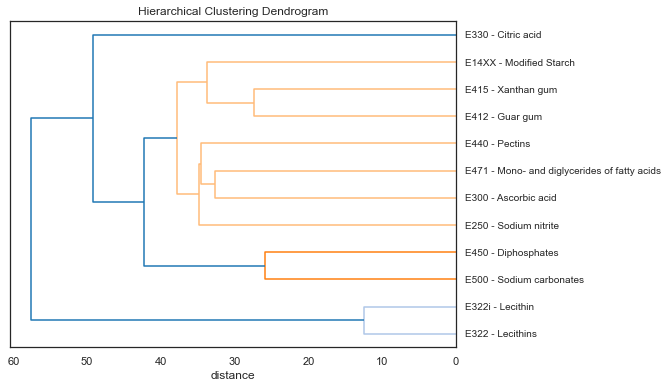

In [156]:

import scipy.cluster.hierarchy as shc


# https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/#h2_7


def plot_dendrogram(df:pd.DataFrame, method='ward', figsize=(10, 25), fontsize=16, mod_risk_tags=[], high_risk_tags=[]):
    """Plot a dendrogram to illustrate hierarchical clustering
    df should be scaled for correct linkage
    """
    if df.shape[0] > df.shape[1]:
        df = df.T
    plt.figure(figsize=figsize)
    dend = shc.dendrogram(shc.linkage(df, metric='euclidean', optimal_ordering=True, method=method),
                          labels=df.index,
                          orientation="left")
    ax = plt.gca()
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])

    ax.set_yticklabels(labels=labels, fontsize=fontsize)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')


# plot_dendrogram(ct.T)
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, min_count=500)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram, figsize=(8, 6), mod_risk_tags=[], fontsize=10)
 )


## 5.5 Classes d'additifs


### 5.5.1 Chaque additif peut avoir plusieurs rôles


"E3_venn_plot_[additives_classes]_en-stabiliser_en-emulsifier_en-thickener.png"


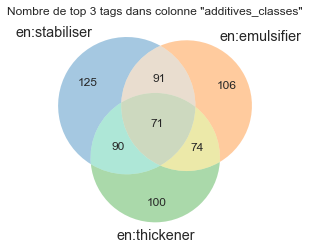

In [157]:
additives_detail.pipe(plot_venn_tag_count, 'additives_classes')


### 5.5.2 Nombre d'additifs de chaque classe

- il sera très interressant de corréler les additifs dans les produits avec les classes d'additif
- c'est dehors de la portée de ce projet


"Classes_d'additifs_présents_dans_les_aliments.png"


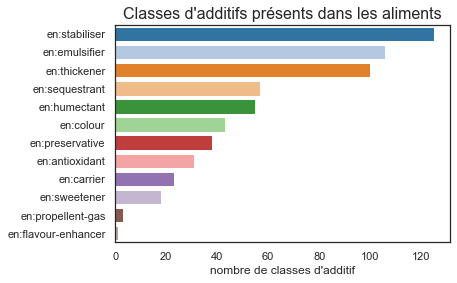

In [158]:
additive_classes = (explode_series(additives_detail['additives_classes'])
                    .value_counts(ascending=False)
                    .to_frame('effectif'))

ax = sns.barplot(y=additive_classes.index, x=additive_classes['effectif'])
ax.set_xlabel("nombre de classes d'additif")
plt.title("Classes d'additifs présents dans les aliments", size=16)
to_png()


## 5.6 Additifs nocifs pour la santé

- <https://github.com/openfoodfacts/openfoodfacts-server/issues/1374>
- <https://www.efsa.europa.eu/en/topics/topic/food-additives>


In [159]:
additives_detail['efsa_evaluation_overexposure_risk'].value_counts()


en:high        31
en:moderate    12
en:no          12
Name: efsa_evaluation_overexposure_risk, dtype: int64

In [160]:
def get_unsafe_additives(detail: pd.DataFrame, tags=('high', 'moderate')):
    if type(tags) is str:
        tags = [tags]
    tags = '|'.join(tags)
    filtre = detail['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return detail[filtre]


print(f"high : {len(get_unsafe_additives(additives_detail, tags='high'))}")
print(
    f"moderate : {len(get_unsafe_additives(additives_detail, tags='moderate'))}")
unsafe_additives = get_unsafe_additives(additives_detail)
print(f"total nombre d'additifs nocifs: {len(unsafe_additives)}")

additives_detail.pipe(get_unsafe_additives, 'high')
additives_detail.pipe(get_unsafe_additives, 'moderate')
unsafe_additives = additives_detail.pipe(get_unsafe_additives)
print(unsafe_additives['name'].to_list())


high : 31
moderate : 12
total nombre d'additifs nocifs: 43
['E482 - Calcium stearoyl-2-lactylate', 'E432 - Polyoxyethylene sorbitan monolaurate', 'E228 - Potassium bisulphite', 'E131 - Patent blue v', 'E407 - Carrageenan', 'E133 - Brilliant blue FCF', 'E436 - Polyoxyethylene sorbitan tristearate', 'E339 - Sodium phosphates', 'E509 - Calcium chloride', 'E200 - Sorbic acid', 'E481 - Sodium stearoyl-2-lactylate', 'E223 - Sodium metabisulphite', 'E150c - Ammonia caramel', 'E251 - Sodium nitrate', 'E220 - Sulphur dioxide', 'E202 - Potassium sorbate', 'E407a - Processed eucheuma seaweed', 'E451 - Triphosphates', 'E252 - Potassium nitrate', 'E155 - Brown ht', 'E341 - Calcium phosphates', 'E221 - Sodium sulphite', 'E211 - Sodium benzoate', 'E508 - Potassium chloride', 'E212 - Potassium benzoate', 'E492 - Sorbitan tristearate', 'E433 - Polyoxyethylene sorbitan monooleate', 'E435 - Polyoxyethylene sorbitan monostearate', 'E338 - Phosphoric acid', 'E343 - Magnesium phosphates', 'E511 - Magnesium 

In [161]:
def get_safe_additives(df:pd.DataFrame):
    tags = 'high|moderate'
    filtre = df['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return df[~filtre]


safe_additives = additives_detail.pipe(get_safe_additives)
print(len(safe_additives))
safe_additives[['id', 'name']]
# safe_additives_en=safe_additives['name'].tolist()


317


,id,name
0,en:e1412,E1412 - Distarch phosphate
1,en:e100,E100 - Curcumin
3,en:e1404,E1404 - Oxidised starch
4,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids
6,en:e304,E304 - Fatty acid esters of ascorbic acid
...,...,...
355,en:e460,E460 - Cellulose
356,en:e999,E999 - Quillaia extract
357,en:e903,E903 - Carnauba wax
358,en:e160aii,E160aii - Plant carotenes


## 5.7 Huile de palme: Additifs qui peuvent accélérer le metastasis de cancer

"Dietary palmitic acid promotes a prometastatic memory via Schwann cells"

"we show that **dietary palmitic acid (PA)**, but not oleic acid or linoleic acid, **promotes metastasis** in oral carcinomas and melanoma"

Article :

- <https://www.nature.com/articles/s41586-021-04075-0>
- <https://doi.org/10.1038/s41586-021-04075-0>

Analyse statistique :

- <https://github.com/MarcElosua/10X-EPID>


In [162]:
def tag_colonnes(df:pd.DataFrame):
    return df.columns[df.columns.str.contains(',').any()]


liste_colonnes = tag_colonnes(cleaned_data)


In [163]:
def get_additives_may_be_palm_oil(df:pd.DataFrame, country=None):
    filtre = np.full(len(df), True) if country is None else df['countries_en'].fillna(
        '').str.contains(country)
    return (explode_series(
        df[filtre]['ingredients_that_may_be_from_palm_oil_tags'].dropna())
            .value_counts())


def get_additives_palm_oil(df:pd.DataFrame):
    return (explode_series(
        df['ingredients_from_palm_oil_tags'].dropna())
            .value_counts())


# additives_palm_oil=cleaned_data.pipe(get_additives_palm_oil)
additives_may_be_palm_oil = cleaned_data.pipe(get_additives_may_be_palm_oil)

print(additives_may_be_palm_oil)
additives_may_be_palm_oil_france = cleaned_data.pipe(
    get_additives_may_be_palm_oil, 'France')
# print (additives_palm_oil)
print(additives_may_be_palm_oil_france)


e471-mono-et-diglycerides-d-acides-gras-alimentaires                      734
e160a-beta-carotene                                                       571
huile-vegetale                                                            447
e433-monooleate-de-polyoxyethylene-de-sorbitane                           179
e472e-ester-monoacethyltartrique-de-mono-et-diglycerides-d-acides-gras     95
                                                                         ... 
e470-sels-de-sodium-potassium-calcium-d-acides-gras                         2
monostearate-de-glycerol                                                    1
e432-monolaurate-de-polyoxyethylene-sorbitane                               1
e484-citrate-de-stearyle                                                    1
e470a-stearate-de-sodium-potassium-calcium                                  1
Name: ingredients_that_may_be_from_palm_oil_tags, Length: 17, dtype: int64
e471-mono-et-diglycerides-d-acides-gras-alimentaires               

In [164]:
def filter_by_unsafe_additives(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna(
        '').str.contains(additives, regex=True)
    return df[filtre]


unsafe_products = cleaned_data.pipe(filter_by_unsafe_additives)
unsafe_products.shape


en:e482|en:e432|en:e228|en:e131|en:e407|en:e133|en:e436|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e492|en:e433|en:e435|en:e338|en:e343|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450


(8027, 33)

In [165]:
def get_safe_products(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna('').str.contains(additives, regex=True)
    return df[~filtre]


safe_products = cleaned_data.pipe(get_safe_products)
safe_products.shape

en:e482|en:e432|en:e228|en:e131|en:e407|en:e133|en:e436|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e492|en:e433|en:e435|en:e338|en:e343|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450


(18658, 33)

---
# 6. ADDISCORE - création et analyse

## 6.1 Création de l'addiscore
Il y a 2 composants de l'addiscore:
- addiscore_score  : compter le nombre d'additifs de risque bas, modéré ou haut
- addiscore_risque : basé sur la présence d'additifs de risque bas, modéré ou haut


### 6.1.1 Créer des colonnes pour indiquer le score d'additifs
- `risk_haut_n`: compte d'additifs de risque élevés de sur exposure
- `risk_mod_n` : compte d'additifs de risque modérés
- `risk_bas_n` : compte d'additifs de risque bas

In [166]:
selected_cols = ['id', 'name', 'additives_classes',
                 'efsa_evaluation_date', 'efsa_evaluation_exposure_95th_greater_than_adi']
low_risk_additives = additives_detail.pipe(get_safe_additives)
low_risk_additives[selected_cols].head()


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
0,en:e1412,E1412 - Distarch phosphate,"en:emulsifier,en:stabiliser,en:thickener",NaN,NaN
1,en:e100,E100 - Curcumin,en:colour,2010-09-06,NaN
3,en:e1404,E1404 - Oxidised starch,"en:emulsifier,en:stabiliser,en:thickener",NaN,NaN
4,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids,"en:antioxidant,en:emulsifier,en:sequestrant,en:stabiliser",NaN,NaN
6,en:e304,E304 - Fatty acid esters of ascorbic acid,en:antioxidant,2015-11-18,NaN


In [167]:
mod_risk_additives = additives_detail.pipe(get_unsafe_additives, 'moderate')
mod_risk_additives[selected_cols].head()
# mod_risk_additives


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
5,en:e432,E432 - Polyoxyethylene sorbitan monolaurate,"en:emulsifier,en:stabiliser",2015-07-17,"en:adults, en:elderly, en:children, en:toddlers"
27,en:e131,E131 - Patent blue v,NaN,2013/03/01,"en:children, en:toddlers"
48,en:e133,E133 - Brilliant blue FCF,en:colour,2010/11/22,"en:children, en:toddlers"
84,en:e436,E436 - Polyoxyethylene sorbitan tristearate,"en:emulsifier,en:stabiliser",2015-07-17,"en:adults, en:elderly, en:children, en:toddlers"
92,en:e509,E509 - Calcium chloride,"en:stabiliser,en:thickener",2019/07/06,"en:adolescents, en:children, en:toddlers"


In [168]:
high_risk_additives = additives_detail.pipe(get_unsafe_additives, 'high')
high_risk_additives[selected_cols].tail()



,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
270,en:e250,E250 - Sodium nitrite,en:preservative,2017/06/15,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
290,en:e491,E491 - Sorbitan monostearate,en:emulsifier,2017-05-05,"en:adults, elderly, adolescent, children, en:toddlers, infants"
301,en:e222,E222 - Sodium bisulphite,"en:antioxidant,en:preservative",2016-04-14,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
315,en:e621,E621 - Monosodium glutamate,en:flavour-enhancer,2017/07/12,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
340,en:e450,E450 - Diphosphates,"en:emulsifier,en:humectant,en:sequestrant,en:stabiliser,en:thickener",2019/06/12,"en:adolescents, en:children, en:toddlers, en:infants"


### 6.1.2 Comptage d'additifs de risque bas, modéré, haut

In [169]:
def count_additives(df:pd.DataFrame, additives_list):
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(
        additives_list)].groupby(level=0).sum()
    return add_df


count_low_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_unsafe_additives_tags, mod_risk_additives['id'])
                                .value_counts()
                                )

count_low_risk.head()


additives_tags
en:e133           51
en:e150c          50
en:e960           47
en:e509           46
en:e131           21
dtype: int64

In [170]:
count_mod_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_unsafe_additives_tags, mod_risk_additives['id'])
                                # .value_counts()
                                )

count_mod_risk.head()


,additives_tags
11,en:e133
188,en:e435
2099,en:e509
2386,en:e960
2491,en:e133


In [171]:
mod_risk_additive_count: pd.DataFrame = (cleaned_data
                                         .pipe(filter_by_country, 'France')
                                         .pipe(filter_by_unsafe_additives_tags, mod_risk_additives['id'])
                                         # count nombre de tags
                                         .groupby(level=0).count()
                                         )
print(mod_risk_additive_count.shape)
mod_risk_additive_count[mod_risk_additive_count['additives_tags'] > 1].head()


(231, 1)


,additives_tags
36957,2
56600,3
56667,2
61411,2
71925,2


In [172]:
count_high_risk: pd.DataFrame = (cleaned_data
                                 .pipe(filter_by_country, 'France')
                                 .pipe(filter_by_unsafe_additives_tags, high_risk_additives['id'])
                                 # .value_counts()
                                 )

count_high_risk.head()


,additives_tags
11,en:e450
42,en:e211
49,en:e223
90,en:e450
120,en:e450


### 6.1.3 Créer des colonnes pour indiquer le score d'additifs

- `risk_mod_n` : compte d'additifs de risque modéres
- `risk_high_n`: compte d'additifs de risque éleves de sur exposure
- `risk_palm_n`: compte d'additifs qui vient d'huile de palme
- `addiscore`: ['OK',]


In [173]:
def mark_unsafe_products(df: pd.DataFrame, unsafe=unsafe_additives['id'].to_list()):
    """explode 'additives_tags' column, filter by unsafe, create column"""
    df = df.copy()
    df['risk_mod_n'] = 0
    risk_mod_n = (df.pipe(filter_by_unsafe_additives_tags, mod_risk_additives['id'], min_count=1)
                  .groupby(level=0).count()
                  .rename(columns={'additives_tags': 'risk_mod_n'}))[['risk_mod_n']]
    df.update(risk_mod_n)
    risk_mod_n = None
    del risk_mod_n
    df['risk_high_n'] = 0
    risk_high_n = (df.pipe(filter_by_unsafe_additives_tags, high_risk_additives['id'], min_count=1)
                   .groupby(level=0).count()
                   .rename(columns={'additives_tags': 'risk_high_n'}))[['risk_high_n']]
    df.update(risk_high_n)
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_low_n'] = df['additives_n'] - df['risk_high_n'] - df['risk_mod_n']
    filtre = df['additives_n'].isna()
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_mod_n'] = df['risk_mod_n'].astype(float)
    df['risk_low_n'] = df['risk_low_n'].astype(float)
    df.loc[filtre, 'risk_mod_n'] = np.nan
    df.loc[filtre, 'risk_high_n'] = np.nan
    return df


(cleaned_data
 .pipe(mark_unsafe_products)
 ).head()
# cleaned_data.info()


,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n
0,8017130002011,smias,2017-03-23 12:42:57,2019-02-18 09:59:04,Hafterflocken Zart,wurzener,"Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breakfasts,Cereals and th...",NaN,"Germany,Italy",_Hafer_,0,NaN,NaN,0,NaN,0,NaN,-5.0,a,1,Cereals and potatoes,Breakfast cereals,"To be checked,Complete,Nutrition facts completed,Ingredients completed,Expiration date to be com...",Rolled oats,1545.0,5.50,1.10,62.00,1.00,8.3,13.00,4.00e-03,0.0,0.0,0.0,0.0
2,851554006020,kiliweb,2018-03-01 14:06:42,2020-04-23 20:53:04,"Mango / coconut organic superfood smoothie, mango / coconut",NaN,Snacks,Organic,"France,United States","Mango*, banana*, apple*, water, brown rice protein*, flax seed*, coconut cream*, lemon juice con...",0,NaN,NaN,0,NaN,0,NaN,-1.0,a,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Snacks,418.0,2.92,0.00,15.00,8.33,1.7,4.17,8.00e-03,10.0,0.0,0.0,0.0
8,41130210075,org-database-usda,2020-04-23 16:58:33,2020-04-23 16:58:33,Classic cola,NaN,"Beverages,Carbonated drinks,Sodas",NaN,United States,"Carbonated water, high fructose corn syrup, caramel color, phosphoric acid, natural flavor, caff...",2,"en:e150c,en:e338","E150c - Ammonia caramel,E338 - Phosphoric acid",0,NaN,0,NaN,14.0,e,4,Beverages,Sweetened beverages,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Sodas,176.0,0.00,0.00,11.83,11.83,NaN,0.00,0.00e+00,0.0,1.0,1.0,0.0
9,3760018881134,miles67off,2013-10-05 20:49:09,2021-02-22 23:28:06,Carottes aux ecorces de citrons confites,"jardin-bio-logique,jardin-bio,lea-nature","Meals,Fresh foods,Salads,Prepared salads,Fresh meals,Prepared vegetables,Starters,Cold starters,...","Organic,EU Agriculture,Made in France",France,"carotte 64%, vinaigrette (huile de tournesol, eau, vinaigre d'alcool, moutarde (vinaigre d'alcoo...",2,"en:e412,en:e415","E412 - Guar gum,E415 - Xanthan gum",0,NaN,0,NaN,6.0,c,4,Composite foods,One-dish meals,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date completed,Packag...",fr:crudites,657.0,11.00,1.20,13.00,11.00,NaN,0.70,3.80e-01,74.0,0.0,0.0,2.0
10,738960196050,usda-ndb-import,2017-03-10 08:23:52,2020-04-22 23:13:25,Labneh In Oil,tazah,Salted-snacks,NaN,United States,"Goat's milk, lactic culture, milk protein, salt, sunflower oil.",0,NaN,NaN,0,NaN,0,NaN,23.0,e,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",Salted-snacks,1197.0,21.43,14.29,0.00,0.00,0.0,17.86,1.89e+00,0.0,0.0,0.0,0.0


### 6.1.4 Calcule de la colonne 'addiscore_score'

In [174]:
def calc_addiscore(df:pd.DataFrame):
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    df['addiscore'] = df['risk_low_n'].fillna(
        0) + 2 * df['risk_mod_n'].fillna(0) + 5 * df['risk_high_n'].fillna(0)
    filtre = df['additives_n'].isna()
    df.loc[filtre, 'addiscore'] = np.nan
    df['addiscore'] = df['addiscore'].astype(float)
    return df


cleaned_data.pipe(calc_addiscore)[
    ['additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore
0,0,0.0,0.0,0.0,0.0
2,0,0.0,0.0,0.0,0.0
8,2,0.0,1.0,1.0,7.0
9,2,2.0,0.0,0.0,2.0
10,0,0.0,0.0,0.0,0.0


### 6.1.5 Calcule de la colonne 'addiscore_risk'

In [175]:
def calc_addiscore_risk(df:pd.DataFrame)-> pd.DataFrame:
    """
    Calcul de la catégorie d'addiscore risk pour chaque produit, 
    basé sur la PRESENCE d'additifs de risque haut, modéré ou bas
    """
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    unknown = df['additives_n'].isna()
    no_risk = df['additives_n'] == 0
    low_risk = (df['risk_low_n'] > 0) & (
            df['risk_mod_n'] == 0) & (df['risk_high_n'] == 0)
    mod_risk = (df['risk_mod_n'] > 0) & (df['risk_high_n'] == 0)
    high_risk = df['risk_high_n'] > 0
    df.loc[unknown, 'addiscore_risk'] = pd.NA
    df.loc[no_risk, 'addiscore_risk'] = 'A_none'
    df.loc[low_risk, 'addiscore_risk'] = 'B_low'
    df.loc[mod_risk, 'addiscore_risk'] = 'C_mod'
    df.loc[high_risk, 'addiscore_risk'] = 'D_high'
    return df


cleaned_data = cleaned_data.pipe(calc_addiscore)
cleaned_data = cleaned_data.pipe(calc_addiscore_risk)

cleaned_data[['additives_n', 'risk_low_n', 'risk_mod_n',
              'risk_high_n', 'addiscore', 'addiscore_risk', ]].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore,addiscore_risk
0,0,0.0,0.0,0.0,0.0,A_none
2,0,0.0,0.0,0.0,0.0,A_none
8,2,0.0,1.0,1.0,7.0,D_high
9,2,2.0,0.0,0.0,2.0,B_low
10,0,0.0,0.0,0.0,0.0,A_none


### 6.1.6 Check toutes les nouvelles colonnes d'addiscore sont remplis


In [176]:
# sns.scatterplot(data=cleaned_data,x='nutriscore_score', y='addiscore', hue='nova_group', s=2)
print(cleaned_data.shape)
print(cleaned_data.dropna(subset=['additives_n']).shape)
print(cleaned_data.dropna(subset=[
    'additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']).shape)


(26685, 38)
(26685, 38)
(26685, 38)


### 6.1.7 Statistiques (moyennes) des nouvelles colonnes d'addiscore


In [177]:

cleaned_data.groupby('addiscore_risk').agg('mean')


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
addiscore_risk,,,,,,,,,,,,,,,,,
A_none,0.0,0.01,0.01,5.80,1143.07,14.53,4.91,26.19,9.02,3.80,9.32,0.42,15.68,0.00,0.00,0.00,0.00
B_low,2.14,0.03,0.09,10.70,1199.55,13.51,5.57,35.09,18.77,2.73,6.60,0.40,7.68,0.00,0.00,2.14,2.14
C_mod,5.11,0.02,0.05,12.29,1254.09,7.78,3.34,53.43,32.41,1.82,4.92,0.50,2.49,1.04,0.00,4.08,6.15
D_high,5.25,0.03,0.18,11.55,1112.76,13.35,5.07,28.33,12.94,1.76,8.11,0.61,3.65,0.19,1.54,3.51,11.61


#### 6.1.7.1 Pourcentage des produits dans chaque addiscore groupe de risque


In [178]:
(cleaned_data.dropna(subset=['additives_n'])[
     'addiscore_risk'].value_counts(normalize=True) * 100).sort_index()


A_none    36.26
B_low     33.93
C_mod      3.61
D_high    26.21
Name: addiscore_risk, dtype: float64

#### 6.1.7.2 Fréquence du nombre d'additifs de haut risque


In [179]:
cleaned_data.dropna(subset=['additives_n'])[
    'risk_high_n'].value_counts(normalize=True) * 100


0.0    73.79
1.0    16.99
2.0     6.10
3.0     1.91
4.0     0.74
5.0     0.32
6.0     0.12
8.0     0.02
7.0     0.01
Name: risk_high_n, dtype: float64

## 6.2 Nombre d'additifs par addiscore (risque groups)
### 6.2.1 Nombre d'additifs par addiscore risk (box plot) 

"additives_n_vs_addiscore_risk_(boxplot).png"


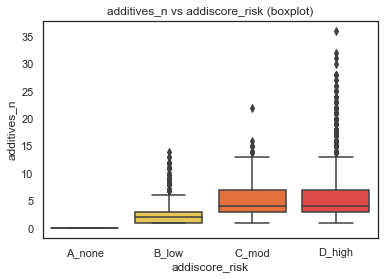

In [180]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='additives_n', 
palette=addiscore_palette, order=addiscore_order)
plt.title('additives_n vs addiscore_risk (boxplot)')
to_png()

"addiscore_vs_addiscore_risk_(boxplot).png"


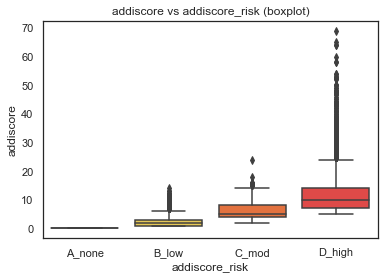

In [181]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='addiscore', 
palette=addiscore_palette, order=addiscore_order)
plt.title('addiscore vs addiscore_risk (boxplot)')
to_png()

## 6.3 Nutriscore par addiscore_risk
### 6.3.1 Nutriscore pare addiscore risk (box-plots) 

- Box-plot groupé par catégorie (avec tests statistiques)


"nutriscore_vs_addiscore_risk_boxplot.png"


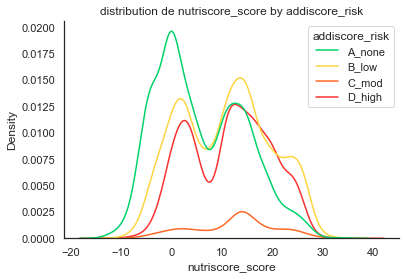

In [182]:
def plot_kde(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = list(palette.keys())
    order.sort()
    g = sns.kdeplot(data=df, x=y_var, hue=groups_var,
                    palette=palette, hue_order=order)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()


cleaned_data.pipe(plot_kde, groups_var='addiscore_risk',
                  y_var='nutriscore_score')
to_png('nutriscore_vs_addiscore_risk_boxplot')


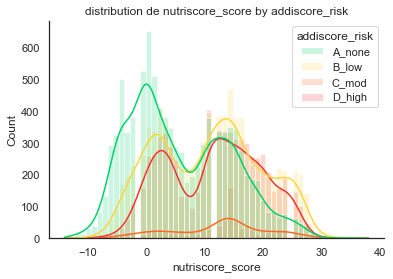

In [183]:
def plot_hist(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = None
    if palette:
        order = list(palette.keys())
        order.sort()
    categories = df[groups_var].value_counts(ascending=False)
    categories = categories[categories.values > 20].index
    if len(categories) > 12:
        categories = categories[:12]
    _, ax1 = plt.subplots()
    # for categ in categories:
    #     data=df[df[groups_var]==categ]
    #     if len(data) > 20:
    g = sns.histplot(data=df, x=y_var, hue=groups_var,
                     ax=ax1,
                     hue_order=order,
                     palette=palette,
                     alpha=0.2,
                     # binwidth=2,
                     # binrange=(-20,30),
                     kde=True)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()

    # to_png(f'distribution_nutriscore_par_{categ_col}_kdeplot')


cleaned_data.pipe(plot_hist, groups_var='addiscore_risk',
                  y_var='nutriscore_score')


Kolmogorov-Smirnov [A_none] : stat=0.579, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.785, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.848, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.845, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [9675, 9053, 962, 6995]
Levene homoscédasticité : stat=48.505, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2264.716, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot.png"


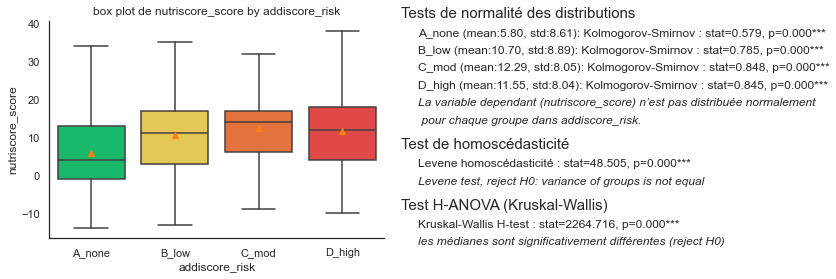

In [184]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=False)
to_png('nutriscore_vs_addiscore_risk_boxplot')


Kolmogorov-Smirnov [A_none] : stat=0.579, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.785, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.848, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.845, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [9675, 9053, 962, 6995]
Levene homoscédasticité : stat=48.505, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2264.716, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot_with_fliers.png"


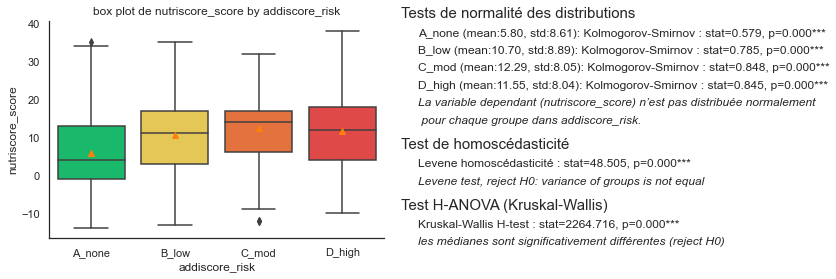

In [185]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=True)
to_png('nutriscore_vs_addiscore_risk_boxplot_with fliers')

Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.547, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.654, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [4203, 3516, 5729, 8164, 5073]
Levene homoscédasticité : stat=288.242, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2392.781, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot.png"


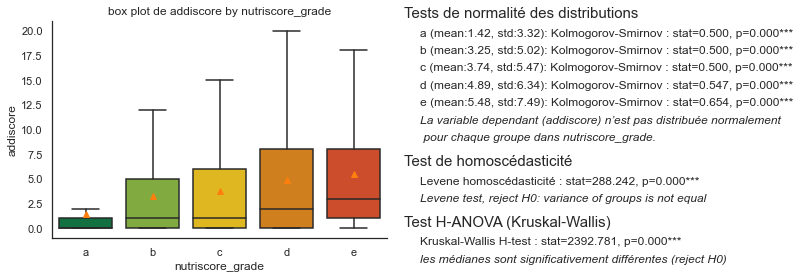

In [186]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=False)
to_png('addiscore_risk_vs_nutriscore_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.547, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.654, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [4203, 3516, 5729, 8164, 5073]
Levene homoscédasticité : stat=288.242, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2392.781, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot_with_fliers.png"


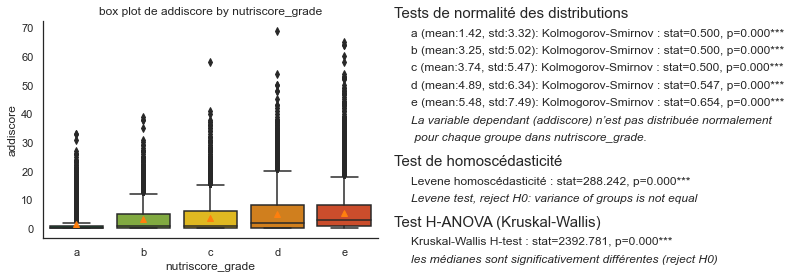

In [187]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=True)
to_png('addiscore_risk_vs_nutriscore_boxplot_with_fliers')

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.841, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.887, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.893, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [9675, 9053, 962, 6995]
Levene homoscédasticité : stat=3355.001, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=21779.204, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_risk_boxplot.png"


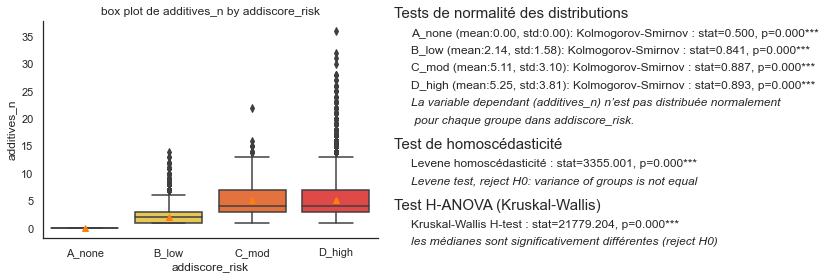

In [188]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='additives_n', showfliers=True)
to_png('nutriscore_vs_additives_risk_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.547, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.654, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=26685), [4203, 3516, 5729, 8164, 5073]
Levene homoscédasticité : stat=314.466, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=2501.565, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_n_boxplot_nofliers.png"


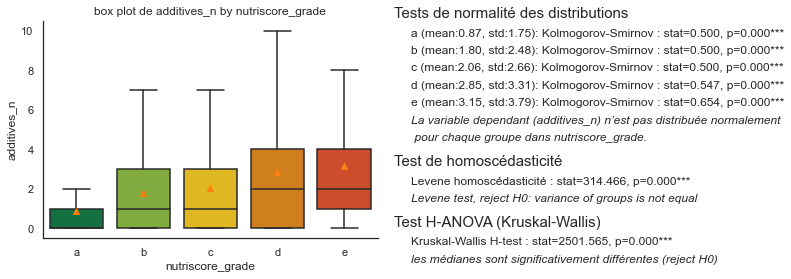

In [189]:
cleaned_data.pipe(plot_box_groupby, groups_var='nutriscore_grade',
                  y_var='additives_n', showfliers=False)
to_png('nutriscore_vs_additives_n_boxplot_nofliers')

### 6.3.2 Test ANOVA 1-way avec tests de normalité et homoscédasticité


Kolmogorov-Smirnov [A_none] : stat=0.600, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.795, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.757, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.852, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9836), [3860, 3397, 145, 2434]
Levene homoscédasticité : stat=8.515, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=660.255, p=0.000***
les médianes sont significativement différentes (reject H0)
"anova_nutriscore_score_by_addiscore_risk_box_plot.png"


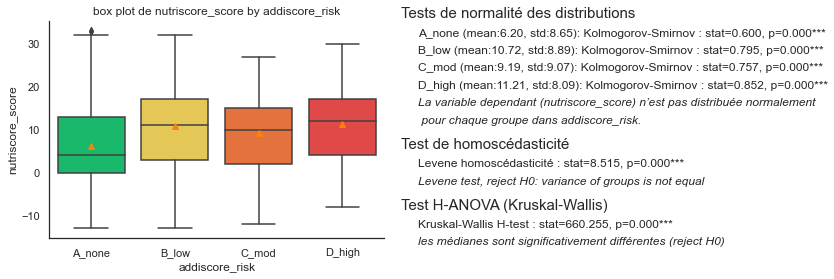

"anova_nutriscore_score_by_addiscore_risk_hist_plot.png"


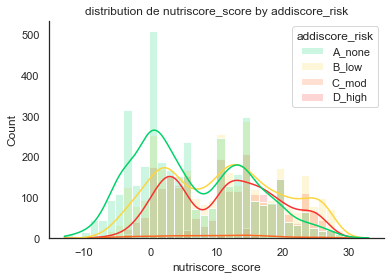

               nutriscore_score                       
                          count   mean   std      skew
addiscore_risk                                        
A_none                     3860   6.20  8.65  3.82e-01
B_low                      3397  10.72  8.89  9.97e-02
C_mod                       145   9.19  9.07 -8.19e-03
D_high                     2434  11.21  8.09  7.89e-02

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.600, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.795, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.757, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.852, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (nutriscore_score) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=8.515, p=0.000***
Levene test, reject H0

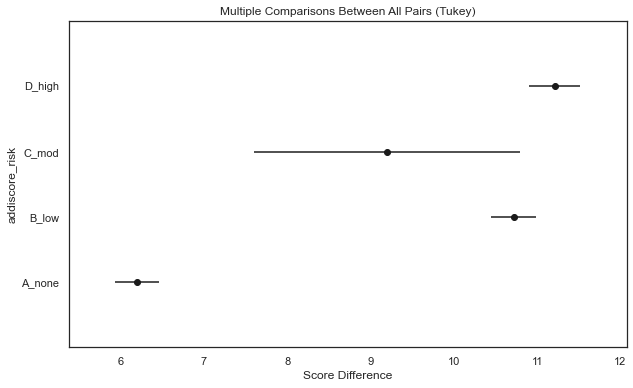

In [190]:

def test_anova(df:pd.DataFrame, y_var, groups_var):
    """test means of outcome variable (y_var), grouped by independent categorical variable (groups_var)"""
    data = df[[groups_var, y_var]].dropna()
    # affiche un plot des groupes
    plot_box_groupby(data, y_var, groups_var)
    to_png(f'anova_{y_var}_by_{groups_var}_box_plot')
    plt.show()

    # affiche une distribution des groupes
    plot_hist(data, groups_var, y_var)
    to_png(f'anova_{y_var}_by_{groups_var}_hist_plot')
    plt.show()

    # affiche une table descriptive :
    stats_df = (df[[groups_var, y_var]]
                .groupby(groups_var).agg(['count', 'mean', 'std', 'skew']))
    print(stats_df)

    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))

    print('\nTests de normalité des distributions')
    normality = True
    for grp in groups:
        p, ch, choix = test_normality(grp)
        if p < 0.05:
            normality = False
    print(f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} "
          + f"distribuée normalement pour chaque groupe dans {groups_var}.")

    print('\nTest de homoscédasticité')
    if normality:
        stat, p, ch, choix = test_bartlett(groups)
    else:
        stat, p, ch, choix = test_levene(groups)
    alpha = 0.05
    homoscedascity = p > alpha

    if normality and homoscedascity:
        print('\nF statistic')
        # stats f_oneway functions takes the groups as input and returns ANOVA F and p value
        fvalue, p = f_oneway(*groups)
        print(f'F value = {fvalue:.4f}, p value ={p:.4f}')
        alpha = 0.05
        if p > alpha:
            print('Same distributions (fail to reject H0)')
        else:
            print('Different distributions (reject H0)')
            print('Detail ANOVA tables')
            anova_df = anova_table_r(data, groups_var, y_var)

    else:
        print('\nNon parametric ANOVA using Kruskal-Wallis H-test')
        # H-statistic (Kruskal Wallis Non-parametric ANOVA)
        p, ch, choix = test_kruskal(groups)

    if p < alpha:
        print('Il y a évidence que les distributions ne sont tous les mêmes')
        plot_pairwise_tukey(data, groups_var, y_var)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(test_anova, groups_var='addiscore_risk', y_var='nutriscore_score')
 )


['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']
Kolmogorov-Smirnov [A_none] : stat=0.984, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3850, 3397, 145, 2432]
Levene homoscédasticité : stat=68.564, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=32.974, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.984, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probablement pas 

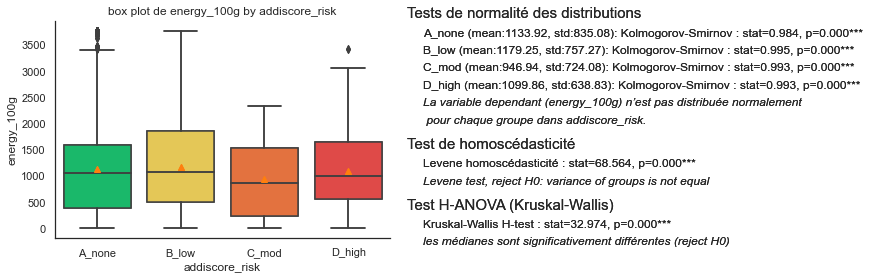

"anova_energy_100g_by_addiscore_risk_hist_plot.png"


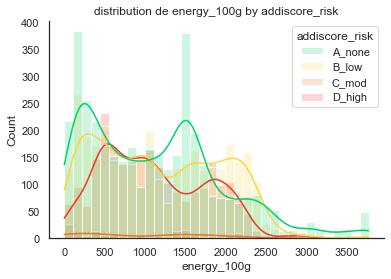

               energy_100g                       
                     count     mean     std  skew
addiscore_risk                                   
A_none                3850  1133.92  835.08  0.74
B_low                 3397  1179.25  757.27  0.24
C_mod                  145   946.94  724.08  0.23
D_high                2432  1099.86  638.83  0.39

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.984, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.995, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.993, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (energy_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=68.564, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non 

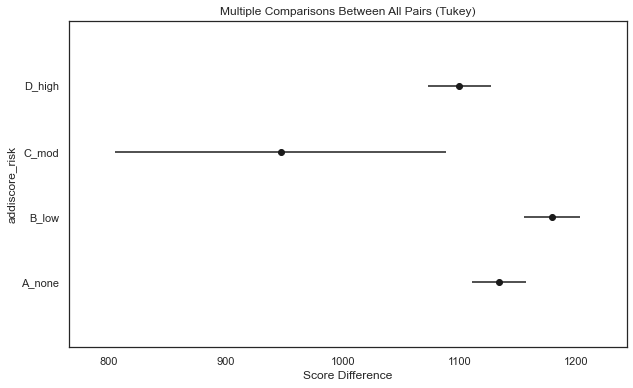

Kolmogorov-Smirnov [A_none] : stat=0.653, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.671, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.835, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3850, 3397, 145, 2432]
Levene homoscédasticité : stat=46.322, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=155.549, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.653, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.671, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.835, p=0.000*** : reject H0: probablement pas Gaussi

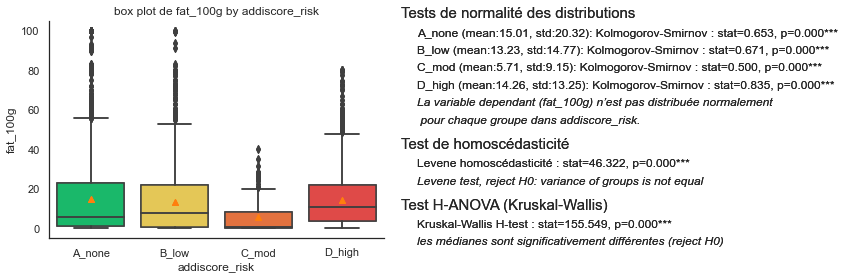

"anova_fat_100g_by_addiscore_risk_hist_plot.png"


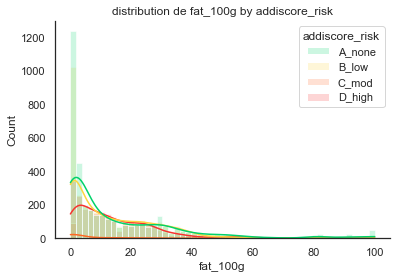

               fat_100g                    
                  count   mean    std  skew
addiscore_risk                             
A_none             3850  15.01  20.32  2.10
B_low              3397  13.23  14.77  1.61
C_mod               145   5.71   9.15  1.72
D_high             2432  14.26  13.25  1.55

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.653, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.671, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.835, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=46.322, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-test


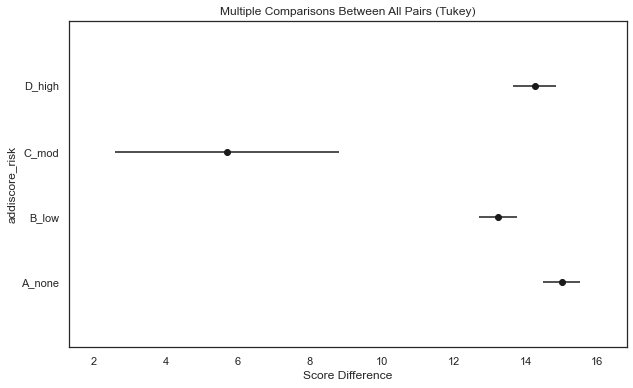

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.502, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.628, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3850, 3397, 145, 2432]
Levene homoscédasticité : stat=15.862, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=197.794, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.502, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.628, p=0.000*** : reject H0: probablement pas Gaussi

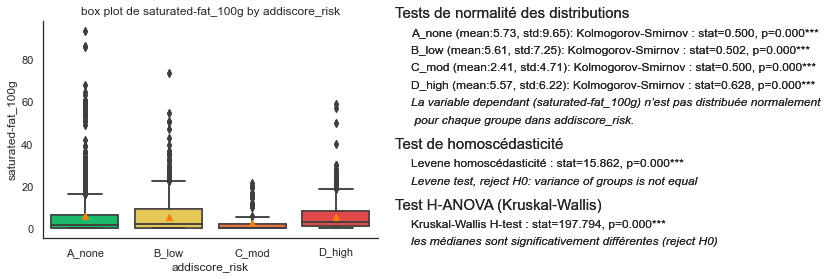

"anova_saturated-fat_100g_by_addiscore_risk_hist_plot.png"


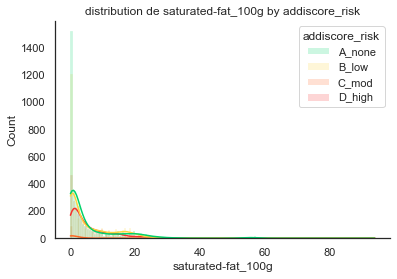

               saturated-fat_100g                  
                            count  mean   std  skew
addiscore_risk                                     
A_none                       3850  5.73  9.65  3.08
B_low                        3397  5.61  7.25  1.75
C_mod                         145  2.41  4.71  2.44
D_high                       2432  5.57  6.22  1.92

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.502, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.628, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (saturated-fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=15.862, p=0.000***
Levene test, reject H0: variance of grou

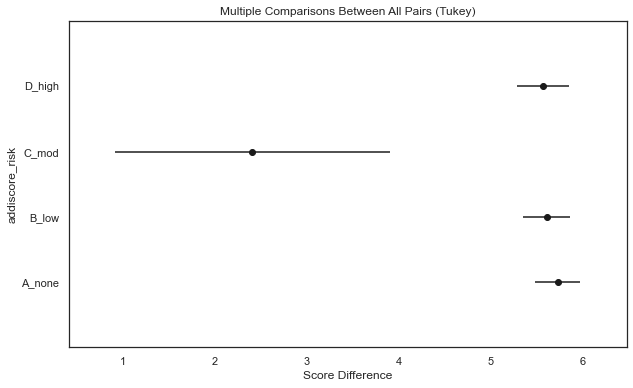

Kolmogorov-Smirnov [A_none] : stat=0.731, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.887, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.934, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.771, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9819), [3847, 3397, 145, 2430]
Levene homoscédasticité : stat=55.314, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=430.460, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.731, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.887, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.934, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.771, p=0.000*** : reject H0: probablement pas Gaussi

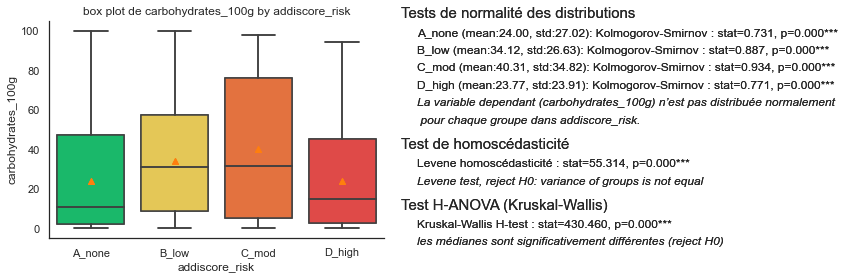

"anova_carbohydrates_100g_by_addiscore_risk_hist_plot.png"


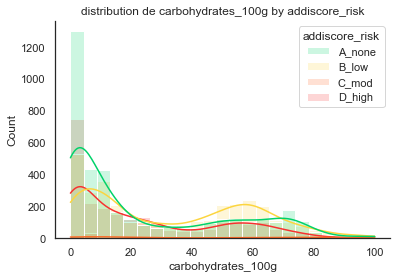

               carbohydrates_100g                    
                            count   mean    std  skew
addiscore_risk                                       
A_none                       3847  24.00  27.02  0.93
B_low                        3397  34.12  26.63  0.30
C_mod                         145  40.31  34.82  0.25
D_high                       2430  23.77  23.91  0.81

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.731, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.887, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.934, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.771, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (carbohydrates_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=55.314, p=0.000***
Levene test, reject H0: va

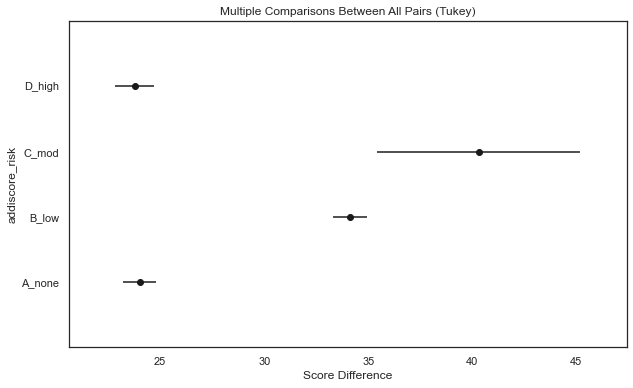

Kolmogorov-Smirnov [A_none] : stat=0.537, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.761, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.725, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.603, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3850, 3397, 145, 2432]
Levene homoscédasticité : stat=198.838, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=821.737, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.537, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.761, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.725, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.603, p=0.000*** : reject H0: probablement pas Gauss

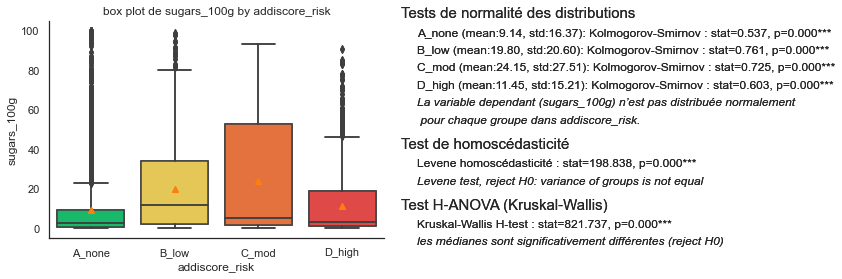

"anova_sugars_100g_by_addiscore_risk_hist_plot.png"


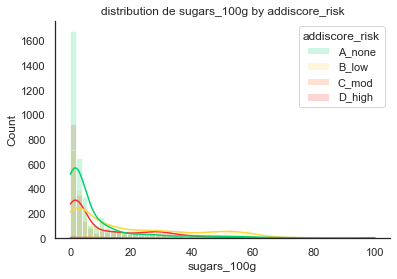

               sugars_100g                    
                     count   mean    std  skew
addiscore_risk                                
A_none                3850   9.14  16.37  2.83
B_low                 3397  19.80  20.60  0.97
C_mod                  145  24.15  27.51  0.71
D_high                2432  11.45  15.21  1.74

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.537, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.761, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.725, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.603, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sugars_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=198.838, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA usi

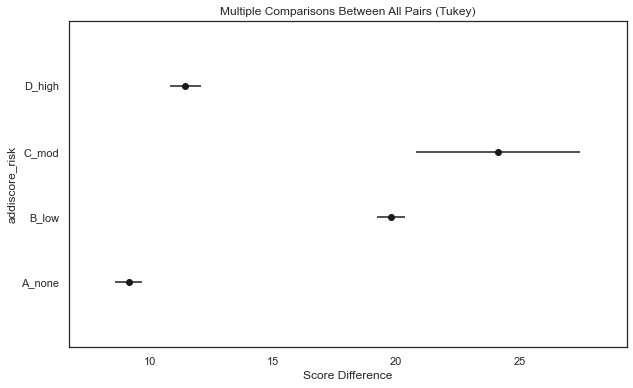

Kolmogorov-Smirnov [A_none] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.520, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=5353), [2155, 1947, 75, 1176]
Levene homoscédasticité : stat=42.639, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=87.688, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.520, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian

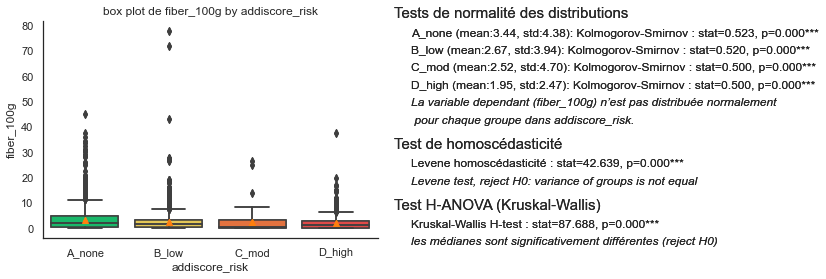

"anova_fiber_100g_by_addiscore_risk_hist_plot.png"


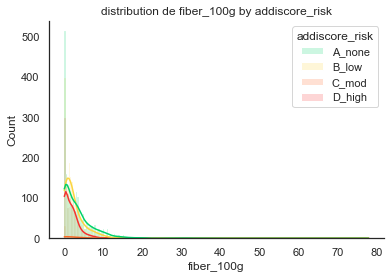

               fiber_100g                  
                    count  mean   std  skew
addiscore_risk                             
A_none               2155  3.44  4.38  3.00
B_low                1947  2.67  3.94  8.18
C_mod                  75  2.52  4.70  3.63
D_high               1176  1.95  2.47  4.51

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.523, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.520, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fiber_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=42.639, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-tes

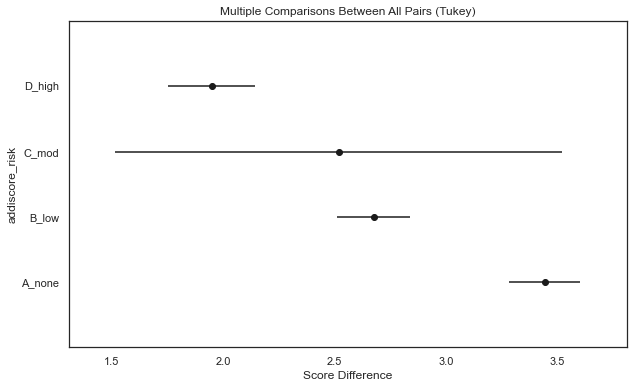

Kolmogorov-Smirnov [A_none] : stat=0.720, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.668, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.837, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3850, 3397, 145, 2432]
Levene homoscédasticité : stat=81.110, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=366.740, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.720, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.668, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.837, p=0.000*** : reject H0: probablement pas Gaussi

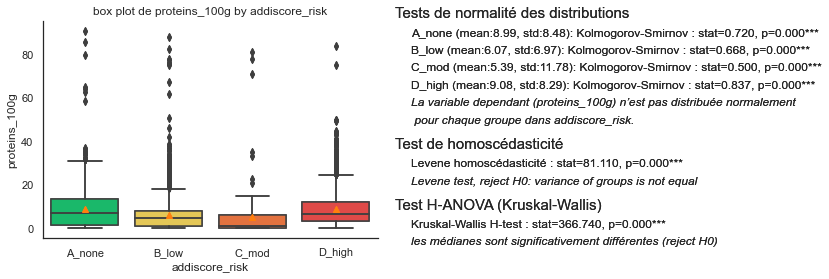

"anova_proteins_100g_by_addiscore_risk_hist_plot.png"


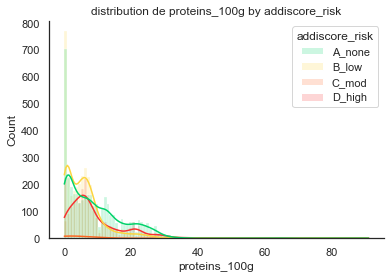

               proteins_100g                   
                       count  mean    std  skew
addiscore_risk                                 
A_none                  3850  8.99   8.48  1.54
B_low                   3397  6.07   6.97  3.91
C_mod                    145  5.39  11.78  4.93
D_high                  2432  9.08   8.29  1.86

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.720, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.668, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.837, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (proteins_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=81.110, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric A

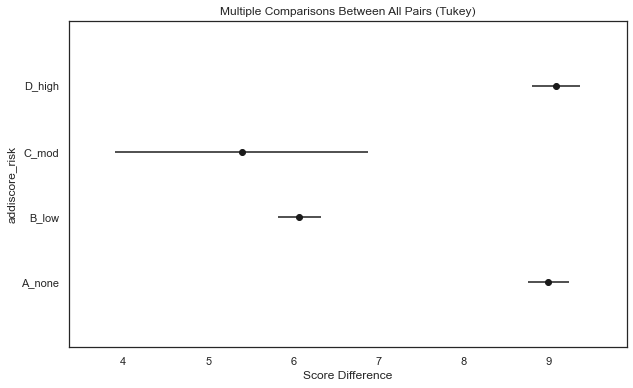

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9827), [3853, 3397, 145, 2432]
Levene homoscédasticité : stat=12.605, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=644.392, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussi

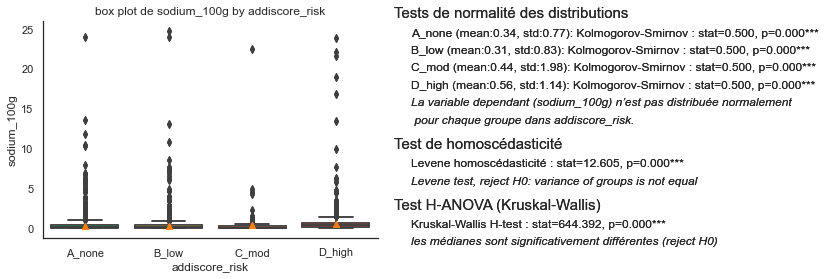

"anova_sodium_100g_by_addiscore_risk_hist_plot.png"


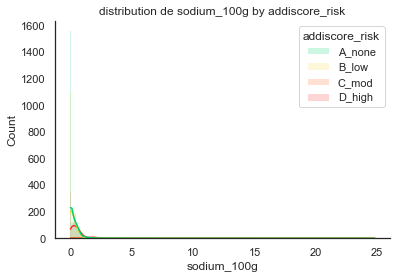

               sodium_100g                   
                     count  mean   std   skew
addiscore_risk                               
A_none                3853  0.34  0.77  12.98
B_low                 3397  0.31  0.83  18.10
C_mod                  145  0.44  1.98   9.95
D_high                2432  0.56  1.14  13.27

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sodium_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=12.605, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Krusk

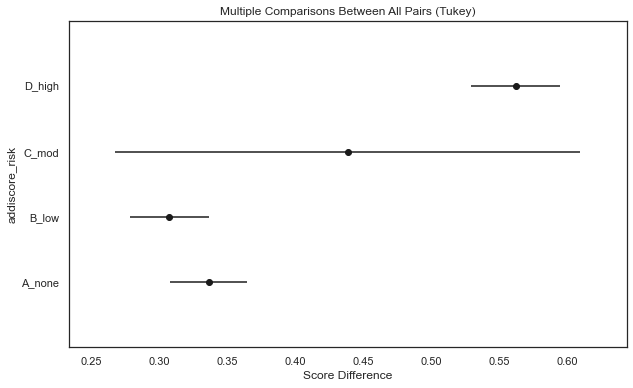

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=9824), [3848, 3397, 145, 2434]
Levene homoscédasticité : stat=102.091, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=116.871, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gauss

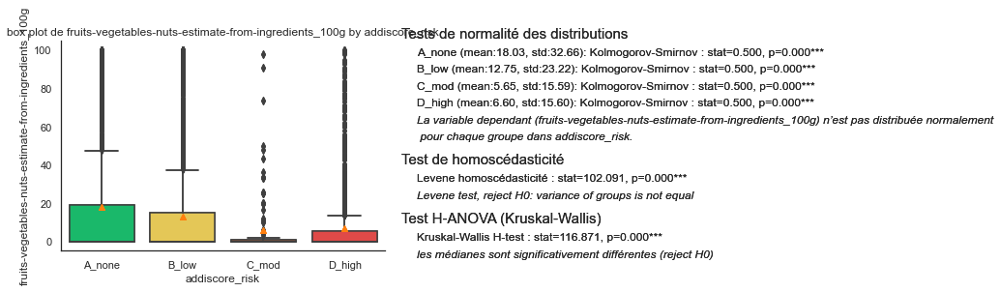

"anova_fruits-vegetables-nuts-estimate-from-ingredients_100g_by_addiscore_risk_hist_plot.png"


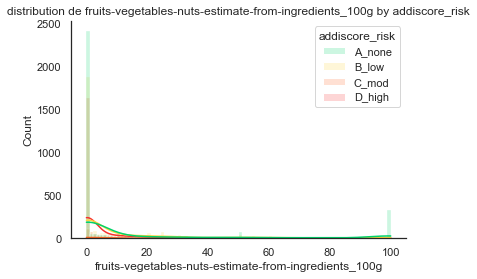

               fruits-vegetables-nuts-estimate-from-ingredients_100g         \
                                                               count   mean   
addiscore_risk                                                                
A_none                                                          3848  18.03   
B_low                                                           3397  12.75   
C_mod                                                            145   5.65   
D_high                                                          2434   6.60   

                             
                  std  skew  
addiscore_risk               
A_none          32.66  1.71  
B_low           23.22  2.21  
C_mod           15.59  3.82  
D_high          15.60  3.39  

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smir

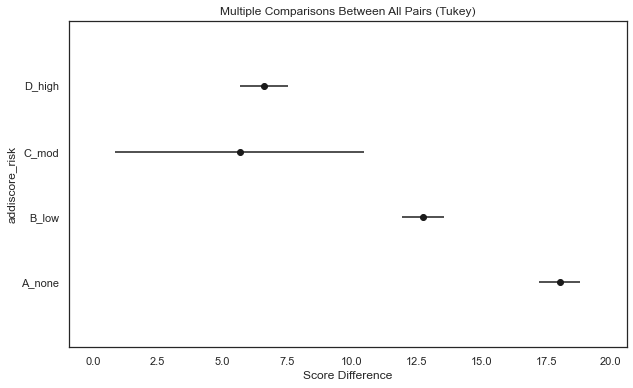

In [191]:
def stats_vars_nutritionnelles(df:pd.DataFrame):
    yvars = cols_in_df(cleaned_data, ['energy_100g', 'fat_100g',
                                      'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                      'proteins_100g', 'sodium_100g',
                                      'fruits-vegetables-nuts-estimate-from-ingredients_100g'])
    print(yvars)
    for yvar in yvars:
        plot_box_groupby(df, groups_var='addiscore_risk', y_var=yvar, showstats=True)
        test_anova(df, groups_var='addiscore_risk', y_var=yvar)


(cleaned_data
 .pipe(filter_by_country, 'France')
#  .sample(10000, random_state=1)
 .pipe(stats_vars_nutritionnelles)
 )

## 6.4 NOVA groupes par addiscore risk

### 6.4.1 Moyennes par NOVA groupe (descriptive)


In [192]:
cleaned_data.groupby('nova_group').agg('mean')


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
nova_group,,,,,,,,,,,,,,,,,
1,0.08,0.0,0.0,-0.61,908.98,7.18,1.44,29.91,7.22,4.77,8.07,0.10,31.83,7.11e-04,7.82e-03,0.07,0.11
2,0.03,0.0,0.0,12.21,2840.04,66.00,21.45,19.64,16.66,2.02,3.71,0.26,25.26,0.00e+00,0.00e+00,0.03,0.03
3,0.39,0.01,0.01,8.03,1115.35,15.15,5.51,22.70,8.41,3.31,9.86,0.59,9.92,4.66e-04,8.47e-02,0.30,0.73
4,3.4,0.03,0.13,11.21,1185.07,13.17,5.28,34.12,17.48,2.31,7.24,0.48,5.15,1.35e-01,5.98e-01,2.67,5.93


### Fréquence des groupees de ADDISCORE risk par NOVA groupe


In [193]:
def crosstab_normalize(df:pd.DataFrame, index_col='pnns_groups_2', groups_col='nutriscore_score', normalize='index',
                       sortbygroup=None):
    ct = (pd.crosstab(
        df[index_col], df[groups_col],
        normalize=normalize, margins=True) * 100
          )
    if not sortbygroup is None:
        ct = ct.sort_values(by=sortbygroup, ascending=False)
    return ct


# pd.crosstab(cleaned_data['nova_group'],cleaned_data['addiscore_risk'],normalize=True, margins=True)*100


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(crosstab_normalize, index_col='nova_group', groups_col='addiscore_risk', normalize=True)
 )


addiscore_risk,A_none,B_low,C_mod,D_high,All
nova_group,,,,,
1,9.99,0.61,0.01,0.10,10.72
2,1.51,0.02,0.00,0.00,1.54
3,18.95,4.21,0.01,1.97,25.14
4,8.78,29.70,1.45,22.67,62.61
All,39.24,34.54,1.47,24.75,100.00


## 6.5 PNNS groups par addiscore_risk

### 6.5.1 Quel sont les groupes PNNS avec les plus grandes proportions d'additifs de risques élevés ?

#### 6.5.1.1 Fréquence des groupes de ADDISCORE risk par PNNS groupe 1


In [194]:
# (pd.crosstab(cleaned_data['pnns_groups_1'],cleaned_data['addiscore_risk'],normalize='index', margins=True)*100).style.background_gradient()

ct_pnns1_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_1', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns1_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_1,,,,
Fish Meat Eggs,37.99,13.80,0.28,47.93
Composite foods,28.50,32.82,0.77,37.91
Salty snacks,47.93,24.54,1.00,26.53
All,39.07,34.42,1.40,25.12
Milk and dairy products,48.00,27.45,0.17,24.38
Sugary snacks,17.52,56.44,2.48,23.56
Fat and sauces,42.60,35.38,1.44,20.58
Beverages,43.46,35.35,3.87,17.31
Cereals and potatoes,61.90,26.98,0.77,10.35


### 6.5.2 Groupes PNNS 2 avec les plus grandes proportions d'additifs de risques élevés ?


In [195]:
ct_pnns2_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_2', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns2_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_2,,,,
Sandwiches,6.59,15.38,1.10,76.92
Processed meat,16.29,8.35,0.00,75.36
Artificially sweetened beverages,0.89,30.36,19.64,49.11
Pizza pies and quiches,23.58,27.64,0.00,48.78
Meat,33.18,18.18,0.45,48.18
Dairy desserts,27.32,25.26,0.00,47.42
Potatoes,28.07,24.56,1.75,45.61
Biscuits and cakes,11.02,46.12,0.31,42.55
Ice cream,5.33,56.80,0.59,37.28


In [196]:
# alternatif
# ct=(pd.crosstab(
#         cleaned_data['pnns_groups_2'],cleaned_data['addiscore_risk'],
#         normalize='index', margins=True)*100
#     ).sort_values(by='D_high', ascending=False)

# sns.clustermap(data=ct)


### Bar plot - valeurs d'une colonne dans une table sommaire

- pas count
- pas groupby

- possibilité de limité la nombre de valeurs
- possibilité de trier par valeur
- possibilité de normalizer (effectif ⇨ fréquence)


<AxesSubplot:xlabel='pnns_groups_1'>

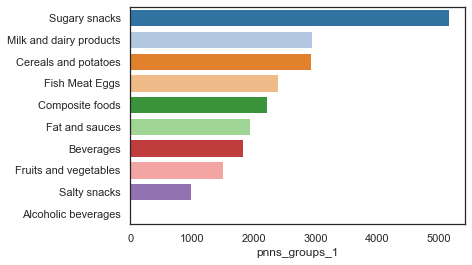

In [197]:
data = cleaned_data['pnns_groups_1'].value_counts().to_frame('pnns_groups_1')
sns.barplot(y=data.index, x=data['pnns_groups_1'])


"Top_10_catégories_avec_additifs_de_risque_élevés(France)_barplot.png"


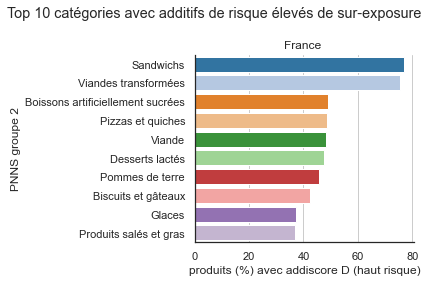

In [198]:
def plot_bar(df:pd.DataFrame, col, nb=20, others=False, normalize=False, sort_values=False, palette=None,
             xlabel=None, ylabel=None, titre='', soustitre='', traductions=False):
    other_count = 0
    data = df[[col]]
    # print(data.columns.to_list())

    if nb < len(data):
        data = data.head(nb)
    if others:
        filter_other = data[col] == 'other'
        # other_count = data[filter_other][col].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data.index, x=data[col] * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=data.index, x=data[col], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        autres = f' [Autres valeurs = {other_count}]'
    if xlabel:
        ax.set_xlabel(xlabel)
    if ylabel:
        ax.set_ylabel(ylabel)
    if traductions:
        labels = traduire_categories([item.get_text()
                                      for item in ax.get_yticklabels()])
        ax.set_yticklabels(labels=labels)
    plt.gca().xaxis.grid()
    sns.despine()
    plt.suptitle(titre)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


ct_pnns2_addiscore.pipe(plot_bar, col='D_high', nb=10,
                        traductions=True,
                        xlabel='produits (%) avec addiscore D (haut risque)',
                        ylabel='PNNS groupe 2',
                        titre='Top 10 catégories avec additifs de risque élevés de sur-exposure',
                        soustitre='France'
                        )
to_png('Top 10 catégories avec additifs de risque élevés(France)_barplot')


In [199]:
groupes_a_risque_eleves = ct_pnns2_addiscore.head(10).index
print(groupes_a_risque_eleves)


Index(['Sandwiches', 'Processed meat', 'Artificially sweetened beverages',
       'Pizza pies and quiches', 'Meat', 'Dairy desserts', 'Potatoes',
       'Biscuits and cakes', 'Ice cream', 'Salty and fatty products'],
      dtype='object', name='pnns_groups_2')


### Quel sont les distributions de nutriscore pour ces groupes ?


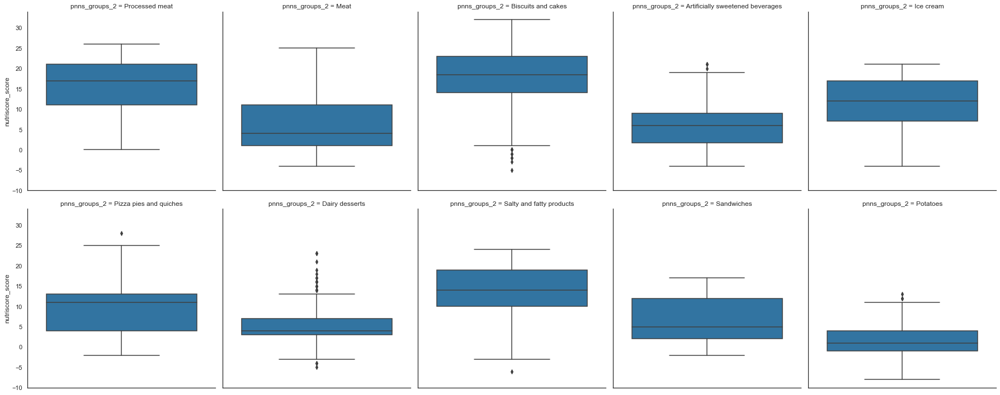

In [200]:
def plot_dist_nutriscore_by_categ(df:pd.DataFrame, categ_col, yvar='nutriscore_score'):
    df = df[[categ_col, yvar]].dropna()
    sns.catplot(data=df, kind='box', col=categ_col, y=yvar, col_wrap=5)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_dist_nutriscore_by_categ, categ_col='pnns_groups_2')
 )


### 6.5.3 Fréquence des additives haut risque

In [201]:
unsafe_additives_df = additives_detail.pipe(get_unsafe_additives)
unsafe_additives = unsafe_additives_df['name'].to_list()
unsafe_additives


['E482 - Calcium stearoyl-2-lactylate',
 'E432 - Polyoxyethylene sorbitan monolaurate',
 'E228 - Potassium bisulphite',
 'E131 - Patent blue v',
 'E407 - Carrageenan',
 'E133 - Brilliant blue FCF',
 'E436 - Polyoxyethylene sorbitan tristearate',
 'E339 - Sodium phosphates',
 'E509 - Calcium chloride',
 'E200 - Sorbic acid',
 'E481 - Sodium stearoyl-2-lactylate',
 'E223 - Sodium metabisulphite',
 'E150c - Ammonia caramel',
 'E251 - Sodium nitrate',
 'E220 - Sulphur dioxide',
 'E202 - Potassium sorbate',
 'E407a - Processed eucheuma seaweed',
 'E451 - Triphosphates',
 'E252 - Potassium nitrate',
 'E155 - Brown ht',
 'E341 - Calcium phosphates',
 'E221 - Sodium sulphite',
 'E211 - Sodium benzoate',
 'E508 - Potassium chloride',
 'E212 - Potassium benzoate',
 'E492 - Sorbitan tristearate',
 'E433 - Polyoxyethylene sorbitan monooleate',
 'E435 - Polyoxyethylene sorbitan monostearate',
 'E338 - Phosphoric acid',
 'E343 - Magnesium phosphates',
 'E511 - Magnesium chloride',
 'E142 - Green s',

"presence_additifs_nocifs_France_bar.png"


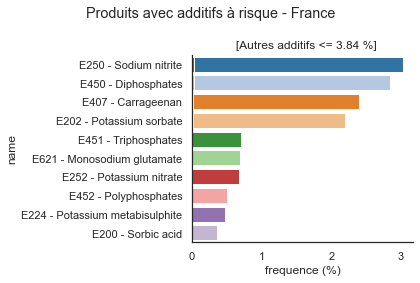

In [202]:
def freq_unsafe_additives(df:pd.DataFrame, filtre=None, normalize=False): 
    """
    Fréquence des additifs nocifs par tags 
    On n'utilise pas colonne additives_en, car certain additifs n'apparait pas
    E450i (Disodium diphosphate) fait partie de E450 - Diphosphates qui sont haut risque
    """
    if filtre is None:
        filtre=unsafe_additives_df['id'].tolist()
    freq = explode_series(df['additives_tags']).value_counts(ascending=False, normalize=normalize)
    freq = freq[freq.index.isin(filtre)]
    freq = freq.to_frame(name='freq').rename_axis('id')
    freq = freq.join(additives_detail[['id','name']].set_index('id'), how='inner').set_index('name')
    return freq['freq']


def plot_unsafe_additives(df:pd.DataFrame, normalize=True, titre='', soustitre='', ylabel=None, nb=19, palette=None): 
    freq_unsafe = freq_unsafe_additives(df, normalize=normalize)
    others_sum = 0
    if len(freq_unsafe) > nb:
        others = freq_unsafe[nb:]
        # print(others)
        others_sum = others.values.sum()
        freq_unsafe = freq_unsafe[:nb]
        # freq_unsafe['autres']=others_sum

    if normalize:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values, palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others_sum > 0:
        if normalize:
            others_sum = f'{others_sum * 100:.2f} %'
        autres = f' [Autres additifs <= {others_sum}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()
    sns.barplot(y=freq_unsafe.index, x=freq_unsafe.values)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - France')
 )
to_png('presence_additifs_nocifs_France_bar')


"presence_additifs_nocifs_USA_bar.png"


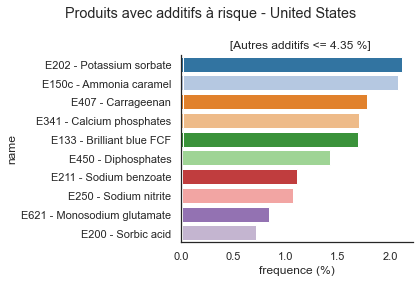

In [203]:
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - United States')
 )
to_png('presence_additifs_nocifs_USA_bar')


"presence_additifs_nocifs_France_NOVA_3_bar.png"


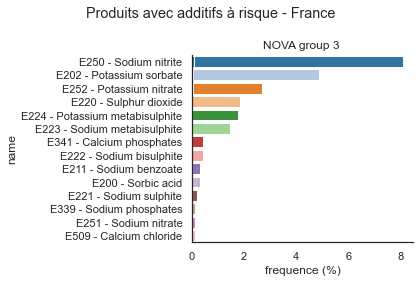

In [204]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='NOVA group 3')
 )
to_png('presence_additifs_nocifs_France_NOVA_3_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


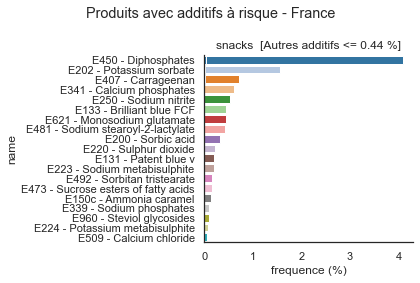

In [205]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_1', 'snacks')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


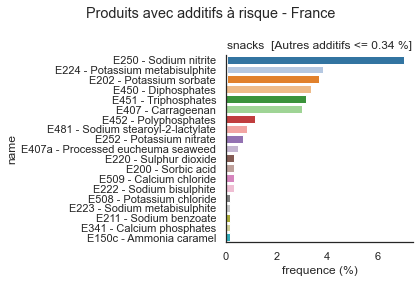

In [206]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'sandwiches')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


In [207]:
cleaned_data['pnns_groups_2'].unique()


array(['Breakfast cereals', nan, 'Sweetened beverages', 'One-dish meals',
       'Sweets', 'Bread', 'Cereals', 'Chocolate products',
       'Fish and seafood', 'Pizza pies and quiches', 'Vegetables',
       'Biscuits and cakes', 'Processed meat', 'Nuts', 'Cheese', 'Meat',
       'Fats', 'Milk and yogurt', 'Unsweetened beverages',
       'Artificially sweetened beverages', 'Salty and fatty products',
       'Potatoes', 'Dressings and sauces', 'Appetizers', 'Ice cream',
       'Legumes', 'Soups', 'Dried fruits', 'Fruit juices',
       'Dairy desserts', 'Waters and flavored waters', 'Fruits',
       'Plant-based milk substitutes', 'Pastries', 'Sandwiches', 'Eggs',
       'Offals', 'Fruit nectars', 'Teas and herbal teas and coffees',
       'Alcoholic beverages'], dtype=object)

"presence_additifs_nocifs_France_processed_meat_bar.png"


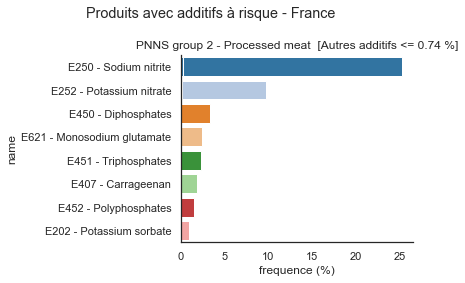

In [208]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(plot_unsafe_additives, nb=8,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Processed meat')
 )
to_png('presence_additifs_nocifs_France_processed_meat_bar')


"presence_additifs_nocifs_France_sandwiches_bar.png"


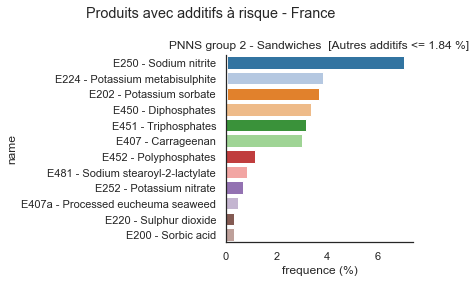

In [209]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Sandwiches')
 .pipe(plot_unsafe_additives, nb=12,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Sandwiches')
 )
to_png('presence_additifs_nocifs_France_sandwiches_bar')


In [210]:
# TODO:
# - cols mod risk (count), haut risk (count), addiscore (grade)
# - get dummies
# - heatmap pnns_groups_1 pnns_groups_2 count for each column


###  Trouve des 'bons' et 'mauvais' produits dans des groupes PNNS 2 de risque élevés


"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


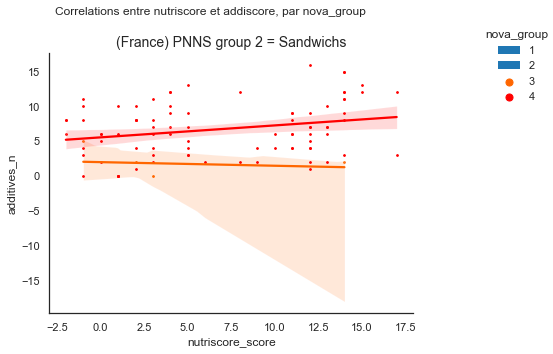

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


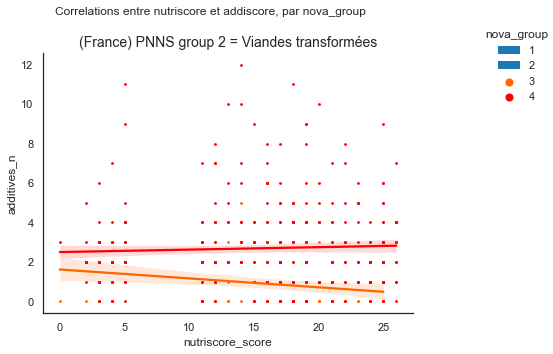

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


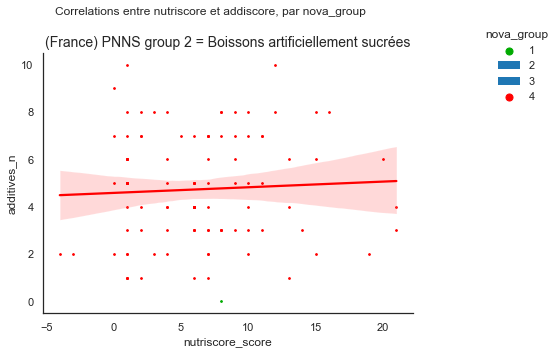

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


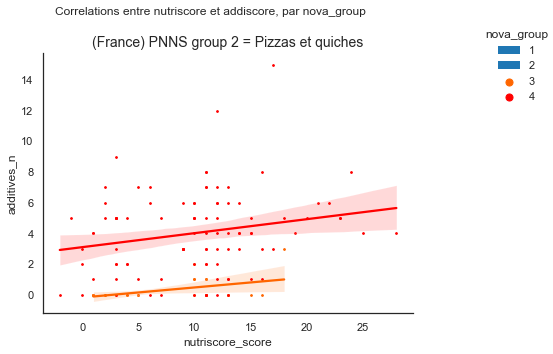

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


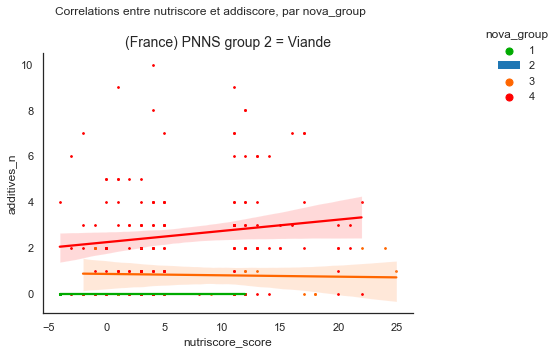

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


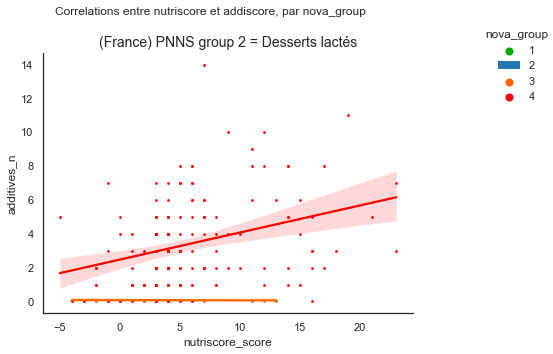

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


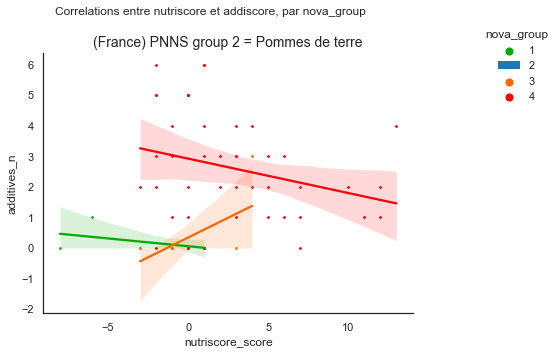

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


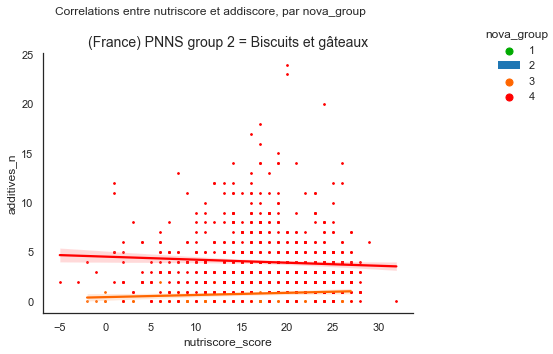

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


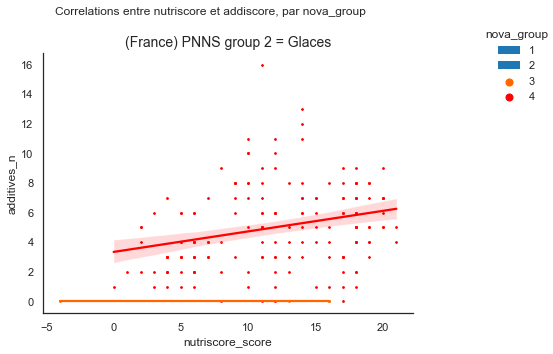

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


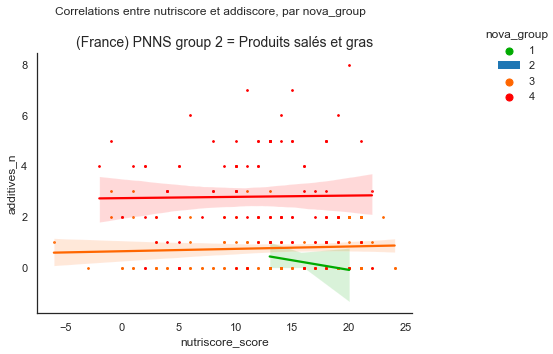

In [211]:
def get_produits_by_pnns_group_2(df:pd.DataFrame, pnns_2_group='Processed meat', nova_group=None):
    return (df
            .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=[pnns_2_group])
            # .pipe(filter_by_nova_group,nova_group)
            )


def plot_produits_par_pnns_group(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df.pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(plot_reg, hue='nova_group')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nova_group', size=12)
        plt.title(f'(France) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nutriscore_vs_addiscore_hue_nova_group_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group)
 )

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


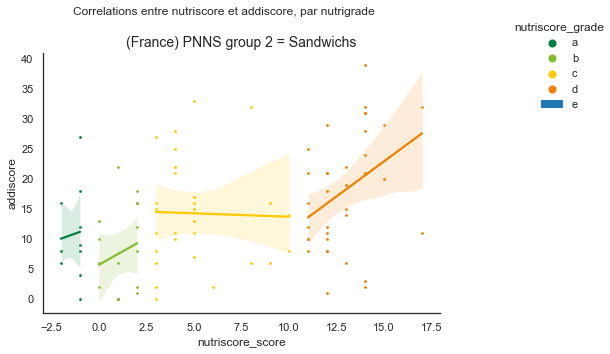

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


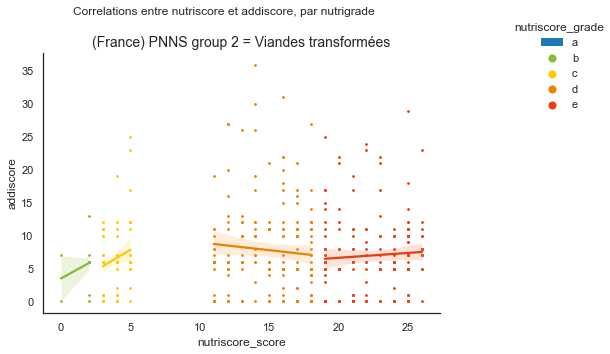

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


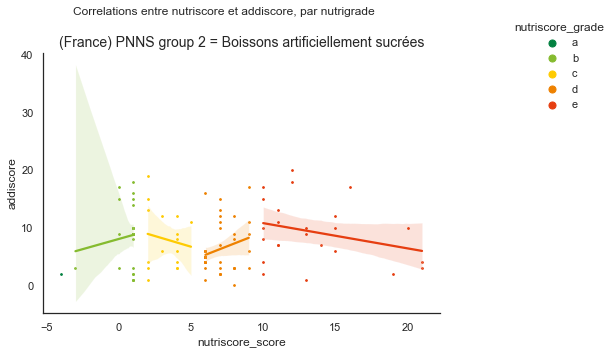

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


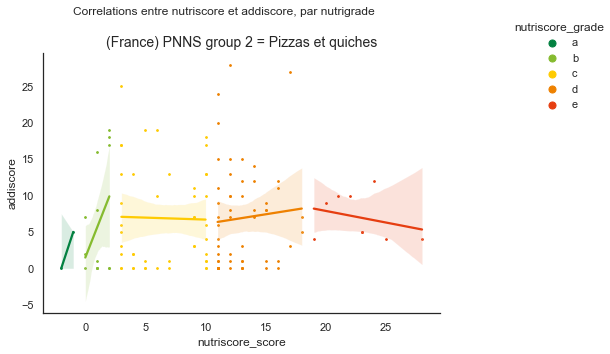

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


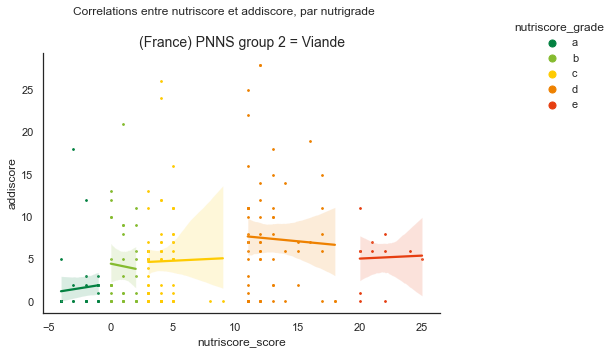

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


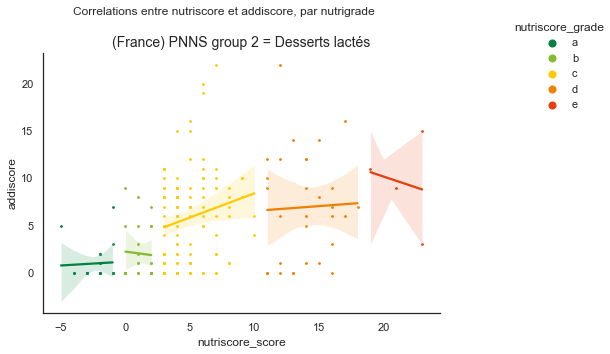

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


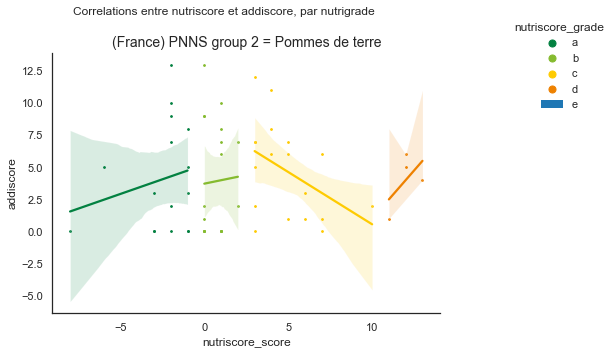

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


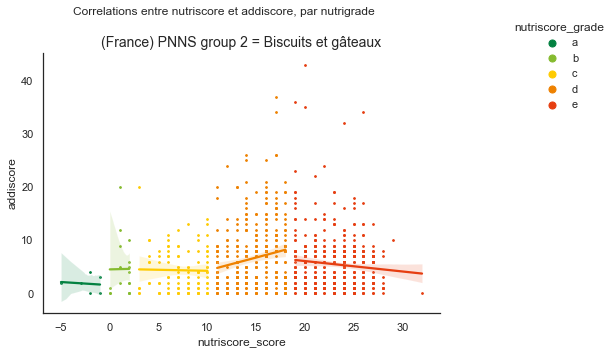

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


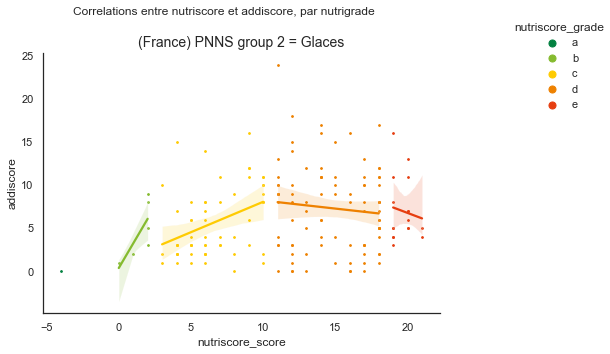

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


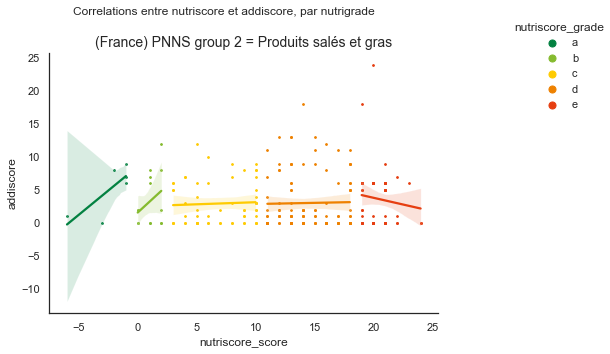

In [212]:
def plot_produits_par_pnns_group2(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df
         .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(plot_reg, y_var='addiscore', hue='nutriscore_grade')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nutrigrade', size=12)
        plt.title(f'(France) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group2)
 )

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


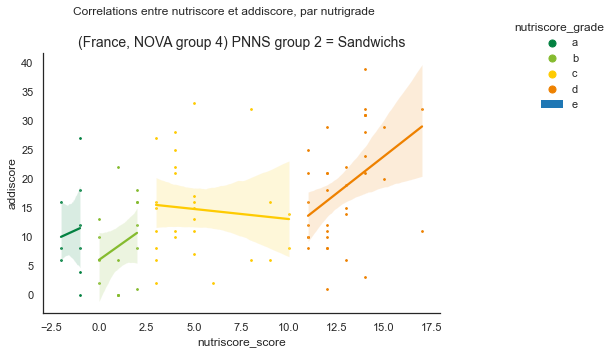

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


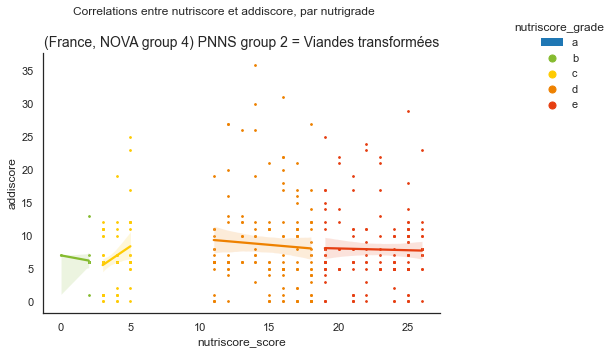

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


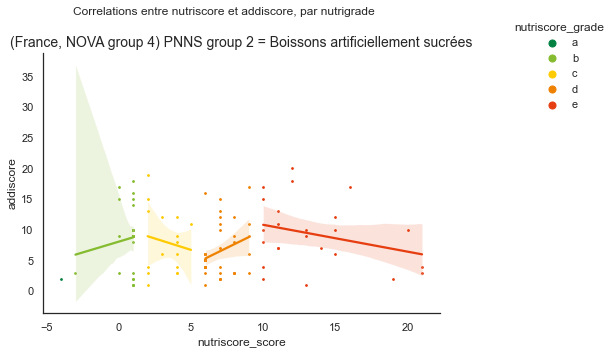

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


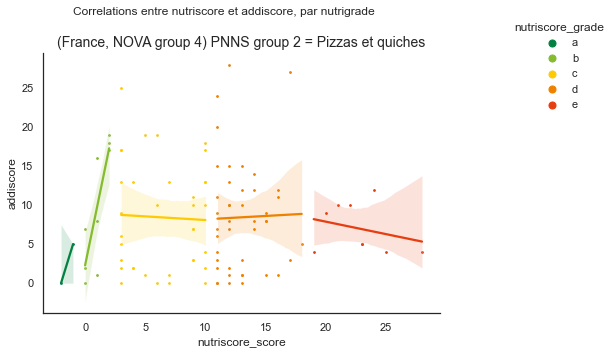

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


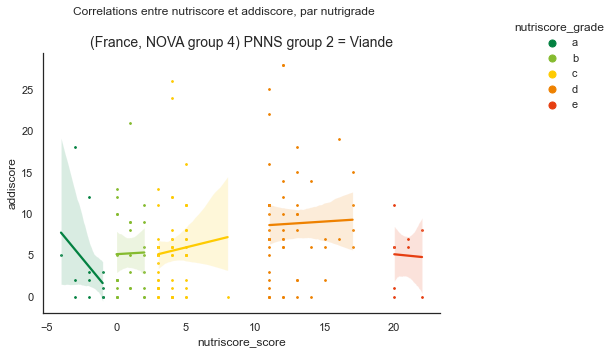

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


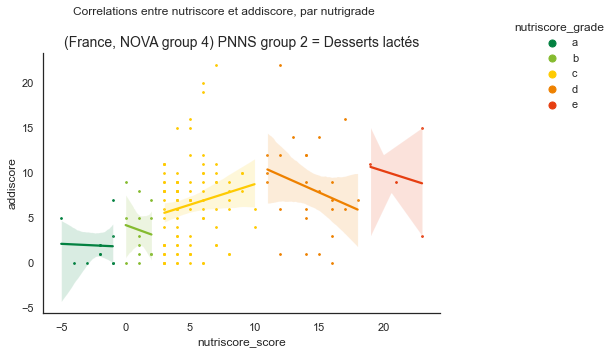

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


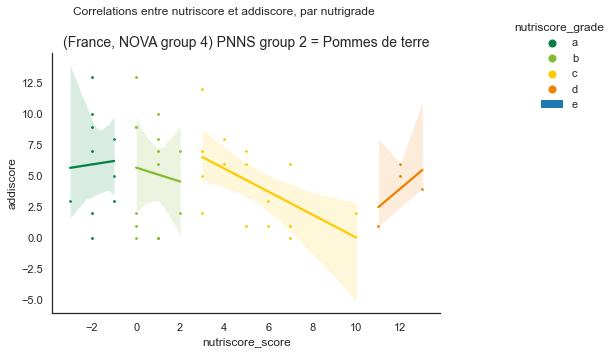

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


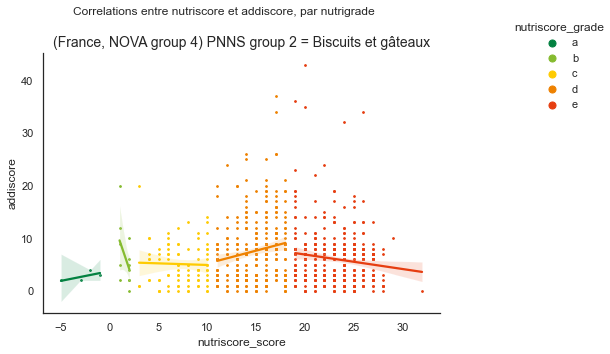

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


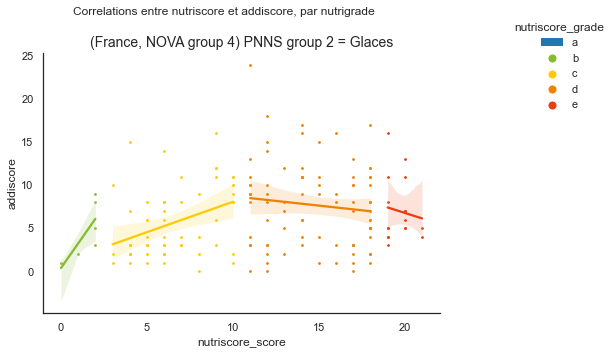

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


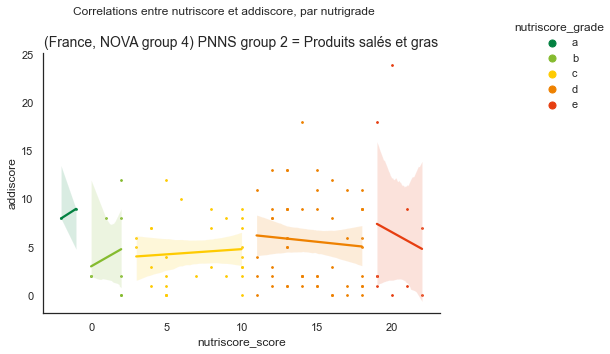

In [213]:
def plot_produits_par_pnns_group3(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df
         .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(filter_by_nova_group, 4)
         .pipe(plot_reg, y_var='addiscore', hue='nutriscore_grade')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nutrigrade', size=12)
        plt.title(f'(France, NOVA group 4) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group3)
 )

In [214]:
def top_produits_by_addiscore_rank(df:pd.DataFrame, pnns_2_group='Processed meat', nb=10):
    data = (df
            .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=[pnns_2_group])
            .pipe(filter_by_nova_group, 4)
            .dropna(subset=['addiscore'])
            .sort_values(by='addiscore')
            )
    nb = min(nb, len(data))
    return data.head(nb)


produits = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(top_produits_by_addiscore_rank, nb=1000000)
            .pipe(filter_by_tag, 'addiscore_risk', 'A_none')
            .sort_values(by='nutriscore_score')
            )
produits[['product_name', 'brands_tags', 'nutriscore_grade', 'addiscore', 'addiscore_risk']].head(5)

,product_name,brands_tags,nutriscore_grade,addiscore,addiscore_risk
76789,Lot 2 x 4 tranches blanc de poulet doré au four 400 g,fleury-michon,c,0.0,A_none
99519,8 Mini Saucisses de Volaille à la Basquaise,picard,c,0.0,A_none
46763,Mon Jambon Supérieur Label Rouge & responsable,madrange,c,0.0,A_none
32221,Mon Jambon Supérieur à l'étouffée 2tr,madrange,c,0.0,A_none
82697,Le jambon de chez nous anti-gaspi,nous-anti-gaspi,c,0.0,A_none


### Produit quadrants pour les produits avec risques élevés

- TODO

Get produits pour chaque catégorie :
- high_nutriscore, high_addiscore
- high_nutriscore, low_addiscore
- low_nutriscore, high_addiscore
- low_nutriscore, low_addiscore

### Fréquence des groupes de ADDISCORE risque par NUTRISCORE grade


In [215]:
(pd.crosstab(cleaned_data['nutriscore_grade'], cleaned_data['addiscore_risk'],
             normalize='index', margins=True) * 100).style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
nutriscore_grade,,,,
a,64.07,24.77,1.64,9.52
b,43.17,30.60,2.39,23.83
c,36.87,33.83,2.39,26.92
d,29.40,34.08,5.71,30.82
e,18.77,43.68,4.06,33.49
All,36.26,33.93,3.61,26.21


In [216]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    # piv = ret.pivot_table(columns=[col],values=['unsafe'], aggfunc=['count','mean'])
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.11,2814
2,0.03,306
3,0.73,6444
4,5.93,17121


In [217]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


Index(['nova_group', 'addiscore'], dtype='object')
nova_group : {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
            mean  count
nova_group             
1           0.12   1054
2           0.01    151
3           0.71   2473
4           4.97   6158


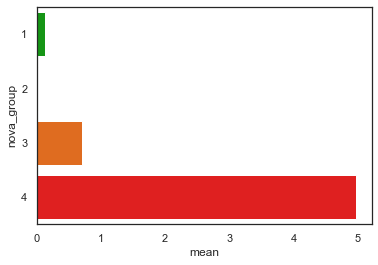

In [218]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nova_group')
 .pipe(plot_hbar_mean_count, categ='nova_group')
 )


Index(['nutriscore_grade', 'addiscore'], dtype='object')
nutriscore_grade : {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
                  mean  count
nutriscore_grade             
a                 1.29   1460
b                 2.75   1389
c                 3.34   2220
d                 4.16   2881
e                 3.91   1886


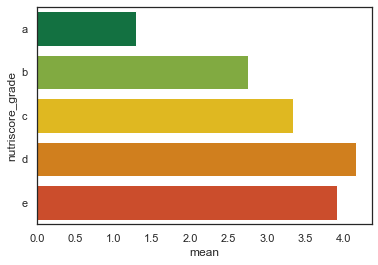

In [219]:
add_data = (cleaned_data
            .pipe(filter_by_country, 'France'))

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nutriscore_grade')
 .pipe(plot_hbar_mean_count, categ='nutriscore_grade')
 )


In [220]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,5.53,1042
Fish Meat Eggs,4.73,1087
Sugary snacks,4.06,2135
Milk and dairy products,3.02,1202
Salty snacks,2.66,603
Beverages,2.50,826
Fat and sauces,2.49,554
Cereals and potatoes,1.53,1034
Fruits and vegetables,1.12,657


In [221]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False)


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Sandwiches,14.16,91
Artificially sweetened beverages,7.66,112
Processed meat,7.12,491
Pizza pies and quiches,6.76,123
Ice cream,6.59,169
...,...,...
Nuts,0.34,74
Waters and flavored waters,0.22,37
Fruit juices,0.21,151


In [222]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10)


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.30,9835
Switzerland,2.42,397
Germany,2.40,365
Belgium,3.74,346
Spain,3.56,301
United States,4.11,185
United Kingdom,3.45,153
Italy,2.12,141
Netherlands,2.41,61


In [223]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                   
                         count unique                   top  freq
nutriscore_grade                                                 
a                         3656      9  Cereals and potatoes  1241
b                         2944      9       Composite foods   600
c                         4453      9       Composite foods   713
d                         6428     10         Sugary snacks  1995
e                         4402      9         Sugary snacks  2480

In [224]:
cleaned_data.groupby('nova_group').describe().T


nova_group               1       2        3         4
additives_n count  2814.00  306.00  6444.00  17121.00
            mean      0.08    0.03     0.39      3.40
            std       0.32    0.18     0.75      3.33
            min       0.00    0.00     0.00      0.00
            25%       0.00    0.00     0.00      1.00
...                    ...     ...      ...       ...
addiscore   min       0.00    0.00     0.00      0.00
            25%       0.00    0.00     0.00      1.00
            50%       0.00    0.00     0.00      4.00
            75%       0.00    0.00     1.00      8.00
            max      10.00    1.00    20.00     69.00

[136 rows x 4 columns]

In [225]:
pd.set_option('display.max_rows', 10)


## 6.6 Analyse temporelle d'addiscore risk

### 6.6.1 Est-ce que le pourcentage de produits de haut risque a baissé pendant le temps ?


#### 6.6.1.1 Fréquence de groupes d'addiscore risque par an (Etats Unis)


"Distribution_addiscore_par_année_(united_states).png"


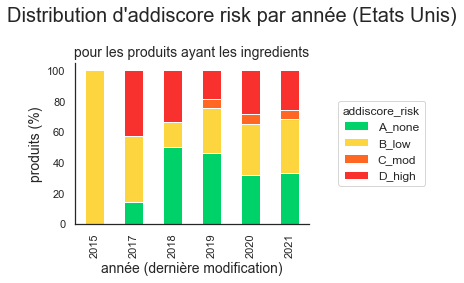

In [226]:
(cleaned_data
 .pipe(filter_by_country, 'united states')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (Etats Unis)",
       soustitre='pour les produits ayant les ingredients')
 )
to_png('Distribution_addiscore_par_année_(united states)')


#### 6.6.1.2 Fréquence de groupes d'addiscore risque par an (France)


"Distribution_addiscore_par_année_(France).png"


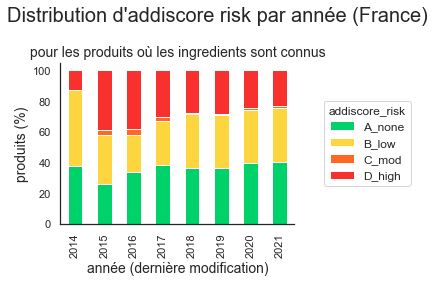

In [227]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits où les ingredients sont connus')
 )
to_png('Distribution_addiscore_par_année_(France)')


#### 6.6.1.3 Fréquence des groupes addiscore pour le nova_score categories 3 et 4


"Distribution_addiscore_NOVA_4_par_année_(France).png"


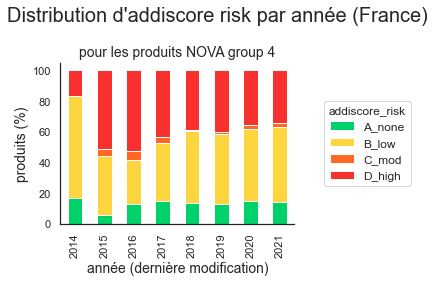

In [228]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '4')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 4')
 )
to_png('Distribution_addiscore_NOVA_4_par_année_(France)')


"Distribution_addiscore_NOVA_3_par_année_(France).png"


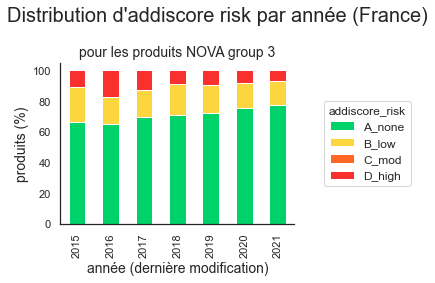

In [229]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 3')
 )
to_png('Distribution_addiscore_NOVA_3_par_année_(France)')


#### 6.6.1.4 ➡️ Les pourcentages d'addiscore reste assez stable entre les années

- pour tester, il faut faire un test **chi-square** sur la table des frequences
  (qualitative-qualitative) - pas encore fait


### 6.6.2 Est-ce que le moyenne nombre d'additifs a changé au cours des années, pour chaque groupe  ?


"additifs_par_produit_-_Nutriscore_(France).png"


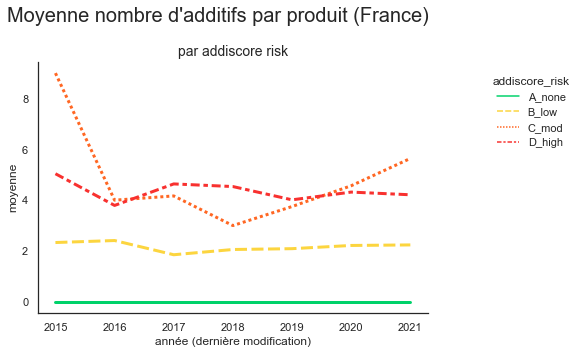

In [230]:
def plot_column_mean_by_addiscore_risk(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='addiscore_risk',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    relplot = True
    if relplot:
        g = sns.relplot(data=data, kind="line",
                        palette=addiscore_palette, linewidth=3)
        leg = g._legend
        leg.set_title('addiscore_risk')
        # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.3, 0.8])
        leg._loc = 1  # upper right
    else:
        # matplotlib
        ax = data.plot(kind='line', color=addiscore_palette.values())
        plt.legend(title=f'addiscore risk',
                   bbox_to_anchor=(1.5, 0.5), loc="upper right", fontsize=12,
                   bbox_transform=plt.gcf().transFigure)
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    sns.despine()
    plt.suptitle(titre, size=20)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_addiscore_risk,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par addiscore risk'
       )
 )
to_png("additifs par produit - Nutriscore (France)")


---

# 7. Clustering des additifs
- correlations entre des additifs 
- voir la répartition de chaque additif (group) entre les groupes de produits plus à risque
- voir si on peut recommander au producteurs de remplacer avec des additifs similaires mais moins risqué

## 7.1 Correlation entre les additifs de risque modéré et haut


In [231]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    # piv = ret.pivot_table(columns=[col],values=['unsafe'], aggfunc=['count','mean'])
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.11,2814
2,0.03,306
3,0.73,6444
4,5.93,17121


In [232]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


Index(['nova_group', 'addiscore'], dtype='object')
nova_group : {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
            mean  count
nova_group             
1           0.12   1054
2           0.01    151
3           0.71   2473
4           4.97   6158


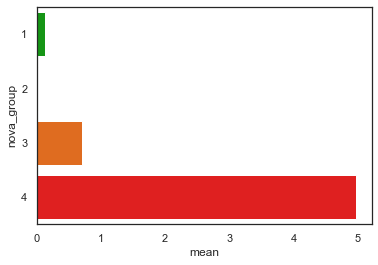

In [233]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nova_group')
 .pipe(plot_hbar_mean_count, categ='nova_group')
 )


Index(['nutriscore_grade', 'addiscore'], dtype='object')
nutriscore_grade : {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
                  mean  count
nutriscore_grade             
a                 1.29   1460
b                 2.75   1389
c                 3.34   2220
d                 4.16   2881
e                 3.91   1886


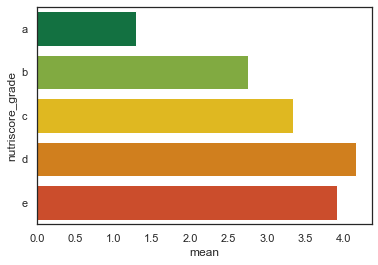

In [234]:
add_data = (cleaned_data
            .pipe(filter_by_country, 'France'))

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nutriscore_grade')
 .pipe(plot_hbar_mean_count, categ='nutriscore_grade')
 )


In [235]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,5.53,1042
Fish Meat Eggs,4.73,1087
Sugary snacks,4.06,2135
Milk and dairy products,3.02,1202
Salty snacks,2.66,603
Beverages,2.50,826
Fat and sauces,2.49,554
Cereals and potatoes,1.53,1034
Fruits and vegetables,1.12,657


In [236]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False)


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Sandwiches,14.16,91
Artificially sweetened beverages,7.66,112
Processed meat,7.12,491
Pizza pies and quiches,6.76,123
Ice cream,6.59,169
...,...,...
Nuts,0.34,74
Waters and flavored waters,0.22,37
Fruit juices,0.21,151


In [237]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10)


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.30,9835
Switzerland,2.42,397
Germany,2.40,365
Belgium,3.74,346
Spain,3.56,301
United States,4.11,185
United Kingdom,3.45,153
Italy,2.12,141
Netherlands,2.41,61


In [238]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                   
                         count unique                   top  freq
nutriscore_grade                                                 
a                         3656      9  Cereals and potatoes  1241
b                         2944      9       Composite foods   600
c                         4453      9       Composite foods   713
d                         6428     10         Sugary snacks  1995
e                         4402      9         Sugary snacks  2480

In [239]:
cleaned_data.groupby('nova_group').describe().T


nova_group               1       2        3         4
additives_n count  2814.00  306.00  6444.00  17121.00
            mean      0.08    0.03     0.39      3.40
            std       0.32    0.18     0.75      3.33
            min       0.00    0.00     0.00      0.00
            25%       0.00    0.00     0.00      1.00
...                    ...     ...      ...       ...
addiscore   min       0.00    0.00     0.00      0.00
            25%       0.00    0.00     0.00      1.00
            50%       0.00    0.00     0.00      4.00
            75%       0.00    0.00     1.00      8.00
            max      10.00    1.00    20.00     69.00

[136 rows x 4 columns]

In [240]:
cleaned_data.groupby('pnns_groups_1').describe().T


pnns_groups_1      Alcoholic beverages  Beverages  Cereals and potatoes  \
additives_n count                  2.0    1830.00               2923.00   
            mean                   0.0       1.85                  1.49   
            std                    0.0       2.14                  2.46   
            min                    0.0       0.00                  0.00   
            25%                    0.0       0.00                  0.00   
...                                ...        ...                   ...   
addiscore   min                    0.0       0.00                  0.00   
            25%                    0.0       0.00                  0.00   
            50%                    0.0       1.00                  0.00   
            75%                    0.0       5.00                  2.00   
            max                    0.0      25.00                 37.00   

pnns_groups_1      Composite foods  Fat and sauces  Fish Meat Eggs  \
additives_n count          2207.00         1939.00         2388.00   
            mean              2.92            1.72            1.87   
            std               3.39            2.19            2.18   
            min               0.00            0.00            0.00   
            25%               0.00            0.00            0.00   
...                            ...             ...             ...   
addiscore   min               0.00            0.00            0.00   
            25%               0.00            0.00            0.00   
            50%               2.00            1.00            4.00   
            75%               9.00            4.00            8.00   
            max              69.00           34.00           38.00   

pnns_groups_1      Fruits and vegetables  Milk and dairy products  \
additives_n count                1511.00                  2935.00   
            mean                    0.64                     1.87   
            std                     1.20                     2.41   
            min                     0.00                     0.00   
            25%                     0.00                     0.00   
...                                  ...                      ...   
addiscore   min                     0.00                     0.00   
            25%                     0.00                     0.00   
            50%                     0.00                     1.00   
            75%                     1.00                     5.00   
            max                    26.00                    31.00   

pnns_groups_1      Salty snacks  Sugary snacks  
additives_n count        990.00        5158.00  
            mean           1.55           3.75  
            std            2.16           4.16  
            min            0.00           0.00  
            25%            0.00           1.00  
...                         ...            ...  
addiscore   min            0.00           0.00  
            25%            0.00           1.00  
            50%            1.00           3.00  
            75%            5.00           8.00  
            max           28.00          65.00  

[136 rows x 10 columns]

In [241]:
pd.set_option('display.max_rows', 10)


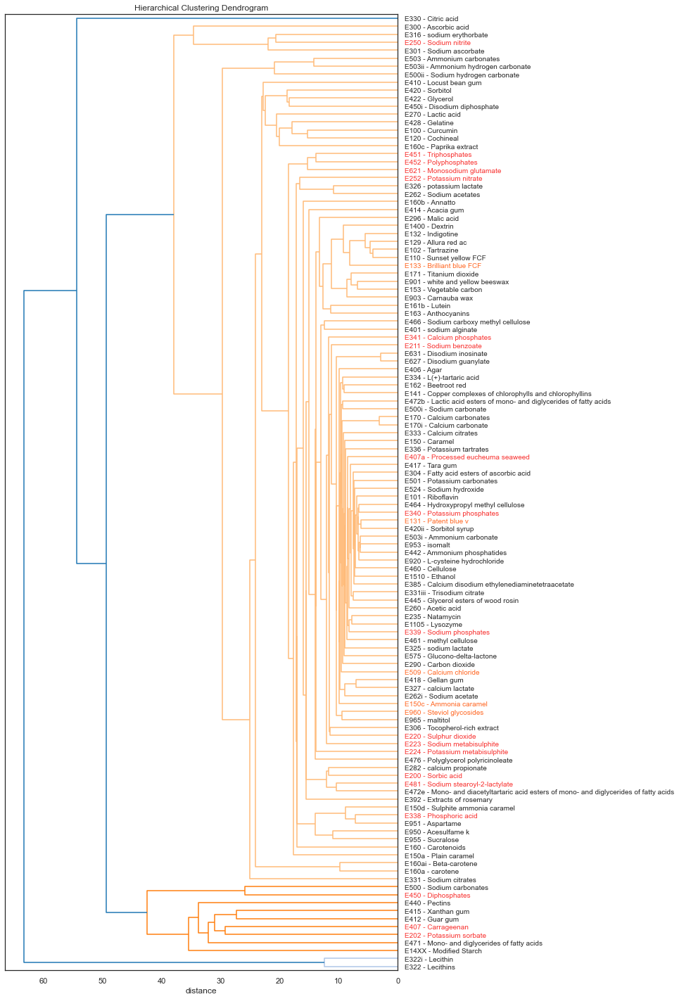

In [242]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, min_count=20)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram,
       mod_risk_tags=mod_risk_additives['id'].to_list(),
       high_risk_tags=high_risk_additives['id'].to_list(),
       fontsize=10)
 )


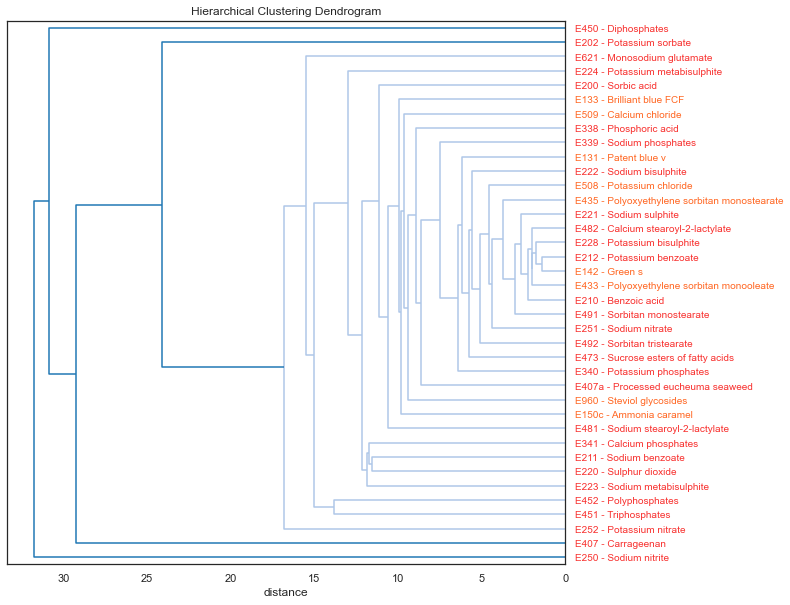

In [243]:
unsafe=get_unsafe_additives(additives_detail)
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, additives_tags_list=unsafe['id'].to_list(), min_count=20)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram,
       figsize=(10, 10),
       method='complete',
       mod_risk_tags=mod_risk_additives['id'].to_list(),
       high_risk_tags=high_risk_additives['id'].to_list(),
       fontsize=10)
 )


"Top_additifs_red_répresentés_dans_les_produits_avec_ingredients.png"


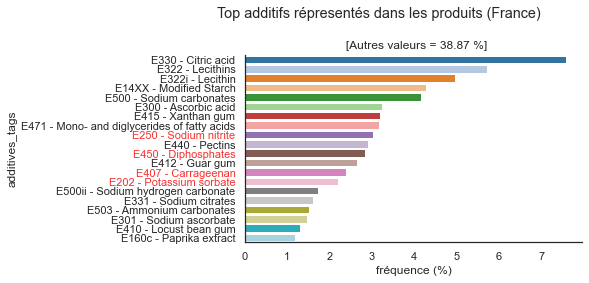

In [244]:
mod_risk_tags = mod_risk_additives['id'].to_list()
high_risk_tags = high_risk_additives['id'].to_list()


def additive_tags_to_labels(ax):
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])
    ax.set_yticklabels(labels=labels)


(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(filter_by_country, 'France')
 .pipe(plot_bar_top_n, col='additives_tags', nb=20,
       titre='Top additifs répresentés dans les produits (France)',
       ylabel='', normalize=True)
 )
additive_tags_to_labels(ax=plt.gca())

to_png('Top additifs red répresentés dans les produits avec ingredients')


<Figure size 1800x1800 with 0 Axes>

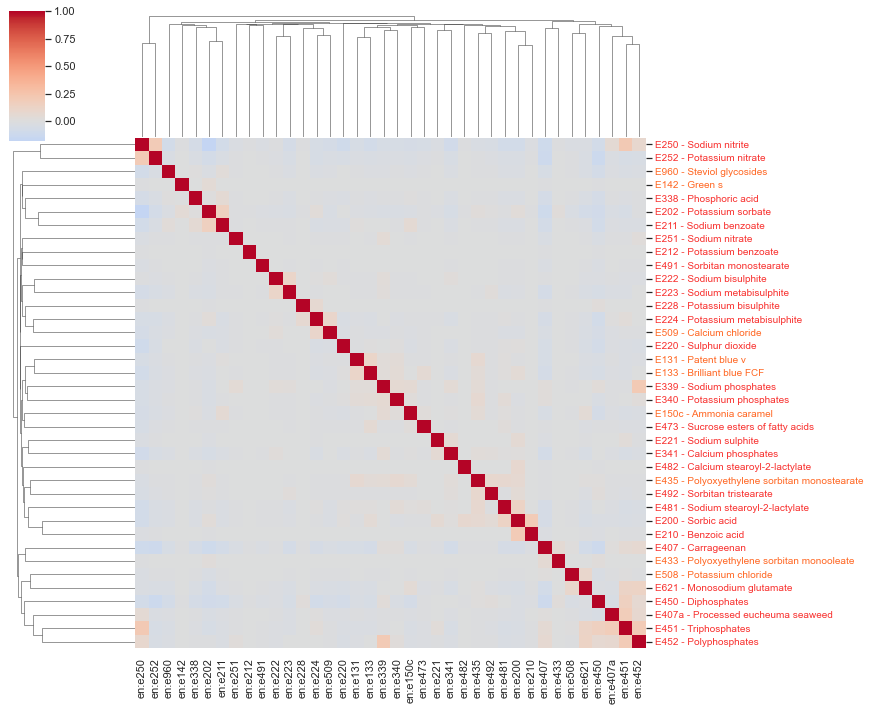

In [245]:
def plot_cluster_map(df:pd.DataFrame, figsize=None, mod_risk_tags=[], high_risk_tags=[], fontsize=10):
    # if df.shape[0]>df.shape[1]:
    #     df=df.T
    if not figsize is None:
        plt.figure(figsize=figsize)
    if df.shape[0] == df.shape[1]:
        g = sns.clustermap(df, cmap='coolwarm', row_cluster=True,
                           col_cluster=True, xticklabels=1, yticklabels=1, center=0)
    else:
        return
        # g=sns.clustermap(df, cmap='coolwarm',row_cluster=False, col_cluster=True, xticklabels=1, yticklabels=1, center=0)
    # labels=df.index
    # orientation = "left")
    w = g.ax_heatmap.axes.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in w:
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red

    labels = get_additive_labels([item.get_text() for item in w])
    full = ''.join(labels)
    if len(full) > 0:
        g.ax_heatmap.axes.set_yticklabels(labels=labels, fontsize=fontsize)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_unsafe_additives_tags, additives_tags_list=unsafe['id'], min_count=20)
 .pipe(crosstab_additives_tags)
 .corr()
 .pipe(plot_cluster_map,
       figsize=(25, 25),
       mod_risk_tags=mod_risk_additives['id'].to_list(),
       high_risk_tags=high_risk_additives['id'].to_list(),
       fontsize=10)
 )


### 1.2.2 Histogram plots - distribution de nutriscores par nova groupe


"distribution_nutriscore_par_nova_group_displot.png"


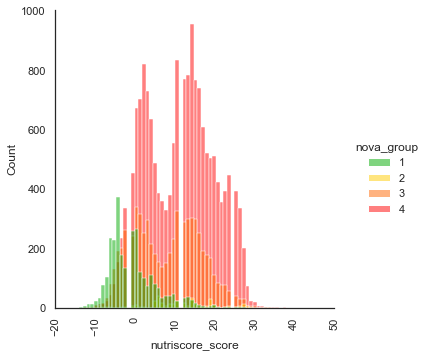

In [246]:
# g=sns.displot(cleaned_data,x='nutriscore_score',hue='nova_group',
# hue_order=nova_order,palette=nova_palette, kind='kde')
g = sns.displot(cleaned_data, x='nutriscore_score', hue='nova_group',
                hue_order=nova_order, palette=nova_palette)
g.set_xticklabels(rotation='vertical')
to_png('distribution_nutriscore_par_nova_group_displot')


"distribution_nutriscore_par_nova_group_et_pnns_facetgrid_displot.png"


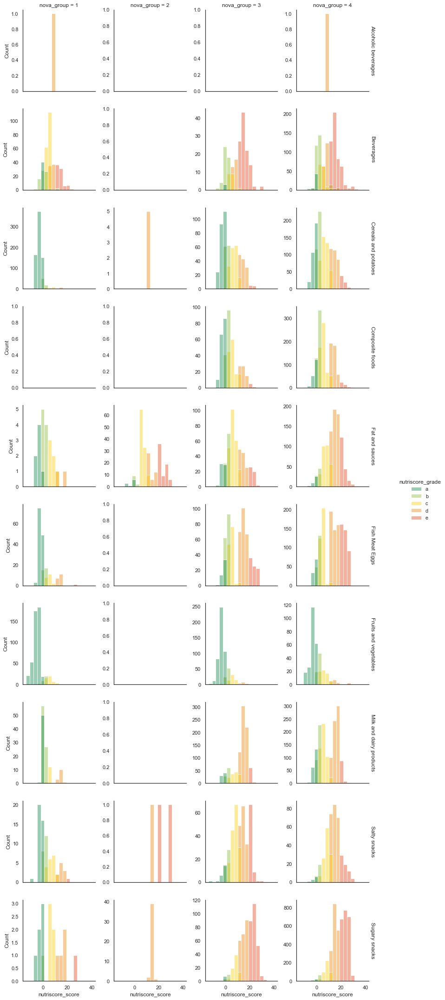

In [247]:
def unique_ordered(series: pd.Series) -> list:
    ret = list(series.dropna().unique().astype(str))
    if len(ret) > 100:
        return []
    ret.sort()
    return ret


# g = sns.FacetGrid(cleaned_data, col="nova_group", hue='nova_group', col_wrap=2, sharex=True,sharey=False)
# g.map(sns.displot, "nutriscore_score")


def plot_dist_facet(df:pd.DataFrame, x='nutriscore_score', col='nova_group', row="pnns_groups_1", hue='nutriscore_grade'):
    if df[x].dtype == 'object':
        df = df.sort_values(by=[x])
    col_order = None if col is None else unique_ordered(df[col])
    row_order = None if row is None else unique_ordered(df[row])
    hue_order = None if hue is None else unique_ordered(df[hue])
    g = sns.displot(df, x=x,
                    col=col, col_order=col_order,
                    row=row, row_order=row_order,
                    hue=hue, hue_order=hue_order,
                    palette=get_palette(hue),
                    binwidth=3, height=3, alpha=0.4, facet_kws=dict(margin_titles=True, sharey=False),
                    )
    # g.set_titles(col_template="{col_name}", row_template="{row_name}")
    g.set_titles(row_template="{row_name}")


cleaned_data.pipe(plot_dist_facet)
to_png('distribution_nutriscore_par_nova_group_et_pnns_facetgrid_displot')


"distribution_nutriscore_par_nova_group_facetgrid_displot.png"


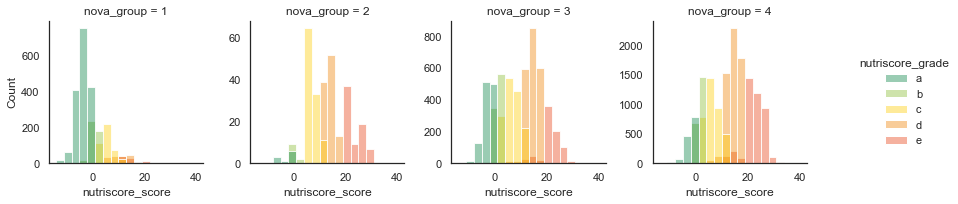

In [248]:

cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='nova_group', row=None)
to_png('distribution_nutriscore_par_nova_group_facetgrid_displot')


"distribution_nutriscore_par_addiscore_risk_facetgrid_displot.png"


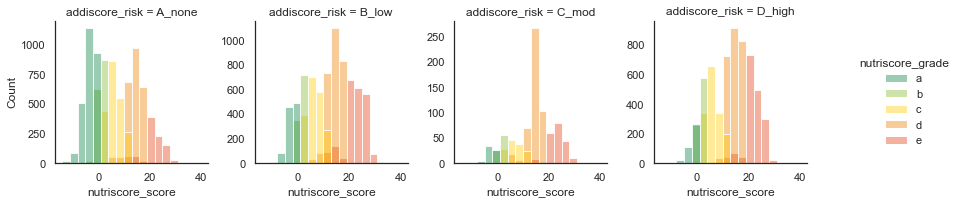

In [249]:
cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='addiscore_risk', row=None)
to_png('distribution_nutriscore_par_addiscore_risk_facetgrid_displot')


"distribution_nutriscore_par_nova_group_pnns_facetgrid_histplot.png"


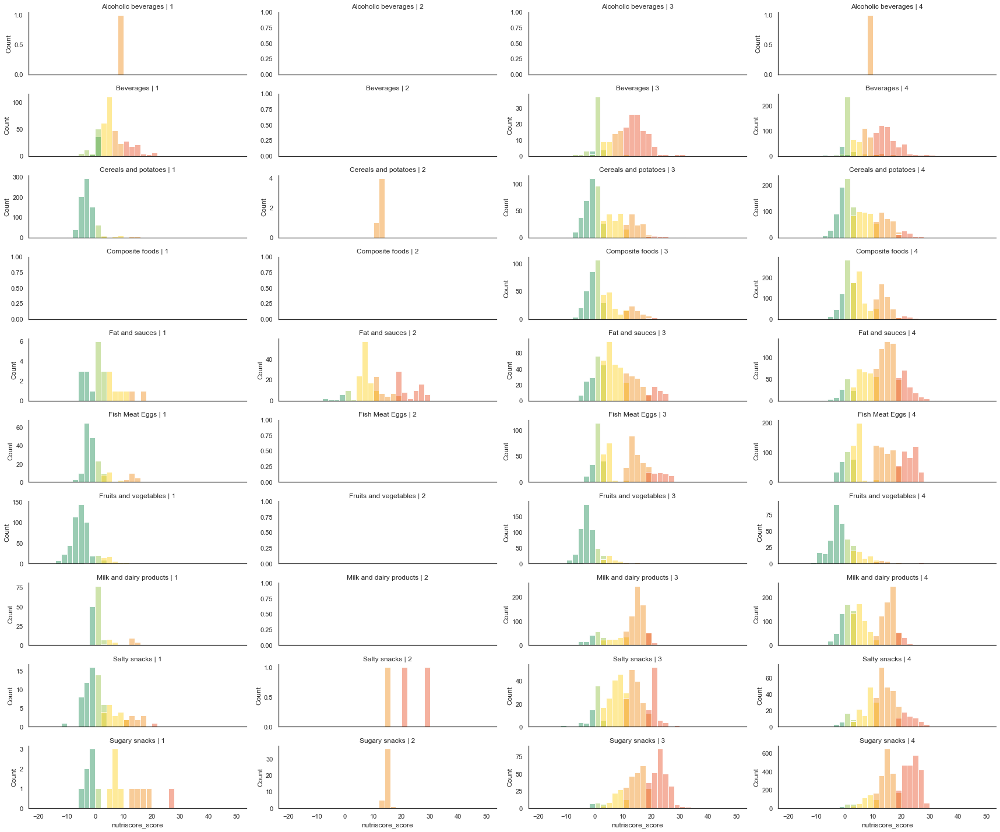

In [250]:
#
def plot_dist_facets(df:pd.DataFrame, x='nutriscore_score', col='nova_group', row="pnns_groups_1", hue='nutriscore_grade'):
    if df[x].dtype == 'object':
        df = df.sort_values(by=[x])
    col_order = None if col is None else unique_ordered(df[col])
    row_order = None if row is None else unique_ordered(df[row])
    hue_order = None if hue is None else unique_ordered(df[hue])
    g = sns.FacetGrid(df,
                      col=col, col_order=col_order,
                      row=row, row_order=row_order,
                      hue=hue, hue_order=hue_order,
                      palette=get_palette(hue),
                      aspect=3,
                      height=2,
                      sharex=True,
                      sharey=False,
                      )
    g.map_dataframe(sns.histplot, x="nutriscore_score",
                    alpha=0.4, binwidth=2, binrange=(-20, 50))
    g.set_titles(col_template="{col_name}", row_template="{row_name}")
    g.tight_layout()


cleaned_data.pipe(plot_dist_facets)
to_png('distribution_nutriscore_par_nova_group_pnns_facetgrid_histplot')


### Repartitions par tag

- plot les {top_n} tags, reparties entre un score


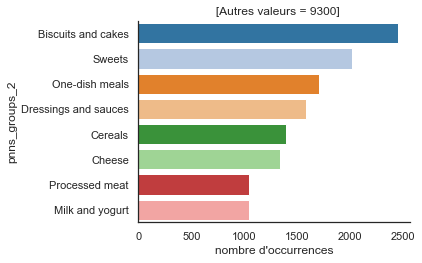

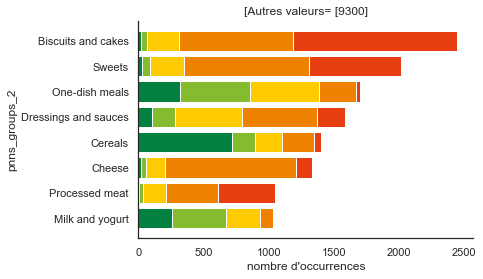

In [251]:
def plot_barh_stacked(df:pd.DataFrame, y_var, groupby_var, sort_counts=True, nb=8):
    ct = pd.crosstab(df[y_var], df[groupby_var])
    groups = list(ct.columns)
    other_count = 0
    for i in range(1, len(groups)):
        ct.iloc[:, i] = ct.iloc[:, i] + ct.iloc[:, i - 1]
    if sort_counts:
        # Assign sum of all rows of DataFrame as a new Row
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=False)
        nb = min(len(ct), nb)
        other_count = ct.iloc[nb:, -1].sum()
        ct = ct.head(nb)
        # plt.barh starts from bottom
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=True)

    # prepare to plot

    palette = get_palette(groupby_var)
    if palette is None:
        colors = plt.cm.get_cmap('spectral',len(groups))
    else:
        colors = list(palette.values())
    plt.figure()
    for i in range(len(groups) - 1, -1, -1):
        plt.barh(ct.index, ct[groups[i]], color=colors[i])
    ax = plt.gca()
    ax.set_title(f'[Autres valeurs= [{other_count}]')
    ax.set_xlabel("nombre d'occurrences")
    ax.set_ylabel(y_var)
    sns.despine()


(cleaned_data
 .dropna(subset=['pnns_groups_2', 'nutriscore_grade'])
 .pipe(plot_bar_top_n, 'pnns_groups_2', nb=8)
 )

plt.show()
cleaned_data.pipe(plot_barh_stacked, 'pnns_groups_2', 'nutriscore_grade', nb=8)


nutriscore_grade          a   b   c   d   e  sum
additives_en                                    
E330 - Citric acid       67  27  48  44  39  225
E440 - Pectins            6  12  89  66   5  178
E300 - Ascorbic acid     56  11  35  10  31  143
E14XX - Modified Starch  24  47  31  12   2  116
E415 - Xanthan gum       11  10  15  10   2   48


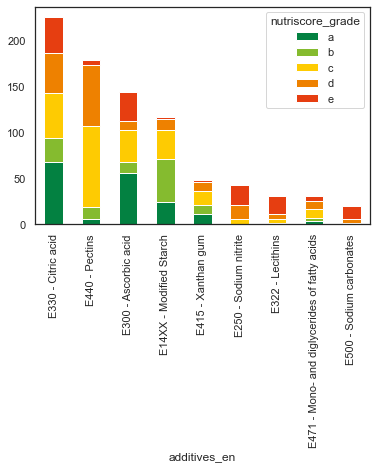

In [252]:
def plot_repartition_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False, score_column='nutriscore_grade',
                            palette=nutriscore_palette):
    top_n = filtre_par_top_freq(df, tag_column, nb=nb)
    top_tags = top_n.value_counts().index
    if sort_tags:
        top_tags = top_tags.sort_values()
    grades = df[score_column].dropna().unique().tolist()
    grades.sort()
    filtre = top_n.notnull() & df[score_column].notnull()
    if not other_tags:
        # 'exclut les autres tags'
        filtre &= top_n != 'other'
        filtre &= top_n != 'unknown'
    data = df[filtre]
    # .groupby([tag_column,score_column]).agg(['count'])
    ct = pd.crosstab(data[tag_column], data[score_column])
    sort_tags = True
    if sort_tags:
        # Assign sum of all rows of DataFrame as a new Row
        ct.loc[:, 'sum'] = ct.sum(axis=1)
        ct = ct.sort_values(by='sum', axis=0, ascending=False)
        print(ct.head())
        ct = ct.drop('sum', axis=1)

    groups = ct.index.unique()
    palette = get_palette(score_column)
    if palette:
        colors = palette.values()
    else:
        colors = plt.cm.get_cmap('spectral',len(groups))
    ct.plot(kind='bar', stacked=True, color=colors)


def plot_nutrigrade_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False):
    plot_repartition_by_tag(df, tag_column, nb, other_tags,
                            sort_tags=sort_tags, score_column='nutriscore_grade')


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_nutrigrade_by_tag, 'additives_en')
 )


nutriscore_grade           a   b   c   d   e  sum
additives_en                                     
E407 - Carrageenan        12  23  39  27  11  112
E202 - Potassium sorbate   8  11  32  17   7   75
E250 - Sodium nitrite      0   1   8  32  33   74
E450 - Diphosphates        2   3   3   4   3   15


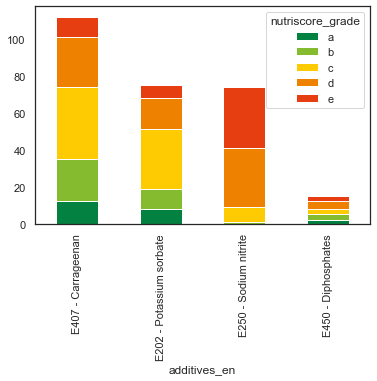

In [253]:
unsafe_products.pipe(plot_nutrigrade_by_tag, 'additives_en')


### 1.2.3 Box plots - nutriscore dans chaque catégorie PNNS_group_1


"distribution_nutriscore_par_pnns_groups_1_boxplot.png"


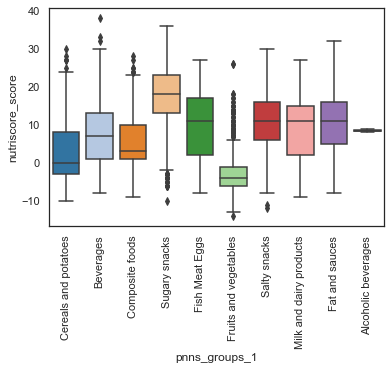

In [254]:

g = sns.boxplot(data=cleaned_data, x='pnns_groups_1', y='nutriscore_score')
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_1_boxplot')


"distribution_nutriscore_par_pnns_groups_2_boxplot.png"


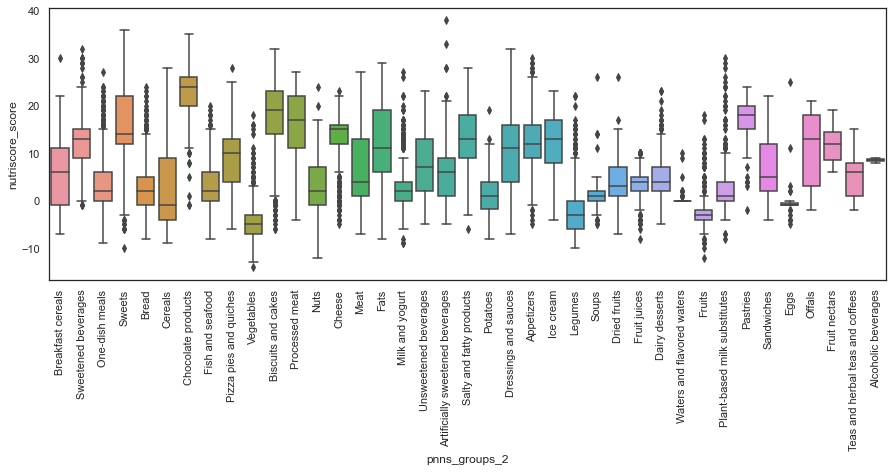

In [255]:
plt.figure(figsize=(15, 5))
g = sns.boxplot(data=cleaned_data, x='pnns_groups_2', y='nutriscore_score')
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_2_boxplot')


###  nutriscore by PNNS group (histograms)


"distribution_nutriscore_par_pnns_groups_1_kdeplot.png"


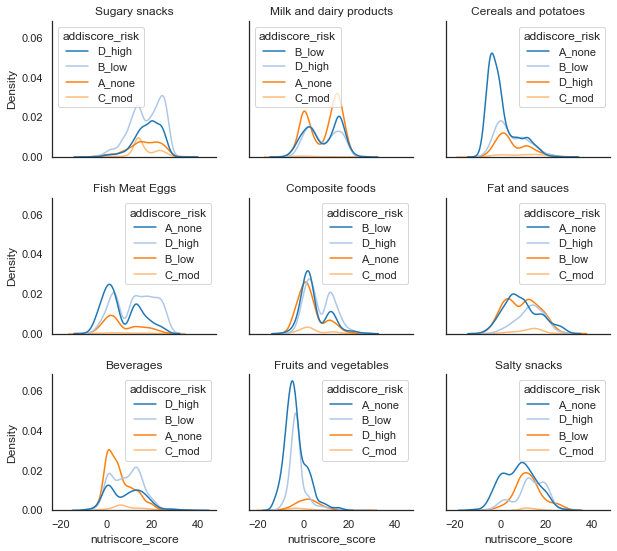

In [256]:
def plot_dist_nutriscore_by_pnns_group(df:pd.DataFrame, num_col='nutriscore_score', categ_col='pnns_groups_1', hue=None):
    df1 = df[[num_col, categ_col]].dropna()
    categories = df1[categ_col].value_counts(ascending=False)
    categories = categories[categories.values > 20].index
    if len(categories) > 12:
        categories = categories[:12]
    n_rows = len(categories) // 3
    if len(categories) % 3 > 0:
        n_rows += 1
    _, axs = plt.subplots(nrows=n_rows, ncols=3, figsize=(
        10, n_rows * 3), sharex='all', sharey='all')

    if hue is None:
        df = df[[num_col, categ_col]].dropna()
    else:
        df = df[[num_col, categ_col, hue]].dropna()
    cpt = 0
    for categ in categories:
        cpt += 1
        ax1 = plt.subplot(n_rows, 3, cpt)
        data = df[df[categ_col] == categ]
        g = sns.kdeplot(data=data, x=num_col, ax=ax1, hue=hue)
        g.set_title(categ)
        sns.despine()

    plt.subplots_adjust(hspace=0.3)
    to_png(f'distribution_nutriscore_par_{categ_col}_kdeplot')


cleaned_data.pipe(plot_dist_nutriscore_by_pnns_group,
                  hue='addiscore_risk', categ_col='pnns_groups_1')


"distribution_nutriscore_par_pnns_groups_2_kdeplot.png"


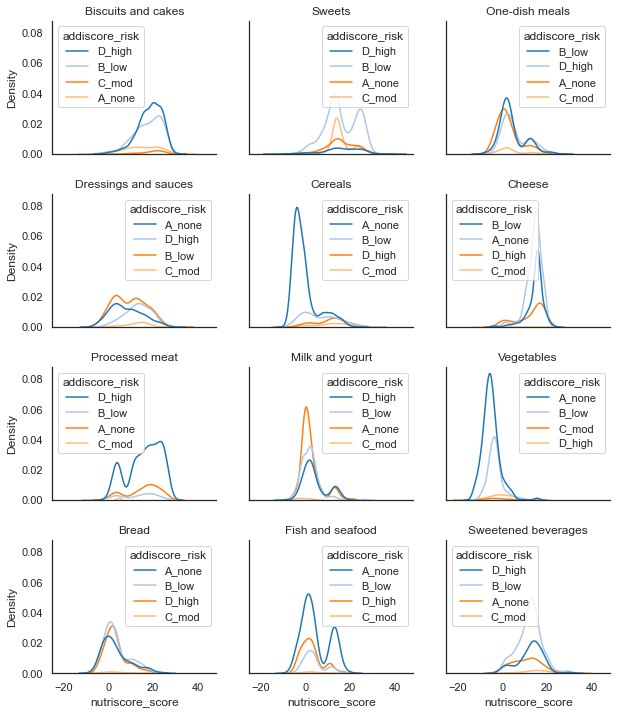

In [257]:
cleaned_data.pipe(plot_dist_nutriscore_by_pnns_group,
                  hue='addiscore_risk', categ_col='pnns_groups_2')


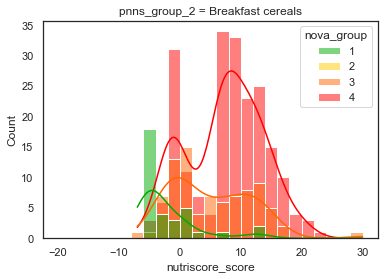

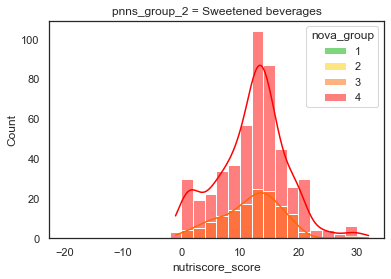

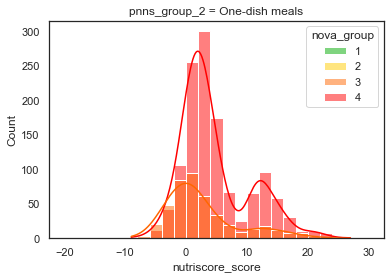

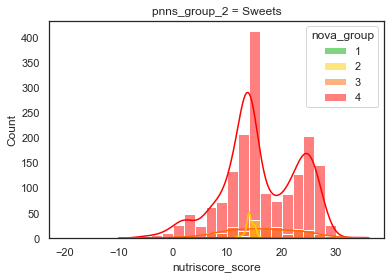

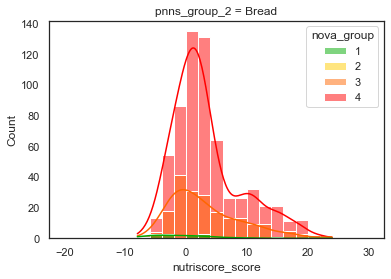

...

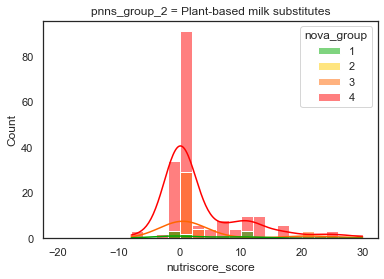

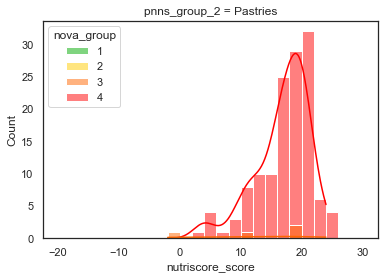

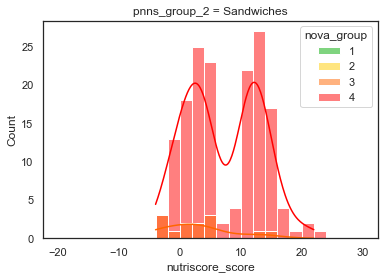

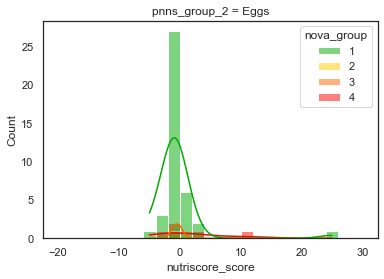

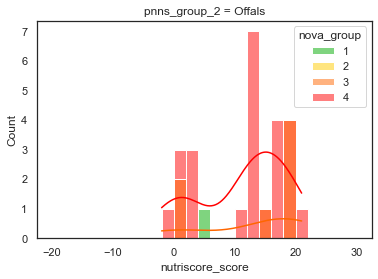

In [258]:
pnns_groups_1 = cleaned_data['pnns_groups_1'].dropna().unique()
pnns_groups_2 = cleaned_data['pnns_groups_2'].dropna().unique()


def plot_pnns_group_2_distributions(df:pd.DataFrame, hue='nova_group'):
    df = df.dropna(subset=['pnns_groups_1', 'pnns_groups_2',
                           'nutriscore_score', 'nova_group'])
    for grp in pnns_groups_2:
        data = df[df['pnns_groups_2'] == grp]
        if len(data) > 20:
            g = sns.histplot(data=data, x='nutriscore_score', hue='nova_group',
                             hue_order=nova_order,
                             palette=nova_palette,
                             binwidth=2,
                             binrange=(-20, 30),
                             kde=True)
            plt.title(f'pnns_group_2 = {grp}')
            plt.show()


cleaned_data.pipe(plot_pnns_group_2_distributions)


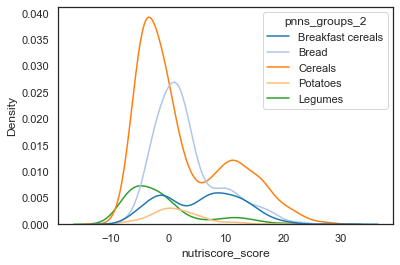

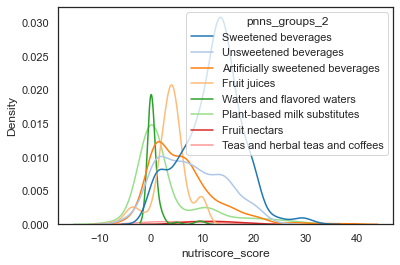

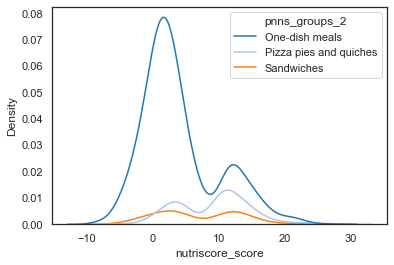

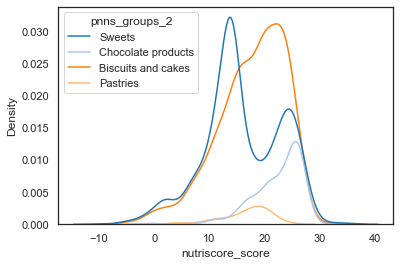

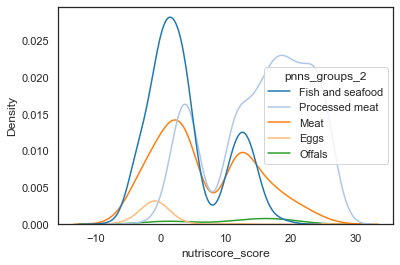

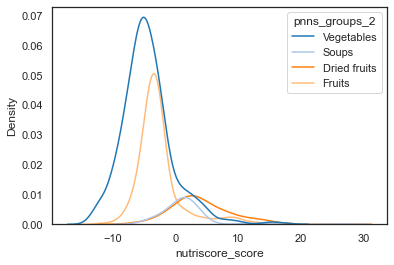

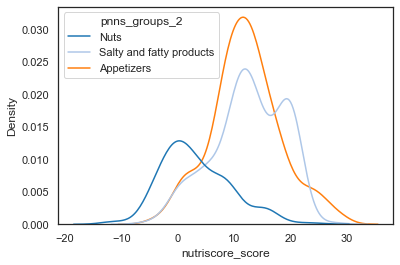

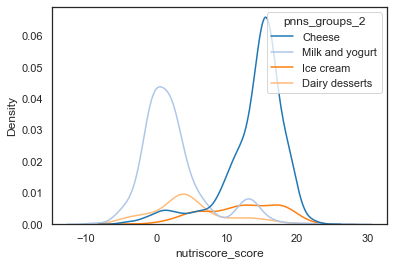

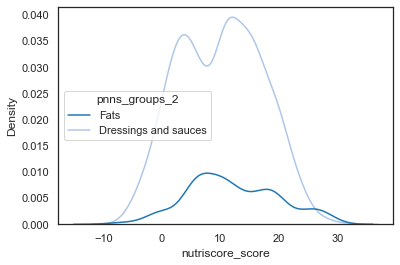

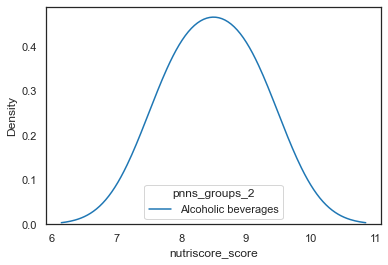

In [259]:
def plot_pnns_group_2_distributions(df:pd.DataFrame):
    for grp in pnns_groups_1:
        data = df[df['pnns_groups_1'] == grp]
        g = sns.kdeplot(data=data, x='nutriscore_score', hue='pnns_groups_2')
        plt.show()


cleaned_data.pipe(plot_pnns_group_2_distributions)


### 1.2.4 Box plots - variation de nutriscore par addiscore_risk dans chaque catégorie PNNS_group_2


"distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot.png"


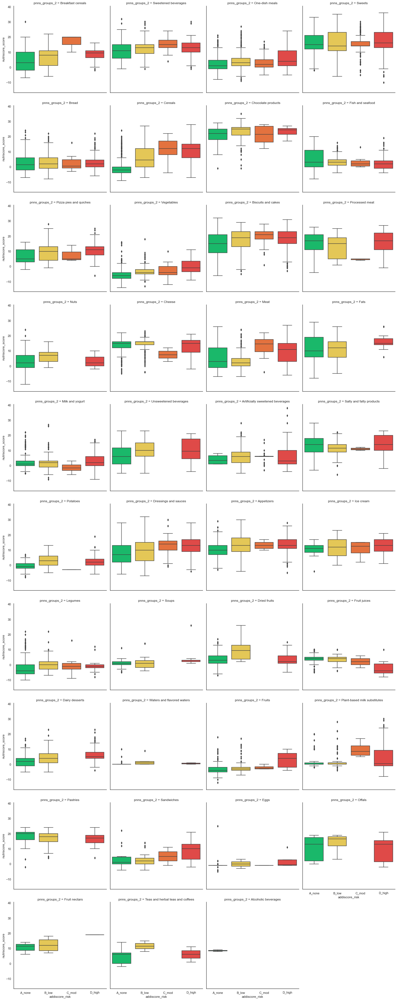

In [260]:
sns.catplot(
    data=cleaned_data, x='addiscore_risk', y='nutriscore_score',
    col='pnns_groups_2', palette=addiscore_palette, order=addiscore_order, kind='box', col_wrap=4, )
# sns.boxplot(data=cleaned_data, x='pnns_groups_1', y='nutriscore_score',hue='nutriscore_grade', palette=nutriscore_palette)
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot')


### 2.2.4 Regression plot: nutriscore y saturated fats

Est-ce que la catégorie d'addiscore risk est corrélé avec la quantité de gras ?

"regression_saturated-fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot.png"


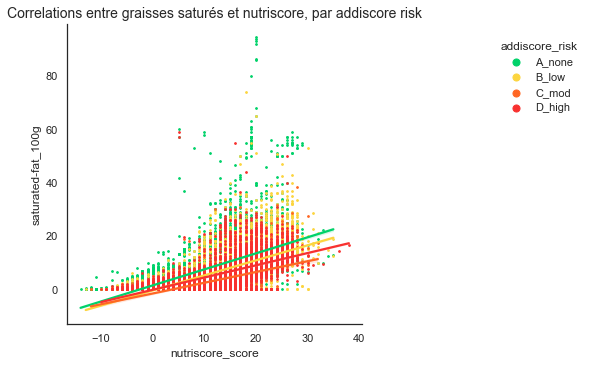

In [261]:

(cleaned_data[['nutriscore_score', 'saturated-fat_100g', 'addiscore_risk']]
 .dropna()
 .pipe(plot_reg, y_var='saturated-fat_100g', hue='addiscore_risk')
 )
plt.title('Correlations entre graisses saturés et nutriscore, par addiscore risk', size=14)
to_png(f'regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot')



"regression_fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_fat_100g_et_nutriscore,_par_addiscore_risk.png"


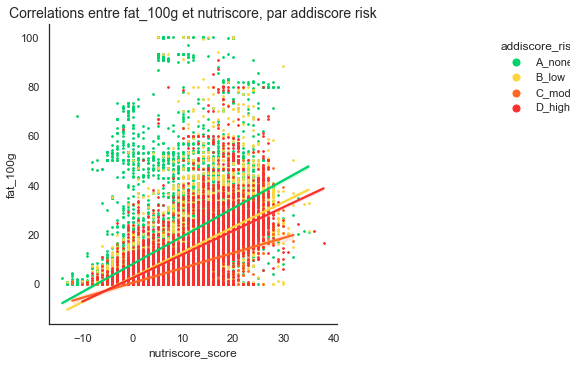

"regression_saturated-fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_saturated-fat_100g_et_nutriscore,_par_addiscore_risk.png"


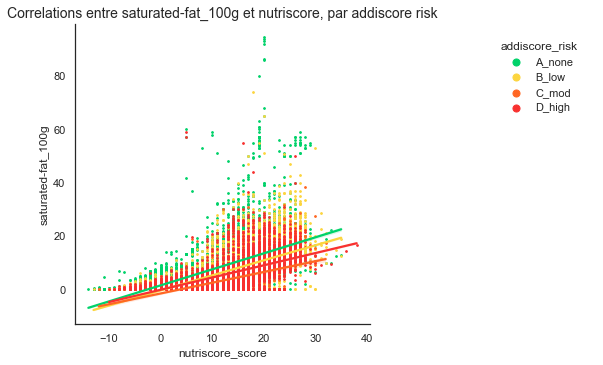

"regression_carbohydrates_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_carbohydrates_100g_et_nutriscore,_par_addiscore_risk.png"


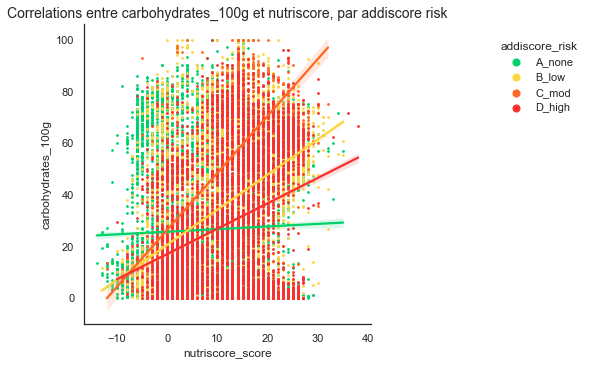

"regression_sugars_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_sugars_100g_et_nutriscore,_par_addiscore_risk.png"


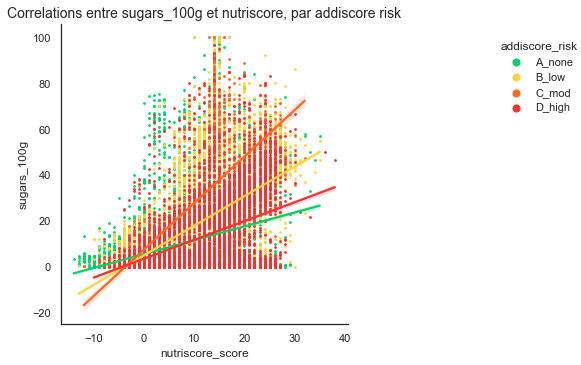

"regression_fiber_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_fiber_100g_et_nutriscore,_par_addiscore_risk.png"


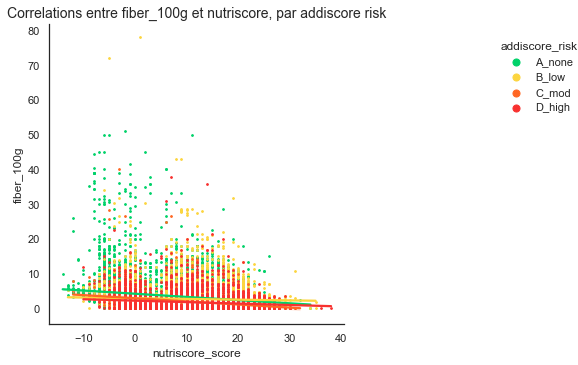

"regression_proteins_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_proteins_100g_et_nutriscore,_par_addiscore_risk.png"


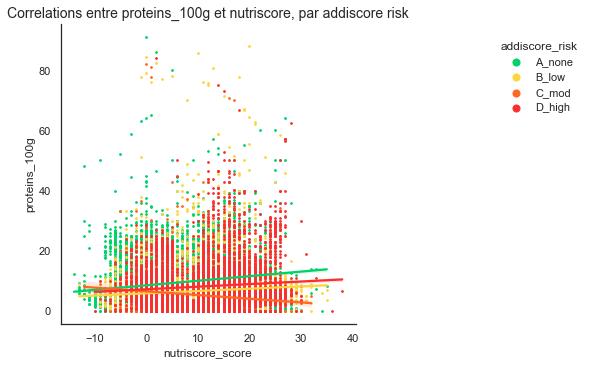

"regression_sodium_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_sodium_100g_et_nutriscore,_par_addiscore_risk.png"


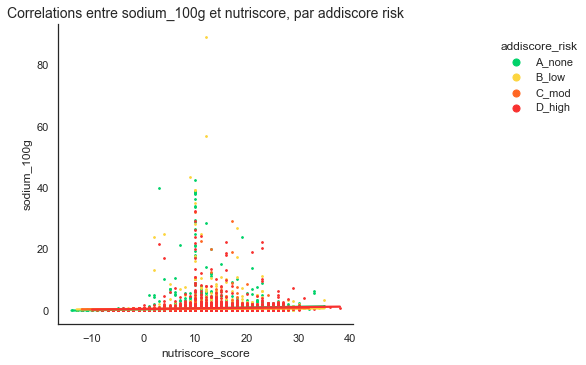

"regression_fruits-vegetables-nuts-estimate-from-ingredients_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_fruits-vegetables-nuts-estimate-from-ingredients_100g_et_nutriscore,_par_addiscore_risk.png"


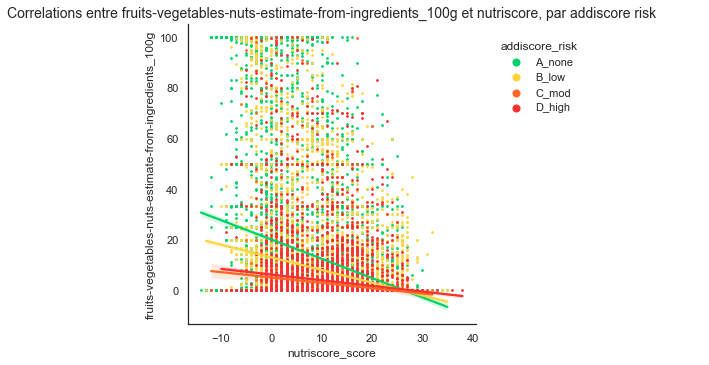

In [262]:
for col in colonnes_100g:
    (cleaned_data[['nutriscore_score', col, 'addiscore_risk']]
     .dropna()
     .pipe(plot_reg, y_var=col, hue='addiscore_risk')
     )
    plt.title(f'Correlations entre {col} et nutriscore, par addiscore risk', size=14)
    to_png()
    plt.show()

In [263]:
def plot_correlations_nutriscore(df:pd.DataFrame):
    for col in colonnes_100g:
        (df
         .pipe(filter_by_nova_group, 4)[['nutriscore_score', col, 'addiscore_risk']]
         .dropna()
         .pipe(plot_reg, y_var=col, hue='addiscore_risk')
         )
        plt.title(f'Correlations (NOVA 4) entre {col} et nutriscore, par addiscore risk', size=14)
        to_png()
        plt.show()

# cleaned_data.pipe(plot_correlations_nutriscore)

In [264]:
def plot_pnns_group_nutr(df:pd.DataFrame):
    categs = groupes_a_risque_eleves
    for categ in categs:
        data = (df
                .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
                .pipe(filter_by_nova_group, 4)
                )
        for col in colonnes_100g:
            (data
             .pipe(filter_by_nova_group, 4)[['nutriscore_score', col, 'addiscore_risk']]
             .dropna()
             .pipe(plot_reg, y_var=col, hue='addiscore_risk')
             )
            ax = plt.gca()
            ymin, ymax = ax.get_ylim()
            ax.set_ylim((0, ymax))
            plt.suptitle(f'Correlations (pnns2 = {categ}) entre {col} et nutriscore', size=14)
            plt.title(f'(groupe NOVA 4) by addiscore_risk', size=12)
            plt.tight_layout()
            to_png()
            plt.show()

# cleaned_data.pipe(plot_pnns_group_nutr)

"regression_saturated-fat_100g_vs_addiscore_hue_addiscore_risk_lmplot.png"
"regression_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot.png"


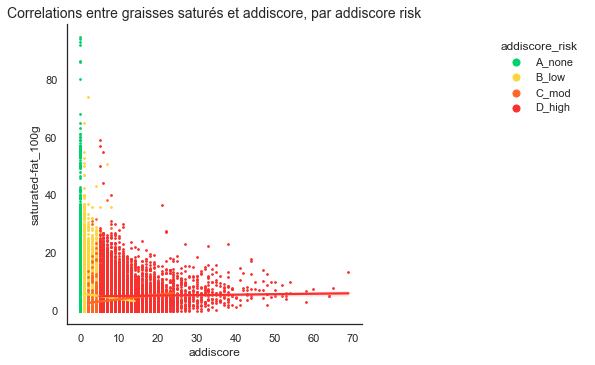

In [265]:
(cleaned_data[['addiscore', 'saturated-fat_100g', 'addiscore_risk']].dropna()
 .pipe(plot_reg, x_var='addiscore', y_var='saturated-fat_100g', hue='addiscore_risk'))
plt.title('Correlations entre graisses saturés et addiscore, par addiscore risk', size=14)
to_png(f'regression_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot')


"scatter_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot.png"


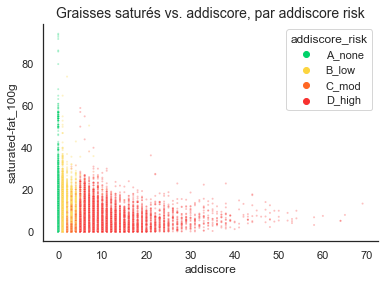

In [266]:
ax = sns.scatterplot(data=cleaned_data.sort_values(by='addiscore_risk', ascending=True), x='addiscore',
                     y='saturated-fat_100g', hue='addiscore_risk',
                     palette=addiscore_palette, s=4, alpha=0.3)
sns.despine()
plt.title('Graisses saturés vs. addiscore, par addiscore risk', size=14)
to_png(f'scatter_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot')


### 2.2.6 Heatmap : nb produits par catégorie et additif nocif


## Crosstab heatmap (2 vars catégoriques)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


"crosstab_heatmap_pnns_groups_1_grouped_by_pnns_groups_2.png"


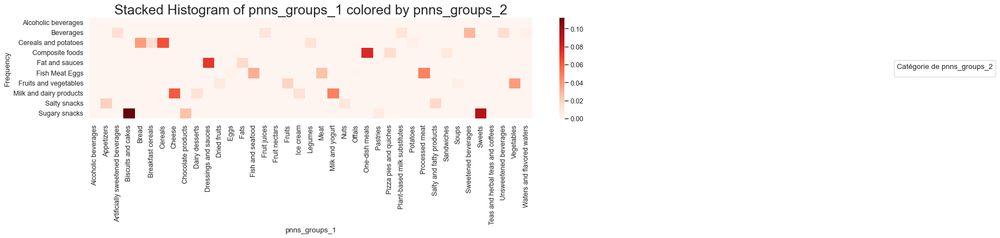

In [267]:
def plot_crosstab_heatmap(df:pd.DataFrame, x_var, groupby_var):
    ct = pd.crosstab(index=df[x_var], columns=df[groupby_var], normalize='all')

    # prepare to plot
    groups = ct.columns.tolist()
    # colors = [plt.cm.Spectral(i / float(len(groups) - 1))
    #         for i in range(len(groups))]
    _, ax = plt.subplots(figsize=(16, 3), dpi=80)

    # Draw
    sns.heatmap(ct, ax=ax, cmap='Reds')
    # ct.plot(kind='bar', stacked=True, color=colors, ax=ax)
    # sns.barplot(data=ct,x=ct.index,y=ct.columns, stacked=True, color=colors, ax=ax,orient='v')
    # plt.hist(kind='bar',data =ct, values=ct.columns,stacked=True, colors=colors, ax=ax)
    # Decoration
    plt.legend(title=f'Catégorie de {groupby_var}',
               # labels={group: col for group, col in zip(groups, colors)},
               bbox_to_anchor=(1.4, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.title(
        f"Stacked Histogram of {x_var} colored by {groupby_var}", fontsize=22)
    plt.xlabel(x_var)
    plt.ylabel("Frequency")
    # plt.ylim(0, 40)
    to_png(f'crosstab_heatmap_{x_var}_grouped_by_{groupby_var}')


plot_crosstab_heatmap(cleaned_data, 'pnns_groups_1', 'pnns_groups_2')


## Stacked bar chart (2 vars catégoriques)


"stacked_histogram_pnns_groups_1_grouped_by_pnns_groups_2.png"
"stacked_histogram_pnns_1_grouped_by_pnns_2.png"


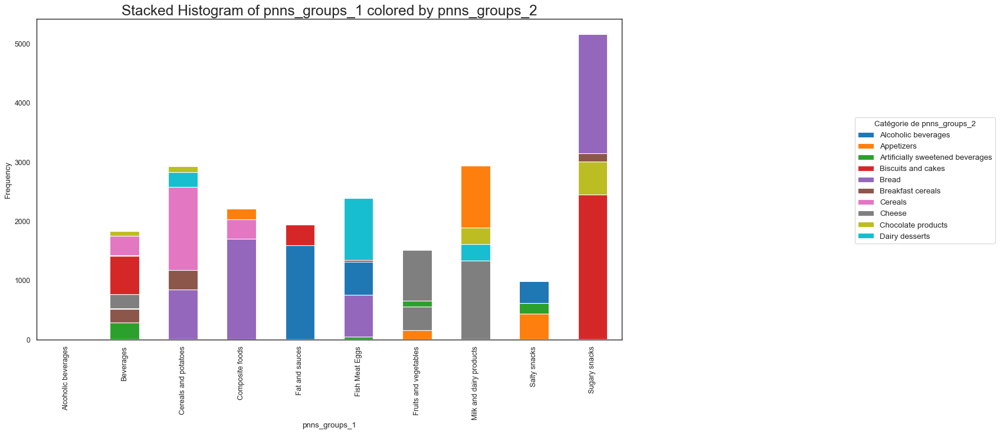

In [268]:
def plot_stacked_histogram(df:pd.DataFrame, x_var, groupby_var, normalize=False, sortbygroup=None):
    # ct=(df[[x_var,groupby_var]]
    #     .value_counts().to_frame().reset_index()
    #     .pivot(index=x_var, columns=groupby_var)
    #     .fillna(0).astype(int).droplevel(0, axis=1))
    if normalize:
        ct = pd.crosstab(
            index=df[x_var], columns=df[groupby_var], normalize='index') * 100
    else:
        ct = pd.crosstab(index=df[x_var], columns=df[groupby_var])

    # prepare to plot
    groups = ct.columns.tolist()
    palette = get_palette_df(df,groupby_var)
    if palette:
        colors = palette.values()
    else:
        colors=None
        # colors=sns.pa
        # colors = plt.cm.get_cmap('spectral',len(groups))
    _, ax = plt.subplots(figsize=(16, 9), dpi=80)

    if sortbygroup:
        ct = ct.sort_values(by=sortbygroup, ascending=False)

    # Draw
    ct.plot(kind='bar', stacked=True, color=colors, ax=ax)
    # sns.barplot(data=ct,x=ct.index,y=ct.columns, stacked=True, color=colors, ax=ax,orient='v')
    # plt.hist(kind='bar',data =ct, x=ct.index, values=ct.columns,stacked=True, colors=colors)
    # Decoration
    plt.legend(title=f'Catégorie de {groupby_var}',
               labels={group: col for group, col in zip(groups, colors)},
               bbox_to_anchor=(1.4, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.title(
        f"Stacked Histogram of {x_var} colored by {groupby_var}", fontsize=22)
    plt.xlabel(x_var)
    plt.ylabel("Frequency")
    # plt.ylim(0, 40)
    to_png(f'stacked_histogram_{x_var}_grouped_by_{groupby_var}')


plot_stacked_histogram(cleaned_data, 'pnns_groups_1', 'pnns_groups_2')

to_png(f'stacked_histogram_pnns_1_grouped_by_pnns_2')


"stacked_histogram_pnns_groups_2_grouped_by_addiscore_risk.png"


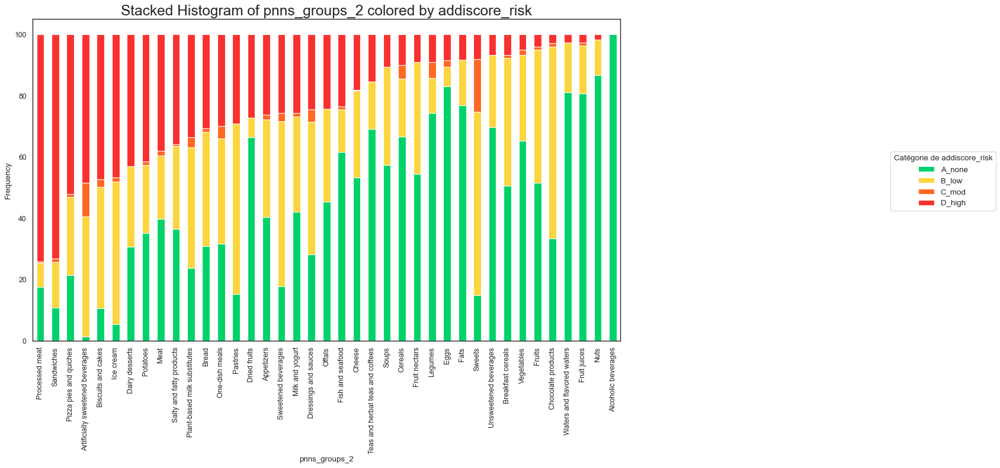

In [269]:
# cleaned_data['pnns_groups_2'],cleaned_data['addiscore_risk'],
plot_stacked_histogram(cleaned_data, 'pnns_groups_2',
                       'addiscore_risk', normalize=True, sortbygroup='D_high')


## Colonnes très corrélées entre eux

| colonne1             | colonne2             | test de corrélation (dependence) |
|----------------------|----------------------|----------------------------------|
| numérique            | numérique            | pearson correlation              |
| catégorique(ordinal) | numérique            | spearman's rank correlation      |
| catégorique(nominal) | catégorique(nominal) | chi-square                       |

- Chi-Square Goodness of Fit Test — test if one variable is likely to come from a given distribution.

https://towardsdatascience.com/statistics-in-python-using-chi-square-for-feature-selection-d44f467ca745

- Chi-Square Test of Independence — test if two variables might be correlated or not.
  - H0 : les 2 variables sont indépendants
  - H1 : les 2 variables sont dépendants un sur l'autre


### 2.2.7 Correlations entre servings_100g,nova_group,nutriscore,additifs_n, ingredients_n


In [270]:
cleaned_data.info(verbose=True)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 26685 entries, 0 to 99995
Data columns (total 38 columns):
 #   Column                                                 Non-Null Count  Dtype         
---  ------                                                 --------------  -----         
 0   code                                                   26685 non-null  object        
 1   creator                                                26685 non-null  object        
 2   created_datetime                                       26685 non-null  datetime64[ns]
 3   last_modified_datetime                                 26685 non-null  datetime64[ns]
 4   product_name                                           26646 non-null  object        
 5   brands_tags                                            21670 non-null  object        
 6   categories_en                                          26685 non-null  object        
 7   labels_en                                              9227 non-nul

"Correlations_entre_les_variables_numériques.png"


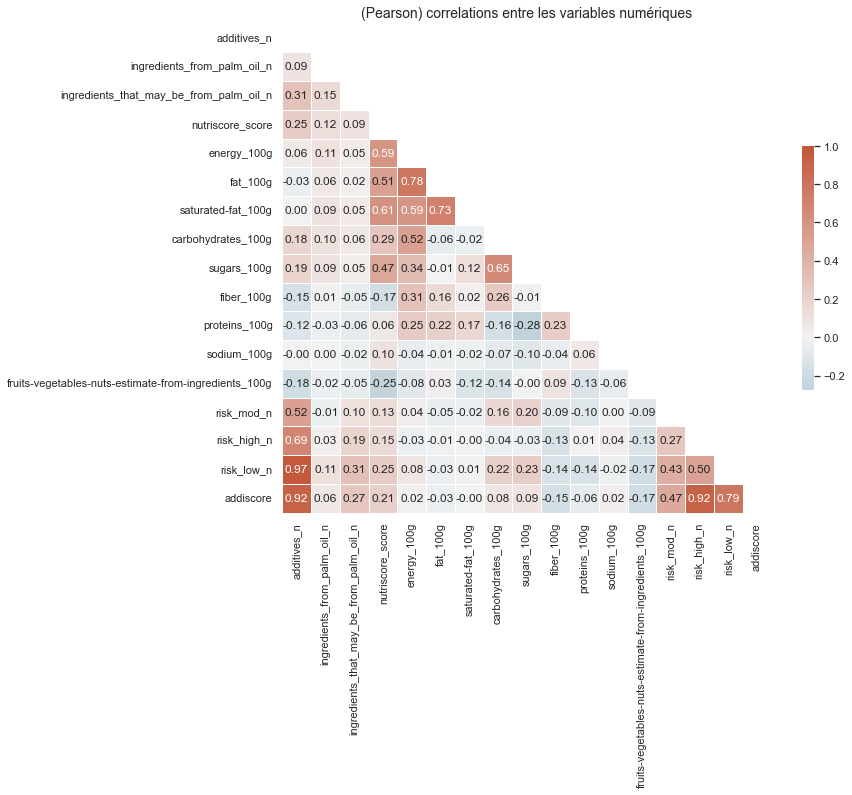

In [271]:
def plot_heatmap(df:pd.DataFrame):
    corr_tab = cleaned_data.select_dtypes('number').corr()
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_tab, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr_tab, annot=True, fmt='.2f', mask=mask, cmap=cmap, vmax=1, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_heatmap)
 )
plt.title('(Pearson) correlations entre les variables numériques', size=14)
to_png('Correlations_entre_les variables_numériques')


<AxesSubplot:xlabel='nutriscore_score', ylabel='saturated-fat_100g'>

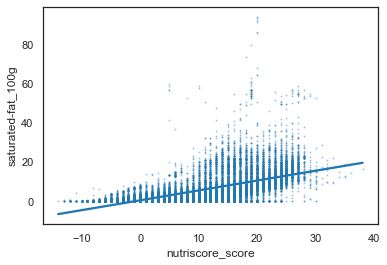

In [272]:
sns.regplot(data=cleaned_data, x='nutriscore_score', y='saturated-fat_100g', scatter_kws={'s': 1, 'alpha': 0.3})


<AxesSubplot:xlabel='nutriscore_score', ylabel='saturated-fat_100g'>

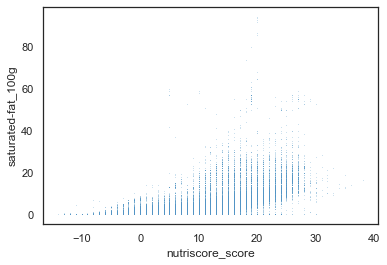

In [273]:
sns.scatterplot(data=cleaned_data, x='nutriscore_score', y='saturated-fat_100g', s=1, alpha=0.3)

"scatter_saturated_fat_nutriscore_hue_addiscore.png"


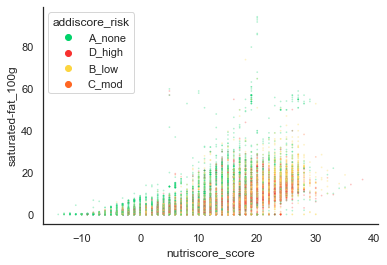

In [274]:
sns.scatterplot(data=cleaned_data, x='nutriscore_score', y='saturated-fat_100g',
                hue='addiscore_risk', palette=addiscore_palette, s=3, alpha=0.3)
sns.despine()
to_png('scatter_saturated_fat_nutriscore_hue_addiscore')

# 8. Analyse en Composants Principales (ACP)

- <https://www.datasklr.com/principal-component-analysis-and-factor-analysis/principal-component-analysis>
- <https://jmausolf.github.io/code/pca_in_python/>
- <https://cmdlinetips.com/2018/03/pca-example-in-python-with-scikit-learn/>

### 8.1.1 ACP : Objectifs d'Analyse Exploratoire

- Analyse de Composants Principales :
  - réduire les dimensions en trouvant des variables qui explique le plus de variance entre observations

Sur les colonnes :

- servings_100g,nova_group,nutriscore,ecoscore,additifs_n, ingredients_n


In [275]:
names = cleaned_data["product_name"]  # ou data.index pour avoir les intitulés


### PCA étape 1 - selection des colonnes à prendre en compte dans l'ACP

#### Sélectionner les variables quantitatives nutritionnelles


In [276]:
def datetime_to_float(df:pd.DataFrame):
    date_cols = list(df.select_dtypes('datetime'))
    for col in date_cols:
        df[col] = df[col].astype('datetime64').view(
            np.int64).astype(np.float64)
    return df


def pca_select_vars(df:pd.DataFrame, exclude_cols=[]):
    cols_to_include = list(df.select_dtypes(include=['number']).columns)
    cols_to_drop = list(set(cols_to_include) & set(exclude_cols))
    # cols= list(set(cols_to_include) - set(cols_to_drop))
    return df[cols_to_include].drop(cols_to_drop, axis=1)


pca_exclude_cols = list(set(cleaned_data.columns) - set(colonnes_100g))
print(f'exclude cols : {pca_exclude_cols}')

pca_data = cleaned_data.pipe(pca_select_vars, exclude_cols=pca_exclude_cols)
pca_data.info()


exclude cols : ['risk_mod_n', 'nutriscore_grade', 'additives_tags', 'additives_n', 'created_datetime', 'labels_en', 'risk_low_n', 'code', 'last_modified_datetime', 'ingredients_that_may_be_from_palm_oil_tags', 'product_name', 'countries_en', 'ingredients_text', 'addiscore_risk', 'addiscore', 'states_en', 'nova_group', 'ingredients_that_may_be_from_palm_oil_n', 'additives_en', 'brands_tags', 'energy_100g', 'main_category_en', 'ingredients_from_palm_oil_tags', 'ingredients_from_palm_oil_n', 'nutriscore_score', 'categories_en', 'pnns_groups_1', 'creator', 'pnns_groups_2', 'risk_high_n']
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26685 entries, 0 to 99995
Data columns (total 8 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   fat_100g                                               26649 non-null  float64
 1   saturated-fat_100g                          

### PCA étape 2 - Préparation des données sélectionnées pour l'ACP

#### 2a : éliminer les outliers :

- pour réduire le risque de trop d'influence des outliers
- éliminer ou abs(Z-score) > 3 (pas bon pour des colonnes avec beaucoup de skew)
- éliminer les top 1% et bottom 1%


In [277]:
def drop_high_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus grandes"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        # min_val = df[column].quantile(alpha)
        max_val = df[column].quantile(1 - alpha)
        # filtre &= df[column]>min_val
        filtre |= df[column] > max_val

    nb = df[filtre].shape[0]
    print(f'drop_high_outliers, nb={nb}')  # ', (subset={subset})')
    return df[~filtre]


def drop_low_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus petites"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        min_val = df[column].quantile(alpha)
        # max_val = df[column].quantile(1-alpha)
        filtre |= df[column] < min_val
        # filtre &= df[column]<max_val

    nb = df[filtre].shape[0]
    print(f'drop_low_outliers, nb={nb}')  # , (subset={subset})')
    return df[~filtre]


print(pca_data.shape)
pca_data = (pca_data
            .pipe(drop_high_outliers)
            .pipe(drop_low_outliers))
print(pca_data.shape)


(26685, 8)
drop_high_outliers, nb=1505
drop_low_outliers, nb=0
(25180, 8)


#### 2b : éliminer les NaN :

- dropna() # pour ne réduire pas la variance d'un variable
- fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
- drop(columns={colonnes moins importantes qui contient des NaN})

In [278]:
def drop_colonnes_vides(df:pd.DataFrame, threshold=0):
    count = df.isna().mean()
    colonnes_vides = count[(1 - count) <= threshold].index.to_list()
    print(f'drop_colonnes_vides, threshold = {threshold}')
    return df.drop(colonnes_vides, axis=1)


pca_data = (pca_data.pipe(drop_colonnes_vides, threshold=0.25).dropna())
print(pca_data.shape)



drop_colonnes_vides, threshold = 0.25
(18383, 8)


In [279]:
features = list(pca_data.columns)
print(features)


['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g']


### PCA étape 3 - standardise (centrage et réduction d'échelle)

Variables sur des échelles différentes sont standardisé pour contribuer également à l'analyse


In [280]:
from sklearn.preprocessing import StandardScaler


def pca_standardise(df:pd.DataFrame):
    """Standardize the data"""
    scaler = StandardScaler()
    # return scaler.fit(df).transform(df) # numpy array
    # attention de ne perd pas l'index
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)


X_scaled_df = pca_data.pipe(pca_standardise)
X_scaled_df.head()


,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,fruits-vegetables-nuts-estimate-from-ingredients_100g
0,-0.52,-0.57,1.09,-0.74,1.82,0.79,-0.87,-0.41
2,-0.71,-0.76,-0.67,-0.32,-0.29,-0.49,-0.86,0.04
10,0.63,1.64,-1.23,-0.80,-0.83,1.49,3.79,-0.41
12,1.25,-0.32,0.82,-0.58,0.23,0.03,-0.01,-0.41
13,-0.83,-0.69,1.68,-0.75,-0.38,-0.18,-0.88,-0.41


Même chose manuellement

In [281]:
def z_score(df:pd.DataFrame):
    """
        Appliquer le z-score en utilisant .mean() et .std()
        même résultat qu'utilisant StandardScaler.
        StandardScaler est optimisé pour des grandes matrices
    """
    df_std = df.copy()
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()
                          ) / df_std[column].std(ddof=0)
    return df_std

# call the z_score function
# X_scaled_df2 = z_score(pca_data)



On utilise z_score fonction plutot que scalar_fit pour éviter besoin de recréer l'index pour faire les join quand on fait les plots des autres variables sur les planes des PCA

In [282]:

target_df = pd.DataFrame(pca_data.index, columns={'id'}, index=pca_data.index)
target_df.head()


,id
0,0
2,2
10,10
12,12
13,13


In [283]:
# choix du nombre de composantes à calculer
from sklearn.decomposition import PCA

n_comp = 6

# Create the PCA model
pca = PCA(n_components=X_scaled_df.shape[1])
# Fit the model with the standardised data
pca.fit(X_scaled_df)

nwD = pca.transform(X_scaled_df)
pca.explained_variance_ratio_.cumsum()


array([0.26202581, 0.49560604, 0.64592401, 0.78756001, 0.87702088,
       0.9397196 , 0.97226506, 1.        ])

In [284]:
from sklearn.decomposition import PCA

nb_colonnes = len(pca_data.columns)
dpca = PCA(n_components=nb_colonnes)
pc = dpca.fit_transform(X_scaled_df)
nom_cols = [f'PC{i}' for i in range(1, nb_colonnes + 1)]
print(nom_cols)
pc_df = pd.DataFrame(data=pc, columns=nom_cols, index=X_scaled_df.index)
pc_df.head()


['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,0.24,-0.49,1.16,1.90,-1.29,-0.12,-0.28,-0.43
2,-1.44,-0.11,0.19,-0.30,-0.66,-0.12,0.09,0.17
10,1.59,3.58,-1.46,0.10,2.03,0.30,0.80,-0.62
12,0.77,0.07,0.07,0.49,-0.13,-0.54,-1.20,0.55
13,-0.83,-0.94,-0.33,0.97,-0.74,0.26,-1.44,-0.63


### Scree plot

A visual approach to selecting the number of principal components to keep means the use of a scree plot. A scree plot shows the number of components on the X-axis against the proportion of the variance explained on the Y-axis. The suggested number of components to keep is where the plot forms an elbow and the curve flattens out. Unfortunately, the scree plot often presents some ambiguity. Further, a practical approach often prompts analysts to evaluate the first few principal components, and if they are of interest, the analyst would continue considering additional principal components. However, if the first few principal components provide little relevance, evaluation of additional principal components is likely of no use.

The Kaiser rule suggests the minimum eigenvalue rule. In this case, the number of principal components to keep equals the number of eigenvalues greater than 1.

Finally, the number of components to keep could be determined by a minimal threshold that explains variation in the data. In this case, we would keep as many principal components as needed to explain at least 70% (or some other threshold) of the total variation in the data.


"pca_var_explained_scree_plot.png"


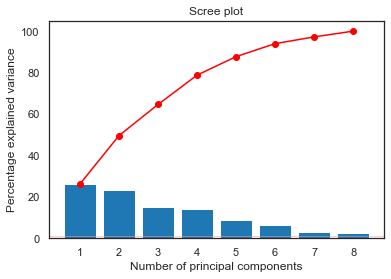

In [285]:
from matplotlib.ticker import MaxNLocator


def display_scree_plot(pca):
    """Display a scree plot for the pca"""
    # scree = pca.explained_variance_
    scree = pca.explained_variance_ratio_ * 100
    plt.bar(np.arange(len(scree)) + 1, scree)
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), c="red", marker='o')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    # plt.xlabel('Principal Component')
    # plt.ylabel('Eigenvalue')
    plt.axhline(y=1, linewidth=1, color='r', alpha=0.5)
    plt.title('Scree Plot of PCA: Component Eigenvalues')

    plt.xlabel("Number of principal components")
    plt.ylabel("Percentage explained variance")
    plt.title("Scree plot")
    # plt.show(block=False)


display_scree_plot(pca)
to_png(f'pca_var_explained_scree_plot')


x = 8; y = 8
"pca_var_explained_scree_plot_like.png"


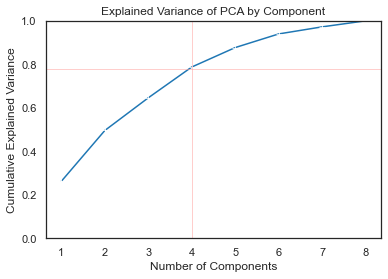

In [286]:
def var_explained(pca):
    import numpy as np
    from matplotlib.ticker import MaxNLocator

    # ax = figure().gca()
    x = np.arange(1, len(pca.explained_variance_ratio_) + 1)
    y = np.cumsum(pca.explained_variance_ratio_)
    print(f'x = {len(x)}; y = {len(y)}')

    ax = sns.lineplot(x=x, y=y, marker='+')
    ax.set_ylim((0, 1))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.axvline(x=4, linewidth=1, color='r', alpha=0.5)
    plt.axhline(y=0.78, linewidth=1, color='r', alpha=0.5)
    plt.title('Explained Variance of PCA by Component')
    # plt.show()


var_explained(dpca)
to_png(f'pca_var_explained_scree_plot_like')


### PCA Cercle des corrélations


In [287]:
from matplotlib.collections import LineCollection


def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:  # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7, 6))

            # détermination des limites du graphique
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(
                    pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(
                    lines, axes=ax, alpha=.1, color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if xmin <= x <= xmax and ymin <= y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation, color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel(
                f'PC{d1 + 1} ({round(100 * pca.explained_variance_ratio_[d1], 1)}%)')
            plt.ylabel(
                f'PC{d2 + 1} ({round(100 * pca.explained_variance_ratio_[d2], 1)}%)')

            plt.title(f'Cercle des corrélations (PC{(d1 + 1)} et PC{(d2 + 1)})')
            to_png(f'pca_display_circles_(PC{(d1 + 1)}_et_PC{(d2 + 1)})')
            plt.show(block=False)


"pca_display_circles_(PC1_et_PC2).png"


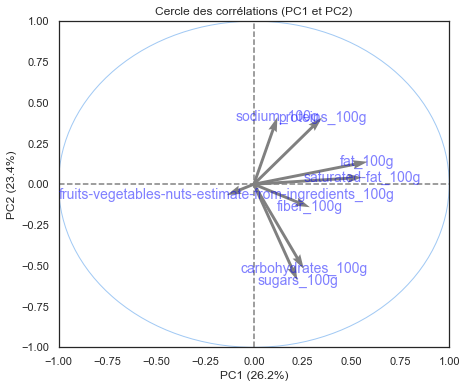

"pca_display_circles_(PC3_et_PC4).png"


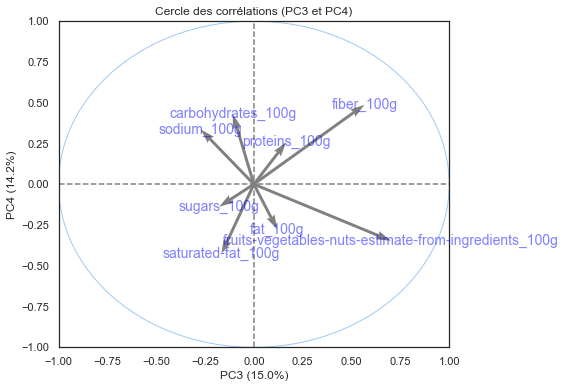

"pca_display_circles_(PC5_et_PC6).png"


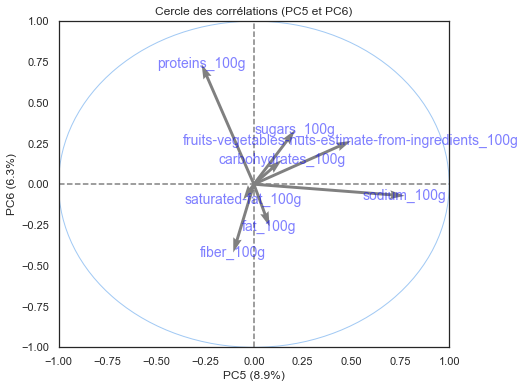

In [288]:


display_circles(pcs=dpca.components_, n_comp=n_comp, pca=dpca, axis_ranks=[
    (0, 1), (2, 3), (4, 5)], labels=np.array(features))


In [289]:
for_visual = target_df[['id']].join(pc_df, how='inner')
for_visual.head()
pc_df = pc_df.rename_axis('id')


In [290]:
for_visual = pc_df.join(cleaned_data, how='inner')
for_visual[for_visual['PC2'] > 10].index


Int64Index([], dtype='int64')

In [291]:
def explode_by_series(df:pd.DataFrame, col, exclude_groups=None):
    # si la colonne est numérique, pas besoin de traitement
    if df[col].dtype.kind in 'biufc':
        df = df.dropna(subset=[col]).copy()
        df[col] = df[col].astype(str)
        return df
    ret = df.dropna().copy()

    ret[col] = ret[col].str.split(',')
    ret = ret.explode(col)
    return ret


# feature='additives_tags'
# feature = 'nutriscore_grade'
feature = 'risk_high_n'
explode_by_series(for_visual[['PC1', 'PC2', feature]], feature).tail()


,PC1,PC2,risk_high_n
99975,-0.54,0.87,1.0
99977,2.75,1.64,0.0
99980,-0.59,1.27,2.0
99984,-1.71,0.24,0.0
99995,1.53,0.49,1.0


In [292]:
def display_factorial_planes(x_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    """Display a scatter plot on a factorial plane, one for each factorial plane"""

    # For each factorial plane
    for d1, d2 in axis_ranks:
        if d2 < n_comp:

            # Initialise the matplotlib figure
            fig = plt.figure(figsize=(7, 6))

            # Display the points
            if illustrative_var is None:
                plt.scatter(x_projected[:, d1],
                            x_projected[:, d2], alpha=alpha, s=1)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(
                        x_projected[selected, d1], x_projected[selected, d2], alpha=alpha, label=value, s=1)
                plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i, (x, y) in enumerate(x_projected[:, [d1, d2]]):
                    plt.text(x, y, labels[i],
                             fontsize='14', ha='center', va='center')

            # Define the limits of the chart
            boundary = np.max(np.abs(x_projected[:, [d1, d2]])) * 1.1
            plt.xlim([-boundary, boundary])
            plt.ylim([-boundary, boundary])

            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(
                d1 + 1, round(100 * pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel('PC{} ({}%)'.format(
                d2 + 1, round(100 * pca.explained_variance_ratio_[d2], 1)))

            plt.title(
                "Projection of points (on PC{} and PC{})".format(d1 + 1, d2 + 1))
            to_png(f'pca_display_factorial_planes_(PC{(d1 + 1)}_et_PC{(d2 + 1)})')
            plt.show(block=False)


"pca_display_factorial_planes_(PC1_et_PC2).png"


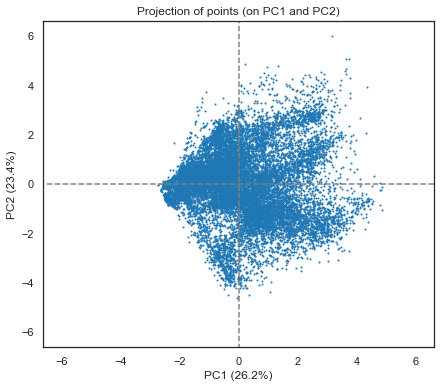

"pca_display_factorial_planes_(PC3_et_PC4).png"


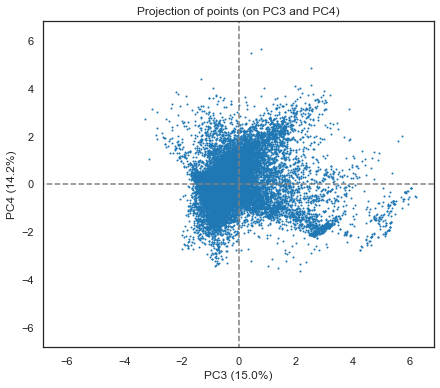

"pca_display_factorial_planes_(PC5_et_PC6).png"


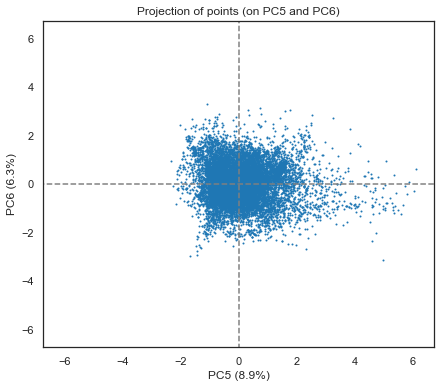

In [293]:
# Projection des individus
x_projected = pca.transform(X_scaled_df)
display_factorial_planes(x_projected, n_comp, dpca, [
    (0, 1), (2, 3), (4, 5)], labels=None)


"pca_plot_components_nutriscore_grade_(PC1_et_PC2).png"


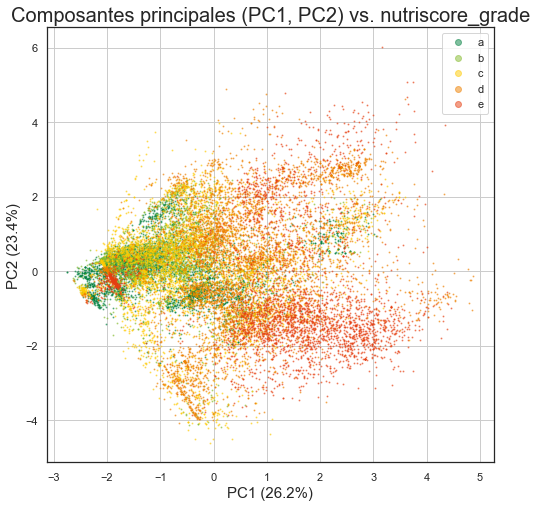

"pca_plot_components_nova_group_(PC1_et_PC2).png"


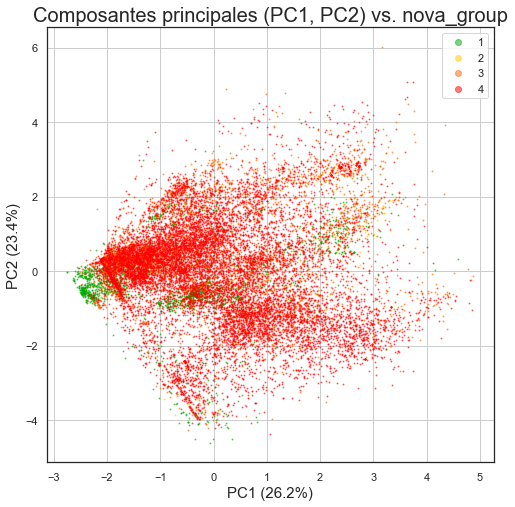

pnns_groups_1, exclude nb: 2
"pca_plot_components_pnns_groups_1_(PC1_et_PC2).png"


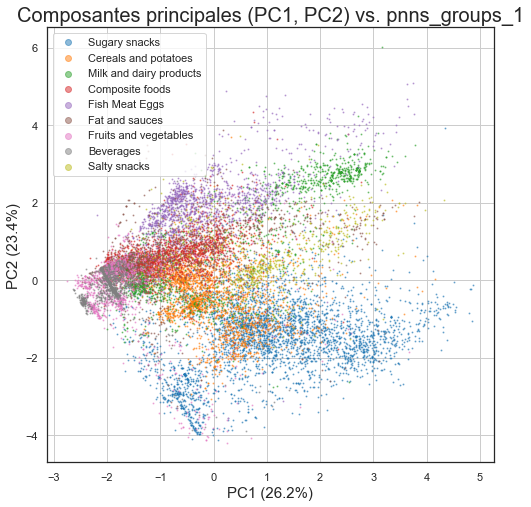

"pca_plot_components_addiscore_risk_(PC1_et_PC2).png"


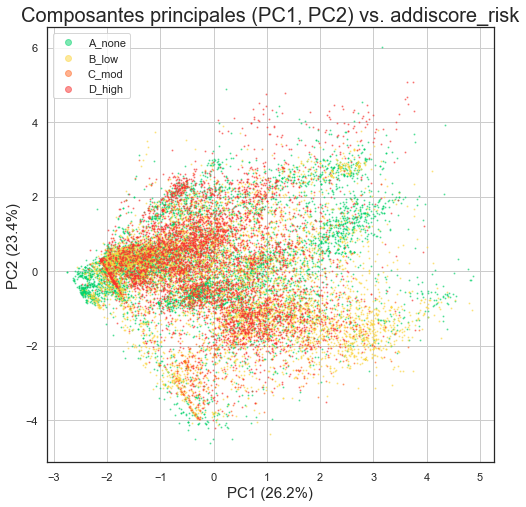

risk_high_n, exclude nb: 2
"pca_plot_components_risk_high_n_(PC1_et_PC2).png"


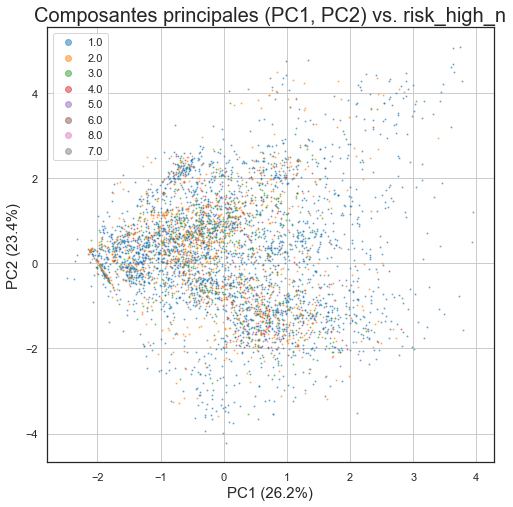

additives_en, exclude nb: 317
"pca_plot_components_additives_en_(PC1_et_PC2).png"


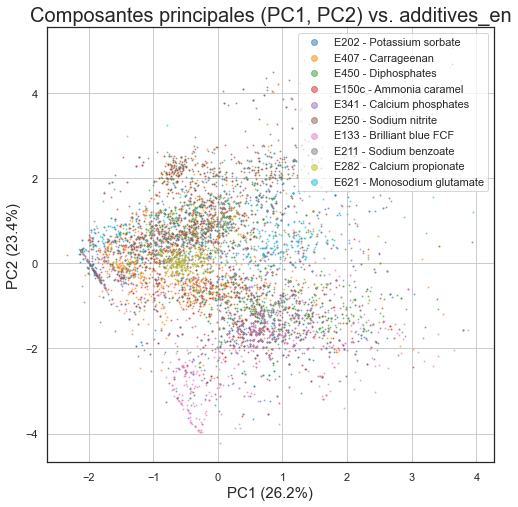

additives_tags, exclude nb: 317
"pca_plot_components_additives_tags_(PC1_et_PC2).png"


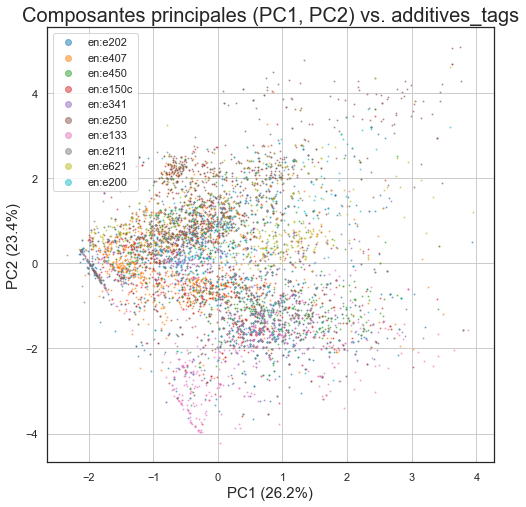

"pca_plot_components_nutriscore_grade_(PC3_et_PC4).png"


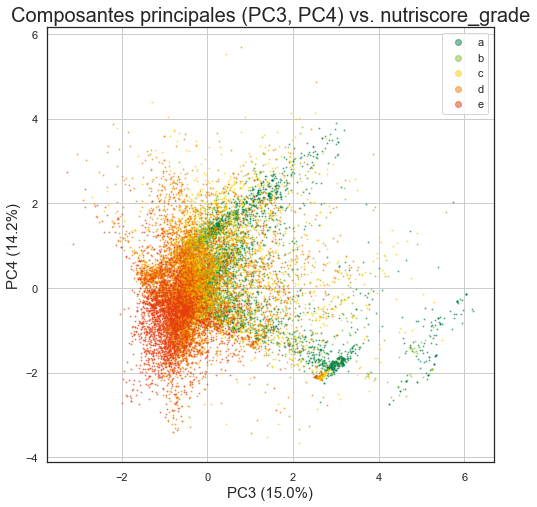

pnns_groups_1, exclude nb: 2
"pca_plot_components_pnns_groups_1_(PC3_et_PC4).png"


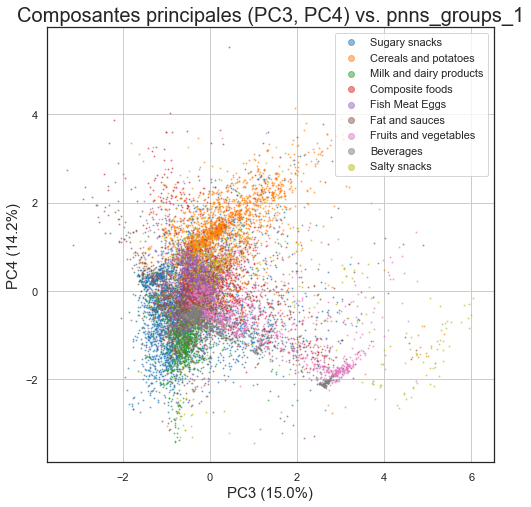

In [294]:
def plot_components(data, axis1='PC1', axis2='PC2', feature='nutriscore_grade',
                    exclude_groups=None, size=1):
    """Version simplifiée de display_factorial_planes """
    df = explode_by_series(
        data[[axis1, axis2, feature]], feature, exclude_groups)
    # return df.shape
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1)

    d1 = int(axis1[2:]) - 1
    d2 = int(axis2[2:]) - 1
    # Label the axes, with the percentage of variance explained
    ax.set_xlabel(f'{axis1} ({100 * pca.explained_variance_ratio_[d1]:.1f}%)', fontsize=15)
    ax.set_ylabel(f'{axis2} ({100 * pca.explained_variance_ratio_[d2]:.1f}%)', fontsize=15)
    # ax.set_xlabel(axis1, fontsize=15)
    # ax.set_ylabel(axis2, fontsize=15)

    ax.set_title(
        f'Composantes principales ({axis1}, {axis2}) vs. {feature}', fontsize=20)

    palette = get_palette_df(df, feature, exclude_values=exclude_groups)
    groups = palette.keys()
    colors = palette.values()
    for group, color in zip(groups, colors):
        if group != 'unknown':
            indices_to_keep = df[feature] == group
            ax.scatter(df.loc[indices_to_keep, axis1],
                       df.loc[indices_to_keep, axis2],
                       c=color, alpha=0.5, s=size)
    # ax.legend(groups,bbox_to_anchor=(1.2,0.5),loc="center right", fontsize=12,
    # bbox_transform=plt.gcf().transFigure)
    ax.legend(groups, markerscale=6)
    ax.grid()
    # plt.subplots_adjust(left=0.0, bottom=0.1, right=0.4)
    plt.subplots_adjust()
    to_png(f'pca_plot_components_{feature}_({axis1}_et_{axis2})')
    plt.show()


plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='nutriscore_grade')
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='nova_group')
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])

plot_components(for_visual, axis1='PC1', axis2='PC2', feature='addiscore_risk')
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='risk_high_n',
                exclude_groups=['0', '0.0'])

plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_en', exclude_groups=safe_additives['name'])
plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_tags', exclude_groups=safe_additives['id'])
plot_components(for_visual, axis1='PC3', axis2='PC4')
plot_components(for_visual, axis1='PC3', axis2='PC4', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])



"pca_plot_components_pnns_groups_2_(PC1_et_PC2).png"


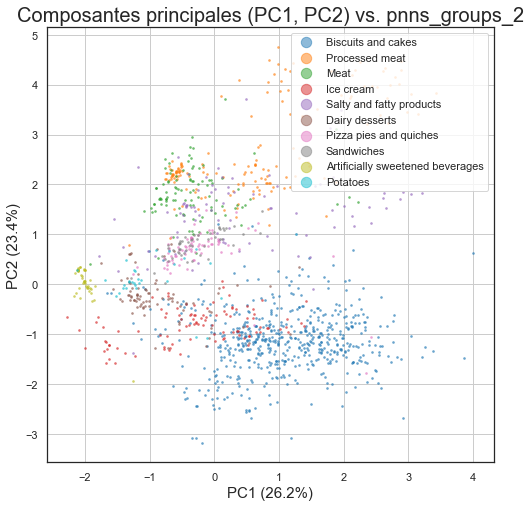

In [295]:
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC1', axis2='PC2', feature='pnns_groups_2', size=3)
 )

"pca_plot_components_addiscore_risk_(PC1_et_PC2).png"


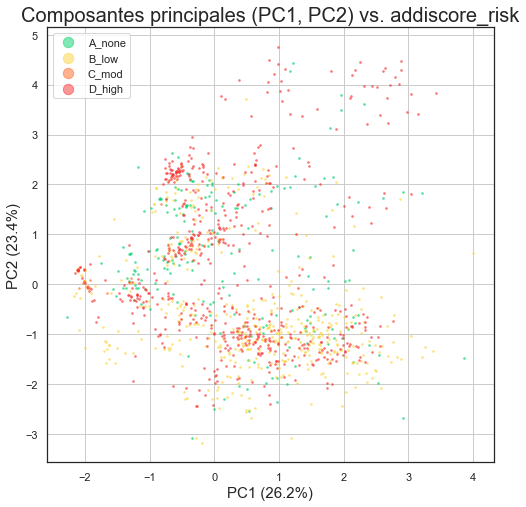

"pca_plot_components_addiscore_risk_(PC3_et_PC4).png"


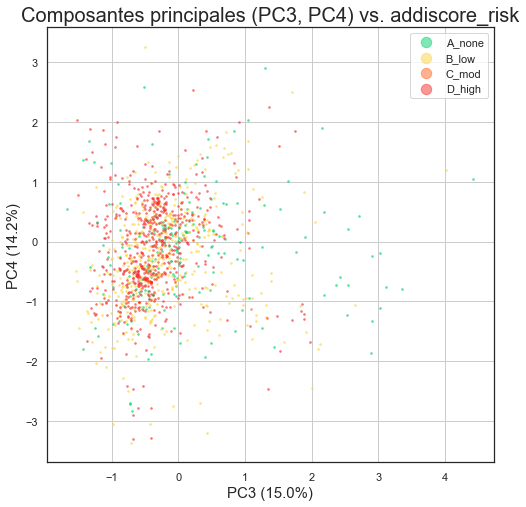

In [296]:
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC1', axis2='PC2', feature='addiscore_risk', size=3)
 )
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC3', axis2='PC4', feature='addiscore_risk', size=3)
 )

In [297]:
for_visual[for_visual['PC2'] > 20]['product_name']


Series([], Name: product_name, dtype: object)

In [298]:
dpca.explained_variance_ratio_


array([0.26202581, 0.23358023, 0.15031797, 0.141636  , 0.08946087,
       0.06269872, 0.03254546, 0.02773494])

"pca_var_explained_scree_plot_barplot.png"


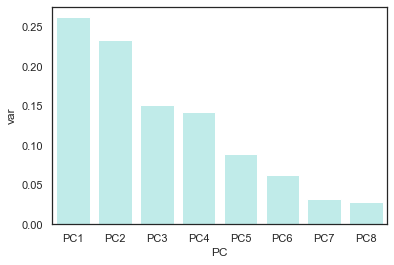

In [299]:
def plot_scree():
    df = pd.DataFrame({'var': dpca.explained_variance_ratio_,
                       'PC': nom_cols})
    sns.barplot(x='PC', y="var",
                data=df, color="c")
    to_png(f'pca_var_explained_scree_plot_barplot')


plot_scree()

# 9. Système de Recommendation

- trouver la produit (ou plusieurs avec la même nom)
- identifier le 'main_category_en' du produit
- select autres produits dans ce categorie
- si autres produits
    - trier par addiscore
    - offre le meilleur nutrigrade dans les top addiscore

In [300]:
def flatten(lists: list, exclude='in,is,,with'.split(',')) -> list:
    flat_list = []
    for sublist in lists:
        for item in sublist:
            if not (item in exclude):
                flat_list.append(item)
    return flat_list


def search_words(search_str: str) -> list:
    words = search_str.split(' ')
    words = [w.split(',') for w in words]
    words = flatten(words)
    return words


def trouver_produit(df:pd.DataFrame, nom='chicken sandwich, with bacon'):
    words = search_words(nom)
    filtre = True
    for word in words:
        filtre &= df['product_name'].str.contains(word, case=False)
    return df[filtre]

    # .dropna(subset=['main_category_en'])


def filtre_top_n(df:pd.DataFrame, col='pnns_groups_2', nb=1):
    groups = df[col].value_counts()
    nb = max(nb, 1)
    nb = min(nb, len(groups))
    top_groups = groups.index.to_list()[:nb]
    print(f'top_group: {top_groups}')
    if not (isinstance(top_groups, list)): top_groups = [top_groups]
    return df[df[col].isin(top_groups)]


def affiche_meilleur_pire_produits(product_name):
    products = (cleaned_data
                .pipe(filter_by_country, 'France')
                .pipe(trouver_produit, product_name)
                .dropna(subset=['nutriscore_score', 'addiscore'])
                .pipe(filtre_top_n, 'pnns_groups_2', 1)
                )

    print(f'{len(products)} produits')
    # cols=['product_name', 'brands_tags', 'categories_en', 'labels_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g', 'risk_mod_n', 'risk_high_n', 'risk_low_n', 'addiscore', 'addiscore_risk']

    df = pd.DataFrame([], columns=products.columns)
    s1 = products.sort_values(by='addiscore', ascending=True).head(1)
    s2 = products.sort_values(by='addiscore', ascending=False).head(1)
    s3 = products.sort_values(by='nutriscore_score', ascending=True).head(1)
    s4 = products.sort_values(by='nutriscore_score', ascending=False).head(1)
    df = s1.append(s2).append(s3).append(s4)
    df['categ'] = ['meilleur addiscore', 'pire addiscore', 'meilleur nutriscore', 'pire nutriscore']
    return df


cols1 = ['product_name', 'brands_tags', 'nutriscore_score', 'nutriscore_grade', 'addiscore', 'addiscore_risk',
         'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'main_category_en', 'additives_n', 'risk_mod_n', 'risk_high_n',
         'risk_low_n']
affiche_meilleur_pire_produits('sandwich')[cols1]

# TODO
# products.pipe(crosstab_normalize,'nova_group','nutriscore_grade', normalize=False)
# products.pipe(plot_barh_stacked)

top_group: ['Sandwiches']
30 produits


,product_name,brands_tags,nutriscore_score,nutriscore_grade,addiscore,addiscore_risk,nova_group,pnns_groups_1,pnns_groups_2,main_category_en,additives_n,risk_mod_n,risk_high_n,risk_low_n
93415,Sandwich de pain de mie aux céréales thon et crudités,u,-1.0,a,0.0,A_none,4,Composite foods,Sandwiches,Raw-vegetable-sandwiches,0,0.0,0.0,0.0
65066,Sandwich jambon mayonnaise allégée,roland-monterrat,5.0,c,33.0,D_high,4,Composite foods,Sandwiches,Ham sandwiches,13,0.0,5.0,8.0
8255,"Sandwich au pain de mie complet garni de thon émincé au naturel, de crudités et d'oeuf",u,-2.0,a,6.0,B_low,4,Composite foods,Sandwiches,Raw-vegetable-sandwiches,6,0.0,0.0,6.0
69064,Sandwich simple & bon! rosette,sodebo,17.0,d,11.0,D_high,4,Composite foods,Sandwiches,Rosette Sandwiches,3,0.0,2.0,1.0


In [301]:
affiche_meilleur_pire_produits('glace')[cols1]

top_group: ['Ice cream']
32 produits


,product_name,brands_tags,nutriscore_score,nutriscore_grade,addiscore,addiscore_risk,nova_group,pnns_groups_1,pnns_groups_2,main_category_en,additives_n,risk_mod_n,risk_high_n,risk_low_n
93625,Pur' Fruit Glaces Bâtonnet Mangue Pomme & Banane 6x 40ml,pur-fruit,-4.0,a,0.0,A_none,3,Milk and dairy products,Ice cream,Ice cream bars,0,0.0,0.0,0.0
16681,Moelleux et noisettes caramélisées glace vanille,"la-laitiere,nestle",12.0,d,18.0,D_high,4,Milk and dairy products,Ice cream,Ice cream tubs,10,0.0,2.0,8.0
93625,Pur' Fruit Glaces Bâtonnet Mangue Pomme & Banane 6x 40ml,pur-fruit,-4.0,a,0.0,A_none,3,Milk and dairy products,Ice cream,Ice cream bars,0,0.0,0.0,0.0
58950,Batonnets de glace,what-the-french,19.0,e,3.0,B_low,4,Milk and dairy products,Ice cream,Ice cream bars,3,0.0,0.0,3.0


en:e482|en:e432|en:e228|en:e131|en:e407|en:e133|en:e436|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e508|en:e212|en:e492|en:e433|en:e435|en:e338|en:e343|en:e511|en:e142|en:e473|en:e210|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450
nutriscore_grade           a    b    c    d    e  sum
additives_en                                         
E330 - Citric acid       298  143  251  177  108  977
E440 - Pectins            21   25  128   98   10  282
E415 - Xanthan gum        26   30   52   78   28  214
E300 - Ascorbic acid      72   20   48   17   38  195
E14XX - Modified Starch   28   54   51   21    5  159


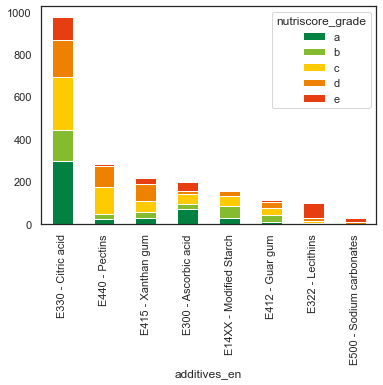

In [302]:
(cleaned_data
 .pipe(get_safe_products)
 .pipe(plot_repartition_by_tag,'additives_en')
 )

## 9.2 Autres systems de recommendation 
###  Clustering via K Means

K-means : unsupervised --> creates (new) classes if a new feature is needed (ex: if wish to do KNN but don't have any labels yet)
KNN : supervised --> after training, can attribute unlabeled individuals to an existing label (class)

- Explanation

  - <https://towardsdatascience.com/getting-acquainted-with-k-nearest-neighbors-ba0a9ecf354f>
  - <https://www.datasciencecentral.com/profiles/blogs/k-nearest-neighbor-algorithm-using-python>
    - The kNN task can be broken down into writing 3 primary functions:
      1. Calculate the distance between any two points
      2. Find the nearest neighbours based on these pairwise distances
      3. Majority vote on a class labels based on the nearest neighbour list
  - <https://stats.stackexchange.com/questions/56500/what-are-the-main-differences-between-k-means-and-k-nearest-neighbours>

- Imputation

  - <https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/>
    - with train test verification before applying the imputation
  - <https://medium.com/@kyawsawhtoon/a-guide-to-knn-imputation-95e2dc496e>

- visualisation
  - <https://towardsdatascience.com/knn-visualization-in-just-13-lines-of-code-32820d72c6b6>
- using sparse matrices (500000 columns!!) and cosine similarity

  - <https://towardsdatascience.com/prototyping-a-recommender-system-step-by-step-part-1-knn-item-based-collaborative-filtering-637969614ea>

- Movie Recommender System Using K-Means Clustering AND K-Nearest Neighbor

  - <https://ieeexplore.ieee.org/document/8776969>
  - <https://github.com/BenChristensen12/movie-recommender-system>

- Step-by-step (movie) recommendation system based on tags similarity (actors, genres, description)

  - <https://www.analyticsvidhya.com/blog/2020/08/recommendation-system-k-nearest-neighbors/>
  - <https://www.kaggle.com/heeraldedhia/movie-ratings-and-recommendation-using-knn>
  - could replace with tag column similarities (brand, categories_en, ingredients)
    input label name --> find product with the closest name, then use recommender to recommend similar products

- Pipelines
  - <https://stackoverflow.com/questions/50335203/how-to-apply-knn-on-a-mixed-datasetnumerical-categorical-after-doing-one-hot>


# 10. Conclusion : Comment éviter les additifs (nocifs) dans les plats prêts à consommer


# 11 Wordclouds 

- note: la bibliothèque de wordclouds n'est pas mantenu - il faut python 3.7 pour que ça marche
- j'ai copié le source du bibliothèque (dossier (wordcloud) et désactivé la cython qui bogue sur python 3.9
- c'est plus lent (20 s à 1 minute), mais ça marche 

## 11.1 Wordclouds - types de produit (main_category_en) contenant des additifs nocifs


In [303]:

sans_interet = 'of,and,it,(%),in,to,with,by,for,who,are,the,-'.split(',')


def top_words(df:pd.DataFrame, col, nb=20):
    words = []
    for lab in df[col]:
        words += lab.split(" ")
    counter = Counter(words)
    return counter.most_common(nb)


def top_tags(df:pd.DataFrame, col, nb=20):
    count = df[col].str.split(',').explode().value_counts().head(nb)
    return count.to_frame(name='count').rename_axis('word').reset_axis()


def common_word_count(df:pd.DataFrame, col, nb=20):
    c = top_words(df, col, nb=nb)
    ret = pd.DataFrame.from_records(c, columns=['word', 'count'])
    filtre = ret['word'].isin(sans_interet)
    ret = ret[~filtre]
    return ret


In [304]:
from collections import Counter


def count_word_freq(df:pd.DataFrame, col='', sep=',', nb=30):
    """count frequency of words or tags in a column, 
       return a dictionary, with size based on tag
       If sep=',' fastest is to explode column and count values
       If sep=' ', use counter + STOPWORDS to get word count
    """
    if sep == ',':
        count = df[col].str.split(',').explode().value_counts()
        return dict(zip(count.index, count.values))


In [305]:
from wordcloud import WordCloud


def plot_wordcloud(df:pd.DataFrame, tags_col='main_category_en', sep=',', nb=30,
                   include_words=None, exclude_words=[],
                   width=960, height=1080, colormap='PuBuGn',
                   background_color='black', mode='RGBA'):
    """count frequency of tags in a tag column, 
       return a wordcloud, with size based on tag
       If sep=' ', use counter + STOPWORDS to get word count
       If sep=',' fastest is to explode column and count values
       dimensions 960 x 1080 == half screen
    """
    words = []
    series = df[tags_col].dropna()
    print(f'wordcloud, {series.shape}')

    for string in series:
        listwords = str(string).split(sep)
        for w in listwords:
            if (w != ' ') and (w != 'nan'):
                w = w.strip()
                if tags_col == 'ingredients_text' and len(w) > 2:
                    if w[-1] == '.': w = w[:-1]
                if include_words is None:
                    if not (w in exclude_words):
                        words.append(w)
                else:
                    if w in include_words:
                        words.append(w)

    count = dict(Counter(words).most_common(nb))
    # return count
    # wordcloud = WordCloud(width=width, height=height,
    #                       prefer_horizontal=1,  # pas de mots verticals
    #                       colormap=colormap,
    #                       background_color=background_color,
    #                       mode=mode).fit_words(count)
    # plt.figure(figsize=(25, 15))
    # plt.imshow(wordcloud, interpolation='bilinear')
    # plt.axis('off')
    # plt.margins(x=0, y=0)



### Wordcloud - additifs à risque élevé
addiscore_risk == D_high

In [306]:
# filtre ne marche pas sur additives_en - 

(cleaned_data
 .dropna(subset=['additives_tags'])
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=high_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
).head(10)
#  .pipe(plot_wordcloud, tags_col='additives_en',
#        include_words=high_risk_additives['name'].tolist(),
#        height=540, colormap='Reds'))
# to_png(f'E1.5_wordcloud_high_risk_additives')

en:e482|en:e228|en:e407|en:e339|en:e200|en:e481|en:e223|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e155|en:e341|en:e221|en:e211|en:e212|en:e492|en:e338|en:e343|en:e473|en:e210|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e450


,name,freq
0,E250 - Sodium nitrite,626.0
1,E450 - Diphosphates,589.0
2,E407 - Carrageenan,495.0
3,E202 - Potassium sorbate,456.0
4,E450i - Disodium diphosphate,188.0
5,E451 - Triphosphates,146.0
6,E621 - Monosodium glutamate,142.0
7,E252 - Potassium nitrate,141.0
8,E452 - Polyphosphates,105.0
9,E224 - Potassium metabisulphite,97.0


### Wordcloud - additifs à risque modéré
addiscore_risk == C_mod

In [307]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=mod_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .head(10)
)
#  .pipe(plot_wordcloud, tags_col='additives_en',
#        include_words=mod_risk_additives['name'].tolist(),
#        height=240, colormap='Oranges'))
# to_png(f'E1.5_wordcloud_mod_risk_additives')

en:e432|en:e131|en:e133|en:e436|en:e509|en:e150c|en:e508|en:e433|en:e435|en:e511|en:e142|en:e960


,name,freq
0,E133 - Brilliant blue FCF,51.0
1,E150c - Ammonia caramel,50.0
2,E960 - Steviol glycosides,47.0
3,E509 - Calcium chloride,46.0
4,E131 - Patent blue v,21.0
5,E1422 - Acetylated distarch adipate,13.0
6,E508 - Potassium chloride,11.0
7,E435 - Polyoxyethylene sorbitan monostearate,9.0
8,E1420 - Acetylated starch,3.0
9,E433 - Polyoxyethylene sorbitan monooleate,2.0


### Wordcloud - additifs à risque bas
addiscore_risk == B_low

In [308]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=low_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .head(10)
)
#         .pipe(plot_wordcloud, tags_col='additives_en',
#               include_words=low_risk_additives['name'].tolist(),
#               height=500, width=600,
#               colormap='Greens', mode='RGBA')
# )
# to_png(f'E1.5_wordcloud_low_risk_additives')

en:e1412|en:e100|en:e1404|en:e472c|en:e304|en:e451ii|en:e452ii|en:e1440|en:e324|en:e555|en:e282|en:e443|en:e104|en:e172|en:e484|en:e450v|en:e166|en:e420ii|en:e626|en:e322i|en:e375|en:e342|en:e140ii|en:e150d|en:e263|en:e585|en:e521|en:e900b|en:e900|en:e924a|en:e503ii|en:e579|en:e1442|en:e925|en:e468|en:e129|en:e631|en:e260|en:e170|en:e1510|en:e520|en:e1100|en:e310|en:e174|en:e553ai|en:e225|en:e472b|en:e143|en:e553a|en:e504|en:e124|en:e409|en:e422|en:e270|en:e321|en:e302|en:e300|en:e440a|en:e307b|en:e928|en:e553b|en:e452vi|en:e920|en:e127|en:e1203|en:e460i|en:e160aiv|en:e249|en:e307|en:e1521|en:e1518|en:e297|en:e952|en:e421|en:e1504|en:e233|en:e958|en:e160|en:e476|en:e330|en:e1420|en:e942|en:e551|en:e327|en:e350|en:e472a|en:e141i|en:e151|en:e1102|en:e526|en:e350ii|en:e150b|en:e406|en:e1105|en:e339i|en:e501i|en:e635|en:e325|en:e130|en:e949|en:e1414|en:e954|en:e904|en:e515|en:e332ii|en:e262|en:e902|en:e464|en:e242|en:e553|en:e262ii|en:e418|en:e333iii|en:e218|en:e281|en:e501ii|en:e961|en:e3

,name,freq
0,E330 - Citric acid,1570.0
1,E322 - Lecithins,1184.0
2,E322i - Lecithin,1029.0
3,E14XX - Modified Starch,883.0
4,E500 - Sodium carbonates,861.0
5,E300 - Ascorbic acid,671.0
6,E415 - Xanthan gum,661.0
7,E471 - Mono- and diglycerides of fatty acids,656.0
8,E440 - Pectins,603.0
9,E412 - Guar gum,549.0


#### Wordcloud - ingredients dans processed meat

In [309]:
(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(top_n_freq, 'ingredients_text',nb=30)
)

#  .pipe(plot_wordcloud, tags_col='ingredients_text',
#        exclude_words='eau,water,salt,sel,sugar,sucre,Dextrose,'.split(','),
#        height=500,
#        colormap='flare', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_processed_meat_ingredients')

,ingredients_text,freq
0,dextrose,365.0
1,sel,350.0
2,salt,249.0
3,water,192.0
4,sodium erythorbate,144.0
...,...,...
26,Jambon de porc,41.0
27,Speisesalz,41.0
28,flavorings,40.0
29,poivre,38.0


#### Wordcloud - Nova group 4 main categories

In [310]:
(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(top_n_freq,'main_category_en')
 )

#  .pipe(plot_wordcloud, tags_col='main_category_en', nb=14, height=400, colormap='Spectral', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_nova_4_main categories')

,main_category_en,freq
0,Snacks,949.0
1,Biscuits,625.0
2,Confectioneries,598.0
3,Sauces,436.0
4,Frozen desserts,388.0
...,...,...
6,Breads,329.0
7,Cheeses,328.0
8,Frozen foods,308.0
9,Sweetened beverages,256.0


#### Wordcloud - (main categories) de produits qui contient sodium nitrite

In [311]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e250')
 .pipe(top_n_freq,'main_category_en')
 )
 
#  .pipe(plot_wordcloud, tags_col='main_category_en',
#        nb=20, height=400,
#        colormap='Greens', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_sodium_nitrite_main categories')

,main_category_en,freq
0,Prepared meats,135.0
1,Sausages,87.0
2,White hams,64.0
3,Pizzas,59.0
4,Salami,30.0
...,...,...
6,Hams,26.0
7,Frozen foods,25.0
8,Smoked sausages,20.0
9,Snacks,19.0


In [312]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e202')
 .pipe(top_n_freq,'main_category_en')
 )


#  .pipe(plot_wordcloud, tags_col='main_category_en',
#        nb=20, height=400,
#        colormap='Reds', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_potassium_sorbate_main categories')

,main_category_en,freq
0,Cakes,153.0
1,Sauces,78.0
2,Dips,49.0
3,Yogurts,44.0
4,Cheeses,44.0
...,...,...
6,Sweetened beverages,40.0
7,Frozen desserts,38.0
8,Pastries,34.0
9,Frozen foods,24.0


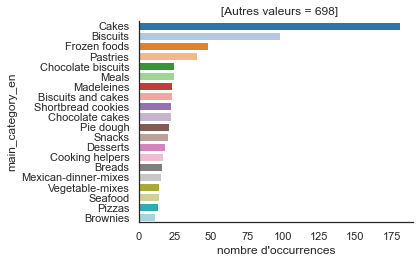

In [313]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e450')
#  .pipe(top_n_freq,'main_category_en')
 .pipe(plot_bar_top_n,'main_category_en')
 )

#  .pipe(plot_wordcloud, tags_col='main_category_en',
#        nb=9, height=310,
#        colormap='YlOrBr', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_diphosphates_main categories')

In [314]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e407')
 .pipe(top_n_freq,'main_category_en')
 )


#  .pipe(plot_wordcloud, tags_col='main_category_en',
#        nb=10, height=260,
#        colormap='pink', mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_carrageenan_main categories')

,main_category_en,freq
0,Frozen desserts,208.0
1,Cheeses,48.0
2,Ice creams,41.0
3,Cakes,39.0
4,Yogurts,38.0
...,...,...
6,Creams,27.0
7,Milks,27.0
8,Beverages,26.0
9,Prepared meats,22.0


In [315]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e133')
 .pipe(top_n_freq,'main_category_en')
 )


#  .pipe(plot_wordcloud, tags_col='main_category_en',
#        nb=8, height=150, width=600,
#        colormap=sns.light_palette("cyan", as_cmap=True), mode='RGBA')
#  )
# to_png(f'E1.5_wordcloud_brilliant_blue_main categories')

,main_category_en,freq
0,Confectioneries,258.0
1,Biscuits,80.0
2,Cakes,62.0
3,Snacks,56.0
4,Frozen desserts,45.0
...,...,...
6,Baking-decorations,20.0
7,Chocolate candies,20.0
8,Salted-snacks,12.0
9,Candies,12.0
